# **IMPORT MODULES**

In [1]:
!pip install yfinance
import yfinance as yf

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import datetime as dt
import sklearn.mixture as mix
import plotly.express as px
from datetime import datetime
import scipy
import random
from sklearn.decomposition import PCA
from datetime import timedelta
import cvxpy as cp
import cvxopt as opt
from cvxopt import blas, solvers

import warnings
warnings.filterwarnings("ignore") 

# **LOAD DATA**

In [3]:
# dataframes = []
# factors = []
# start_date = '2002-04-01'
# end_date = '2022-08-31'

### **CORE MACRO**

In [4]:
# core_macro = []

**INTEREST RATE**

In [5]:
# interest_rate = pd.read_csv("https://raw.githubusercontent.com/DN612/Capstone-Regime-Detection/main/Data/Barclays%20Global%20Aggregate%20Bond%20Index.csv")
# interest_rate['Date'] = interest_rate['Date'].apply(lambda x: datetime.strptime(x, '%d-%m-%Y'))
# interest_rate = interest_rate.rename(columns = {interest_rate.columns[0]:"Date", interest_rate.columns[1]:"Interest Rate"})
# interest_rate = interest_rate.loc[(interest_rate['Date'] >= start_date) & (interest_rate['Date'] <= end_date)]
# interest_rate['Interest Rate'] = interest_rate['Interest Rate'].astype(float)
# interest_rate = interest_rate.set_index('Date')
# interest_rate = interest_rate.sort_index(ascending = True)
# core_macro.append(interest_rate)
# interest_rate

**EQUITY**

In [6]:
# equity = pd.read_csv("https://raw.githubusercontent.com/DN612/Capstone-Regime-Detection/main/Data/MSCI%20All%20Country%20World%20Index.csv")
# equity['Date'] = equity['Date'].apply(lambda x: datetime.strptime(x, '%d-%m-%Y'))
# equity = equity.rename(columns = {equity.columns[0]:"Date", equity.columns[1]:"Equity"})
# equity = equity.loc[(equity['Date'] >= start_date) & (equity['Date'] <= end_date)]
# equity['Equity'] = equity['Equity'].astype(float)
# equity = equity.set_index('Date')
# equity = equity.sort_index(ascending = True)
# core_macro.append(equity)
# equity

**CREDIT**

In [7]:
# paths = ["https://raw.githubusercontent.com/DN612/Capstone-Regime-Detection/main/Data/Bloomberg%20Barclays%20Euro%20Aggregate%20Corporate.csv",
#          "https://raw.githubusercontent.com/DN612/Capstone-Regime-Detection/main/Data/Bloomberg%20Barclays%20Pan-European%20High%20Yield.csv",
#          "https://raw.githubusercontent.com/DN612/Capstone-Regime-Detection/main/Data/Bloomberg%20US%20Corporate%20High%20Yield%20Total%20Return%20Index%20Value%20Unhedged%20USD.csv",
#          "https://raw.githubusercontent.com/DN612/Capstone-Regime-Detection/main/Data/Bloomberg%20Barclays%20US%20Corporate.csv"]
# names = ["Euro Aggregate Corporate",
#          "Pan-European High Yield",
#          "US Corporate High Yield Total Return Index Value Unhedged USD",
#          "US Corporate"]
# dfs = []
# ind = 0

# for file in paths:
#   df = pd.read_csv(file)
#   df['Date'] = df['Date'].apply(lambda x: datetime.strptime(x, '%d-%m-%Y'))
#   name = "Credit " + names[ind]
#   df = df.rename(columns = {df.columns[0]:"Date", df.columns[1]:name})
#   df = df.loc[(df['Date'] >= start_date) & (df['Date'] <= end_date)]
#   df[name] = df[name].astype(float)
#   df = df.set_index('Date')
#   df = df.sort_index(ascending = True)
#   dfs.append(df)
#   ind = ind + 1

# credit = pd.concat(dfs, axis = 1)
# core_macro.append(credit)
# credit

**COMMODITIES**

In [8]:
# commodities = pd.read_csv("https://raw.githubusercontent.com/DN612/Capstone-Regime-Detection/main/Data/SPGSCI.csv")
# commodities['Date'] = commodities['Date'].apply(lambda x: datetime.strptime(x, '%d-%m-%Y'))
# commodities = commodities.rename(columns = {commodities.columns[0]:"Date", commodities.columns[1]:"Commodities"})
# commodities = commodities.loc[(commodities['Date'] >= start_date) & (commodities['Date'] <= end_date)]
# commodities['Commodities'] = commodities['Commodities'].astype(float)
# commodities = commodities.set_index('Date')
# commodities = commodities.sort_index(ascending = True)
# core_macro.append(commodities)
# commodities

In [9]:
# dataframes = dataframes + core_macro
# factors = factors + ["Interest Rate", "Equity", "Credit", "Commodities"]

### **SECONDARY MACRO**

In [10]:
# secondary_macro = []

**EMERGING MARKETS**

In [11]:
# paths = ["https://raw.githubusercontent.com/DN612/Capstone-Regime-Detection/main/Data/MSCI%20Emerging%20Markets%20Index.csv",
#          "https://raw.githubusercontent.com/DN612/Capstone-Regime-Detection/main/Data/Bloomberg%20Barclays%20Emerging%20Markets%20USD%20Aggregate.csv"]
# names = ['MSCI Emerging Markets Index', 'Bloomberg Barclays Emerging Markets USD Aggregate']

# dfs = []
# ind = 0

# for file in paths:
#   df = pd.read_csv(file)
#   df['Date'] = df['Date'].apply(lambda x: datetime.strptime(x, '%d-%m-%Y'))
#   name = "Emerging Markets " + names[ind]
#   df = df.rename(columns = {df.columns[0]:"Date", df.columns[1]:name})
#   df = df.loc[(df['Date'] >= start_date) & (df['Date'] <= end_date)]
#   df[name] = df[name].astype(float)
#   df = df.set_index('Date')
#   df = df.sort_index(ascending = True)
#   dfs.append(df)
#   ind = ind + 1

# emerging_markets = pd.concat(dfs, axis = 1)
# secondary_macro.append(emerging_markets)
# emerging_markets

**FOREIGN CURRENCY**

In [12]:
# paths = ["https://raw.githubusercontent.com/DN612/Capstone-Regime-Detection/main/Data/CAD.csv",
#          "https://raw.githubusercontent.com/DN612/Capstone-Regime-Detection/main/Data/AUD.csv",
#          "https://raw.githubusercontent.com/DN612/Capstone-Regime-Detection/main/Data/CHF.csv",
#          "https://raw.githubusercontent.com/DN612/Capstone-Regime-Detection/main/Data/EURO.csv",
#          "https://raw.githubusercontent.com/DN612/Capstone-Regime-Detection/main/Data/GBP.csv",
#          "https://raw.githubusercontent.com/DN612/Capstone-Regime-Detection/main/Data/JPY.csv",
#          "https://raw.githubusercontent.com/DN612/Capstone-Regime-Detection/main/Data/RMB.csv"]
# names = ['CAD', 'AUD', 'CHF', 'EURO', 'GBP', 'JPY', 'RMB']

# dfs = []
# ind = 0
# for file in paths:
#   df = pd.read_csv(file)
#   df['Date'] = df['Date'].apply(lambda x: datetime.strptime(x, '%d-%m-%Y'))
#   name = "Foreign Currency " + names[ind]
#   df = df.rename(columns = {df.columns[0]:"Date", df.columns[1]:name})
#   df = df.loc[(df['Date'] >= start_date) & (df['Date'] <= end_date)]
#   df[name] = df[name].astype(float)
#   df = df.set_index('Date')
#   df = df.sort_index(ascending = True)
#   dfs.append(df)
#   ind = ind + 1

# foreign_currency = pd.concat(dfs, axis = 1)
# secondary_macro.append(foreign_currency)
# foreign_currency

**LOCAL INFLATION**

In [13]:
# paths = ["https://raw.githubusercontent.com/DN612/Capstone-Regime-Detection/main/Data/Bloomberg%20Barclays%20Euro%20Government%20Inflation-Linked%20Bond%20All%20Maturities.csv",
#          "https://raw.githubusercontent.com/DN612/Capstone-Regime-Detection/main/Data/Bloomberg%20Barclays%20US%20Treasury%20Inflation-Linked%20Notes.csv"]
# names = ['Bloomberg Barclays Euro Government Inflation-Linked Bond All Maturities',
#          'Bloomberg Barclays US Treasury Inflation-Linked Notes']

# dfs = []
# ind = 0
# for file in paths:
#   df = pd.read_csv(file)
#   df['Date'] = df['Date'].apply(lambda x: datetime.strptime(x, '%d-%m-%Y'))
#   name = "Local Inflation " + names[ind]
#   df = df.rename(columns = {df.columns[0]:"Date", df.columns[1]:name})
#   df = df.loc[(df['Date'] >= start_date) & (df['Date'] <= end_date)]
#   df[name] = df[name].astype(float)
#   df = df.set_index('Date')
#   df = df.sort_index(ascending = True)
#   dfs.append(df)
#   ind = ind + 1

# local_inflation = pd.concat(dfs, axis = 1)
# secondary_macro.append(local_inflation)
# local_inflation

**EQUITY SHORT VOLATILITY** (Actually a Macro Style factor, not a Secondary Core factor)

In [14]:
# equity_short_vol = pd.read_csv("https://raw.githubusercontent.com/DN612/Capstone-Regime-Detection/main/Data/CBOE%20S_P%20500%20PutWrite%20Index.csv")
# equity_short_vol['Date'] = equity_short_vol['Date'].apply(lambda x: datetime.strptime(x, '%d-%m-%Y'))
# equity_short_vol = equity_short_vol.rename(columns = {equity_short_vol.columns[0]:"Date", equity_short_vol.columns[1]:"Equity Short Volatility"})
# equity_short_vol = equity_short_vol.loc[(equity_short_vol['Date'] >= start_date) & (equity_short_vol['Date'] <= end_date)]
# equity_short_vol['Equity Short Volatility'] = equity_short_vol['Equity Short Volatility'].astype(float)
# equity_short_vol = equity_short_vol.set_index('Date')
# equity_short_vol = equity_short_vol.sort_index(ascending = True)
# secondary_macro.append(equity_short_vol)
# equity_short_vol

In [15]:
# dataframes = dataframes + secondary_macro
# factors = factors + ['Emerging Market', 'Foreign Currency', 'Local Inflation', 'Equity Short Volatility']

### **MACRO STYLES**

In [16]:
# macro_styles = []

**FIXED INCOME CARRY**

In [17]:
# fi_carry = pd.read_csv("https://raw.githubusercontent.com/DN612/Capstone-Regime-Detection/main/Data/DB%20Rates%20Diversified%20Strategy%20016%20USD%20Index.csv")
# fi_carry['Date'] = fi_carry['Date'].apply(lambda x: datetime.strptime(x, '%d-%m-%Y'))
# fi_carry = fi_carry.rename(columns = {fi_carry.columns[0]:"Date", fi_carry.columns[1]:"Fixed Income Carry"})
# fi_carry = fi_carry.loc[(fi_carry['Date'] >= start_date) & (fi_carry['Date'] <= end_date)]
# fi_carry['Fixed Income Carry'] = fi_carry['Fixed Income Carry'].astype(float)
# fi_carry = fi_carry.set_index('Date')
# fi_carry = fi_carry.sort_index(ascending = True)
# macro_styles.append(fi_carry)
# fi_carry

**FOREIGN EXCHANGE CARRY**

In [18]:
# fx_carry = pd.read_csv("https://raw.githubusercontent.com/DN612/Capstone-Regime-Detection/main/Data/DB%20CoreSeries%20FX%20Carry%20Balanced%20USD%20Index.csv")
# fx_carry['Date'] = fx_carry['Date'].apply(lambda x: datetime.strptime(x, '%d-%m-%Y'))
# fx_carry = fx_carry.rename(columns = {fx_carry.columns[0]:"Date", fx_carry.columns[1]:"Foreign Exchange Carry"})
# fx_carry = fx_carry.loc[(fx_carry['Date'] >= start_date) & (fx_carry['Date'] <= end_date)]
# fx_carry['Foreign Exchange Carry'] = fx_carry['Foreign Exchange Carry'].astype(float)
# fx_carry = fx_carry.set_index('Date')
# fx_carry = fx_carry.sort_index(ascending = True)
# macro_styles.append(fx_carry)
# fx_carry

**TREND FOLLOWING**

In [19]:
# trend = pd.read_csv("https://raw.githubusercontent.com/DN612/Capstone-Regime-Detection/main/Data/DB%20Cross%20Asset%20CTA%20Trend%20Index.csv")
# trend['Date'] = trend['Date'].apply(lambda x: datetime.strptime(x, '%d-%m-%Y'))
# trend = trend.rename(columns = {trend.columns[0]:"Date", trend.columns[1]:"Trend Following"})
# trend = trend.loc[(trend['Date'] >= start_date) & (trend['Date'] <= end_date)]
# trend['Trend Following'] = trend['Trend Following'].astype(float)
# trend = trend.set_index('Date')
# trend = trend.sort_index(ascending = True)
# macro_styles.append(trend)
# trend

In [20]:
# dataframes = dataframes + macro_styles
# factors = factors + ['Fixed Income Carry', 'Foreign Exchange Carry', 'Trend Following']

### **EQUITY STYLES**

In [21]:
# equity_styles = []

**LOW RISK**

In [22]:
# low_risk = pd.read_csv("https://raw.githubusercontent.com/DN612/Capstone-Regime-Detection/main/Data/DB%20Equity%20Low%20Beta%20Factor%202.0%20USD%20Excess%20Return%20Index.csv")
# low_risk['Date'] = low_risk['Date'].apply(lambda x: datetime.strptime(x, '%d-%m-%Y'))
# low_risk = low_risk.rename(columns = {low_risk.columns[0]:"Date", low_risk.columns[1]:"Low Risk"})
# low_risk = low_risk.loc[(low_risk['Date'] >= start_date) & (low_risk['Date'] <= end_date)]
# low_risk['Low Risk'] = low_risk['Low Risk'].astype(float)
# low_risk = low_risk.set_index('Date')
# low_risk = low_risk.sort_index(ascending = True)
# equity_styles.append(low_risk)
# low_risk

**MOMENTUM**

In [23]:
# momentum = pd.read_csv("https://raw.githubusercontent.com/DN612/Capstone-Regime-Detection/main/Data/DB%20Equity%20Momentum%20Factor%202.0%20USD%20Excess%20Return%20Index.csv")
# momentum['Date'] = momentum['Date'].apply(lambda x: datetime.strptime(x, '%d-%m-%Y'))
# momentum = momentum.rename(columns = {momentum.columns[0]:"Date", momentum.columns[1]:"Momentum"})
# momentum = momentum.loc[(momentum['Date'] >= start_date) & (momentum['Date'] <= end_date)]
# momentum['Momentum'] = momentum['Momentum'].astype(float)
# momentum = momentum.set_index('Date')
# momentum = momentum.sort_index(ascending = True)
# equity_styles.append(momentum)
# momentum

**QUALITY**

In [24]:
# quality = pd.read_csv("https://raw.githubusercontent.com/DN612/Capstone-Regime-Detection/main/Data/DB%20Equity%20Quality%20Factor%202.0%20USD%20Excess%20Return%20Index.csv")
# quality['Date'] = quality['Date'].apply(lambda x: datetime.strptime(x, '%d-%m-%Y'))
# quality = quality.rename(columns = {quality.columns[0]:"Date", quality.columns[1]:"Quality"})
# quality = quality.loc[(quality['Date'] >= start_date) & (quality['Date'] <= end_date)]
# quality['Quality'] = quality['Quality'].astype(float)
# quality = quality.set_index('Date')
# quality = quality.sort_index(ascending = True)
# equity_styles.append(quality)
# quality

**VALUE**

In [25]:
# value = pd.read_csv("https://raw.githubusercontent.com/DN612/Capstone-Regime-Detection/main/Data/DB%20Equity%20Value%20Factor%202.0%20USD%20Excess%20Return%20Index.csv")
# value['Date'] = value['Date'].apply(lambda x: datetime.strptime(x, '%d-%m-%Y'))
# value = value.rename(columns = {value.columns[0]:"Date", value.columns[1]:"Value"})
# value = value.loc[(value['Date'] >= start_date) & (value['Date'] <= end_date)]
# value['Value'] = value['Value'].astype(float)
# value = value.set_index('Date')
# value = value.sort_index(ascending = True)
# equity_styles.append(value)
# value

In [26]:
# dataframes = dataframes + equity_styles
# factors = factors + ['Low Risk', 'Momentum', 'Quality', 'Value']

# **FACTOR CONSTRUCTION**

### **AGGREGATION**

In [27]:
# def mergefiles(dfs):
#   data = dfs[0]
#   for i in range(1, len(dfs)):
#     data = data.merge(dfs[i], on = 'Date')
#   return data

In [28]:
# # Combining all factor time series in single dataframe
# time_series = mergefiles(dataframes) 
# time_series.isna().sum()/len(time_series)

In [29]:
# # Taking log-returns of all factors
# log_series = time_series.copy(deep = "True")
# log_series[log_series.columns] = np.log(log_series[log_series.columns]) - np.log(log_series[log_series.columns].shift(1))
# log_series.isna().sum()/len(log_series)

In [30]:
# final_df = log_series.fillna(method='ffill')
# final_df['Credit'] = final_df.iloc[:,2:6].mean(axis=1)
# final_df['Emerging Market'] = final_df.iloc[:,7:9].mean(axis = 1)
# final_df['Foreign Currency'] = final_df.iloc[:,9:16].mean(axis = 1)
# final_df['Local Inflation'] = final_df.iloc[:,16:18].mean(axis = 1)
# final_df = final_df[factors].dropna()
# final_df

In [31]:
# Load Data
final_df = pd.read_csv('https://raw.githubusercontent.com/DN612/Capstone-Regime-Detection/main/factor_data.csv', index_col=0)
final_df.index = pd.to_datetime(final_df.index)
final_df

,Interest Rate,Equity,Credit,Commodities,Emerging Market,Foreign Currency,Local Inflation,Equity Short Volatility,Fixed Income Carry,Foreign Exchange Carry,Trend Following,Low Risk,Momentum,Quality,Value
Date,,,,,,,,,,,,,,,
2002-04-03,0.003201,-0.004629,0.001418,-0.012797,-0.000021,-0.001560,0.005413,-0.008489,0.001839,-0.000877,-0.000618,0.000064,-0.006541,-0.000397,0.007077
2002-04-04,0.002607,-0.001380,0.000492,-0.023046,0.000037,-0.000398,0.002651,0.001399,0.005787,-0.001464,0.002117,0.000442,0.000402,-0.000150,-0.002165
2002-04-05,0.000826,-0.002263,0.000616,-0.015066,0.002990,-0.001601,0.002501,-0.001653,-0.002182,0.000683,0.000440,0.003700,-0.000063,0.003049,0.004912
2002-04-08,-0.001516,-0.004962,0.000173,0.009791,-0.003813,0.000355,0.000337,0.002653,0.000862,-0.002345,-0.004237,0.000937,0.005677,0.002057,-0.000864
2002-04-09,0.001067,-0.004521,0.000380,-0.015899,-0.000731,-0.000199,-0.000323,-0.005489,-0.002166,-0.000881,0.003179,0.001220,0.007328,0.001860,0.007096
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-24,-0.003205,0.001355,-0.000937,0.009899,-0.001431,0.000464,-0.003414,0.003337,0.002932,0.001939,0.002186,-0.002911,0.002654,-0.004390,-0.010452
2022-08-25,0.003457,0.012520,0.003759,-0.011337,0.011348,0.000204,0.004469,0.009027,0.000934,0.001119,-0.002823,-0.003612,0.006666,0.000162,-0.000331
2022-08-26,-0.001508,-0.023717,-0.002084,0.007313,0.001396,0.000253,-0.003928,-0.024272,-0.007612,-0.001764,0.001631,-0.003722,0.002863,-0.000755,0.003260


### **STATISTICAL DATA CHECKS**

In [32]:
# Check factor correlations
corr = final_df.corr()
corr = corr.round(2)
corr

,Interest Rate,Equity,Credit,Commodities,Emerging Market,Foreign Currency,Local Inflation,Equity Short Volatility,Fixed Income Carry,Foreign Exchange Carry,Trend Following,Low Risk,Momentum,Quality,Value
Interest Rate,1.00,0.05,0.38,0.06,0.16,-0.06,0.57,-0.10,0.12,-0.04,0.11,0.10,0.05,-0.03,-0.05
Equity,0.05,1.00,0.29,0.40,0.73,0.47,-0.06,0.80,-0.07,0.52,-0.18,0.13,0.24,0.02,-0.01
Credit,0.38,0.29,1.00,0.13,0.47,0.07,0.52,0.16,0.10,0.25,-0.05,0.14,0.07,-0.08,-0.00
Commodities,0.06,0.40,0.13,1.00,0.36,0.23,0.08,0.27,-0.00,0.36,-0.03,-0.07,0.11,-0.03,0.04
Emerging Market,0.16,0.73,0.47,0.36,1.00,0.35,0.09,0.43,-0.06,0.59,-0.10,0.04,0.20,-0.07,-0.02
Foreign Currency,-0.06,0.47,0.07,0.23,0.35,1.00,-0.14,0.40,-0.07,0.44,-0.10,0.01,0.09,0.01,0.05
Local Inflation,0.57,-0.06,0.52,0.08,0.09,-0.14,1.00,-0.09,0.17,-0.01,0.14,0.14,0.02,-0.04,-0.05
Equity Short Volatility,-0.10,0.80,0.16,0.27,0.43,0.40,-0.09,1.00,-0.01,0.31,-0.13,0.21,0.23,0.05,-0.03
Fixed Income Carry,0.12,-0.07,0.10,-0.00,-0.06,-0.07,0.17,-0.01,1.00,0.00,0.05,0.05,0.04,-0.02,-0.05
Foreign Exchange Carry,-0.04,0.52,0.25,0.36,0.59,0.44,-0.01,0.31,0.00,1.00,-0.09,0.03,0.10,-0.03,0.06


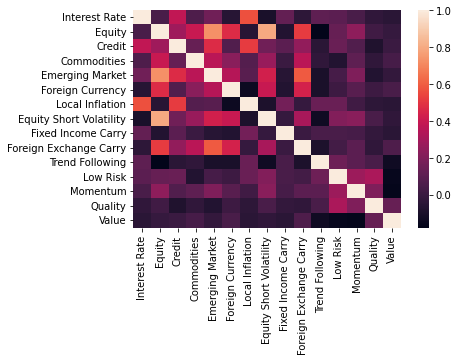

In [33]:
sns.heatmap(corr)

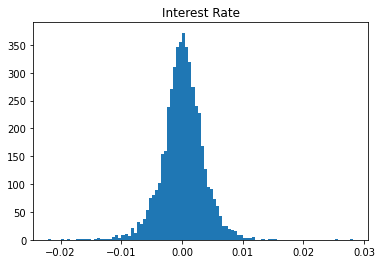

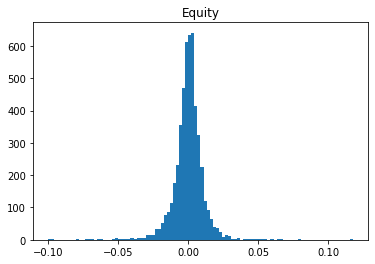

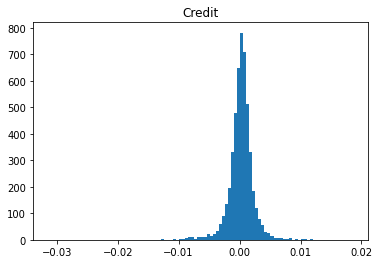

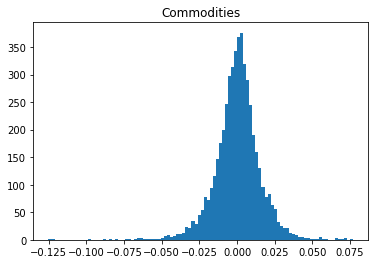

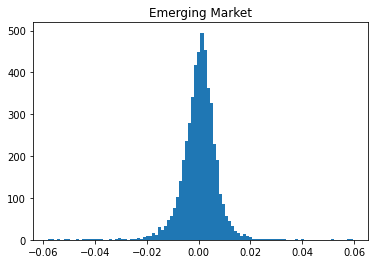

...

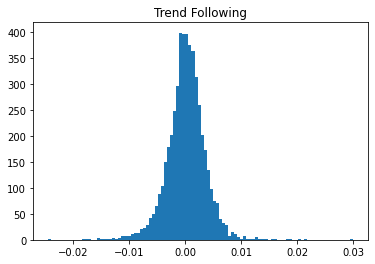

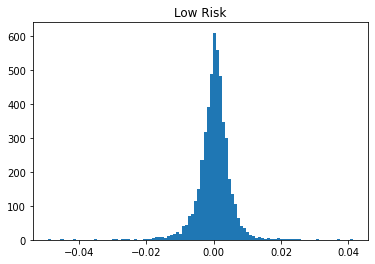

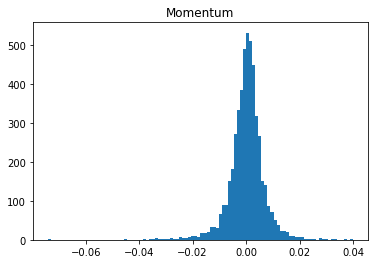

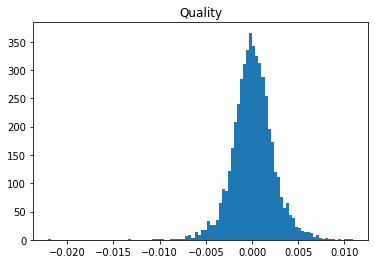

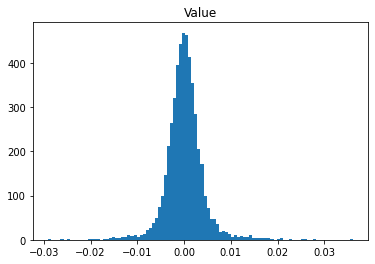

In [34]:
# Check distribution of factors
for col in final_df.columns:
    data = final_df[col]
    plt.figure()
    plt.hist(data, bins = 100)
    plt.title(col)
    plt.show()

# **GMM MODEL**

## **HYPERPARAMETER TUNING**

In [35]:
# function to plot regimes with dates

def plot_regime(data, regime_num, plot_title, distribution = False, save_path = False):
    color_lst = ['dodgerblue','orange','navy','slategray','green','tan','purple','olive','pink','grey']
    new_df = pd.DataFrame(data.iloc[:, -regime_num::].values, index=data.index,
                          columns=['Regime '+str(x) for x in range(1,1+regime_num)])
    temp_array = np.zeros(shape=(len(new_df), regime_num))
    temp_array[np.arange(len(new_df)), np.array(new_df).argmax(1)] = 1
    temp_array = temp_array[:,np.argsort(temp_array.sum(axis=0))[::-1]] # sort sum, make color same
    fig, ax = plt.subplots(figsize=(25,9))
    
    if plot_title:
      title_string = plot_title
    else: title_string = ''

    if distribution:
        ax.stackplot(new_df.index, new_df.T, colors = color_lst[:regime_num],labels=new_df.columns)
        plt.title('Regime Distribution for Each Day: ' + title_string)
    else:
        ax.stackplot(new_df.index, temp_array.T, colors = color_lst[:regime_num],labels=new_df.columns)
        plt.title("Regime Detection Result: "+ title_string)
        ax.axes.get_yaxis().set_visible(False)
    plt.legend()

    if save_path:
        plt.savefig(save_path)
    plt.show()

In [36]:
# function to plot regimes with dates and threshold smoothing

def plot_regime_threshold(data, regime_num, plot_title, distribution = False, with_threshold = False, 
                          save_path = False, start_date = None, end_date = None):
    color_lst = ['dodgerblue','orange','navy','slategray','green','tan','purple','olive','pink','grey']
    new_df = pd.DataFrame(data.iloc[:, -regime_num::].values, index=data.index,
                          columns=['Regime '+str(x) for x in range(1,1+regime_num)])

    temp_array = np.zeros(shape=(len(new_df), regime_num))
    temp_array[np.arange(len(new_df)), np.array(new_df).argmax(1)] = 1
    
    # store the way that temp_array is sorted, use same order to sort thres_array
    temp_array_ord = np.argsort(temp_array.sum(axis=0))[::-1] 
    
    # sort sum, make color same
    temp_array = temp_array[:, temp_array_ord]
    
    # sort new_df to accomodate the color
    cols = np.array(new_df.columns.to_list())
    cols = cols[temp_array_ord]
    new_df_sorted = new_df[cols]
  
    # select index that are larger than threshold
    threshold = 0.9
    new_df_ind = new_df.set_index(np.arange(len(new_df)))
    threshold_array = np.zeros(shape=(len(new_df), regime_num))
    ind = new_df_ind.index[new_df.max(axis = 1) > threshold] 
   
    lst = np.argmax(np.array(new_df), axis = 1)
    for i in range(len(new_df)):
        if i in ind or i == 0:
            threshold_array[i,lst[i]] = 1 
        else:
            threshold_array[i,:] = threshold_array[i - 1, :] 
    threshold_array = threshold_array[:, temp_array_ord]
        
    # plot
    fig, ax = plt.subplots(figsize=(30,4))
    if plot_title: 
        title_string = plot_title
    else: title_string = ''
    
    if start_date and end_date:
      idx = np.where((new_df.index >= start_date) & (new_df.index <= end_date))
      new_df = new_df.iloc[idx]
      new_df_sorted = new_df_sorted.iloc[idx]
      threshold_array = threshold_array[idx]
      temp_array = temp_array[idx]

    if distribution:
        ax.stackplot(new_df.index, new_df_sorted.T, colors = color_lst[:regime_num],labels=new_df.columns)
        plt.title('Regime Distribution for Each Day: ' + title_string)
        
    elif with_threshold:
        print("number of points exceeding threshold ", threshold, " is: ", len(ind))
        print('percentage:',len(ind)/len(new_df))  
        ax.stackplot(new_df.index, threshold_array.T, colors = color_lst[:regime_num],labels=new_df.columns)
        plt.title("Regime Detection Result with Threshold: "+ title_string)
        ax.axes.get_yaxis().set_visible(False)

    else:
        ax.stackplot(new_df.index, temp_array.T, colors = color_lst[:regime_num],labels=new_df.columns)
        plt.title("Regime Detection Result: "+ title_string)
        ax.axes.get_yaxis().set_visible(False)
        
    plt.legend()

    if save_path:
        plt.savefig(save_path)
    
    plt.show()

order [1]
Number of factors: 2
Number of regimes: 1
count_arr [5008]


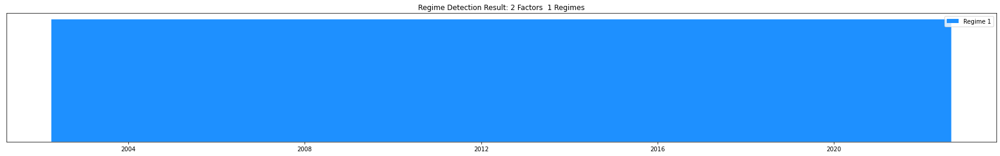


order [2 1]
Number of factors: 2
Number of regimes: 2
count_arr [4378, 630]


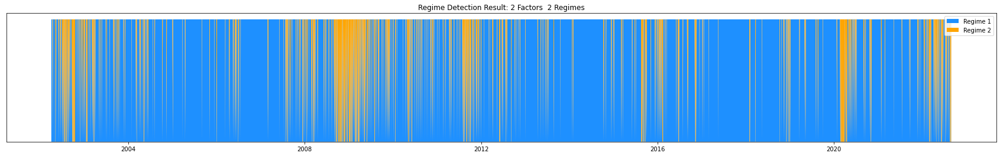


order [1 2 3]
Number of factors: 2
Number of regimes: 3
count_arr [4338, 460, 210]


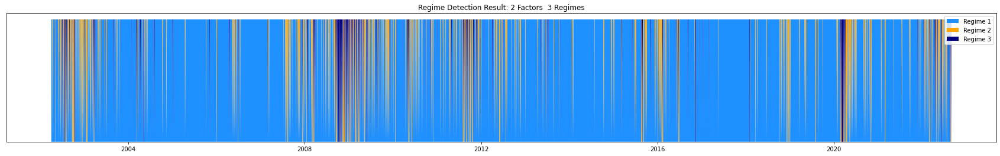


order [2 3 4 1]
Number of factors: 2
Number of regimes: 4
count_arr [3962, 742, 188, 116]


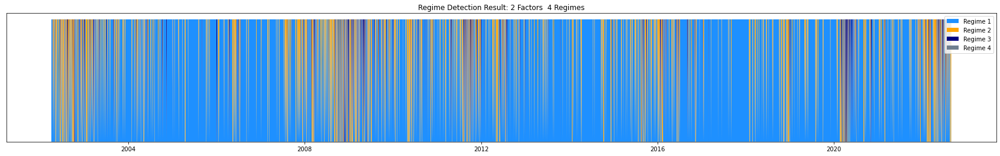


order [1 4 5 2 3]
Number of factors: 2
Number of regimes: 5
count_arr [2920, 1393, 484, 155, 56]


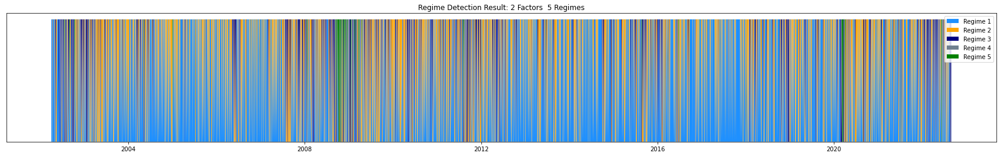


order [2 3 5 1 4 6]
Number of factors: 2
Number of regimes: 6
count_arr [2714, 1411, 417, 380, 47, 39]


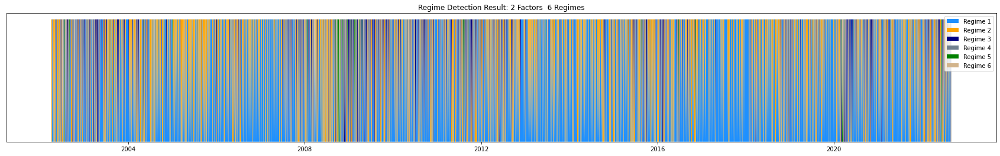


order [3 5 6 2 4 7 1]
Number of factors: 2
Number of regimes: 7
count_arr [2738, 867, 832, 290, 200, 47, 34]


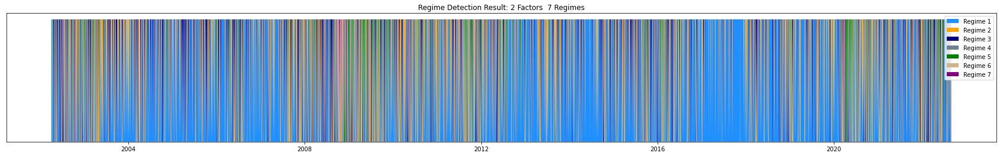


order [3 2 5 4 6 7 1 8]
Number of factors: 2
Number of regimes: 8
count_arr [2335, 899, 886, 373, 255, 180, 50, 30]


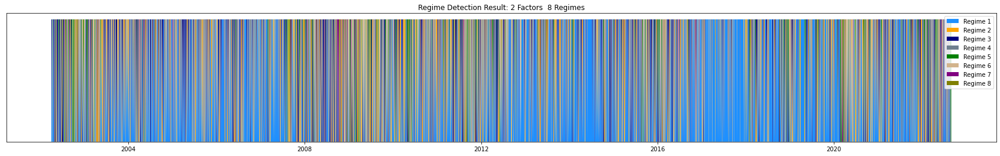


order [4 5 6 3 7 8 2 9 1]
Number of factors: 2
Number of regimes: 9
count_arr [1293, 1283, 1000, 618, 415, 216, 104, 53, 26]


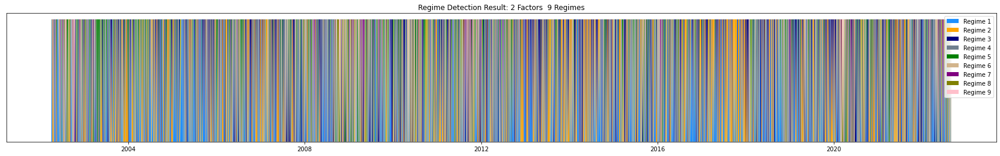


order [ 2  5  7  3  8 10  1 10  6  4]
Number of factors: 2
Number of regimes: 10
count_arr [1956, 1047, 708, 390, 339, 329, 90, 85, 32, 32]


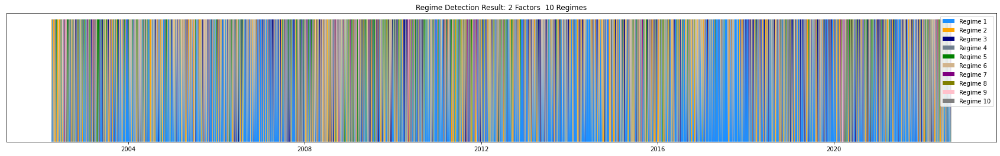


order [1]
Number of factors: 4
Number of regimes: 1
count_arr [5008]


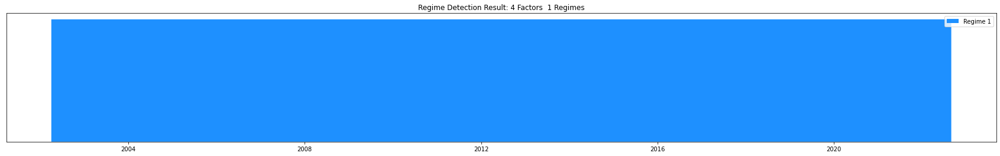


order [2 1]
Number of factors: 4
Number of regimes: 2
count_arr [4518, 490]


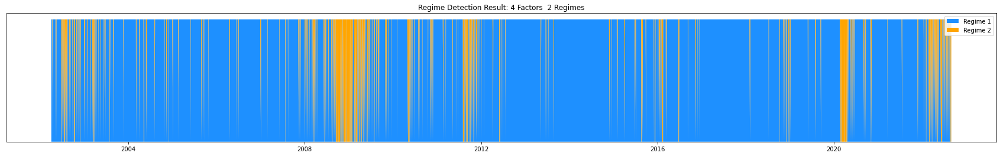


order [3 1 2]
Number of factors: 4
Number of regimes: 3
count_arr [4362, 490, 156]


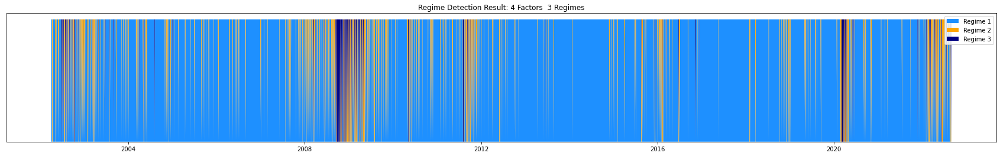


order [2 1 3 4]
Number of factors: 4
Number of regimes: 4
count_arr [3732, 723, 384, 169]


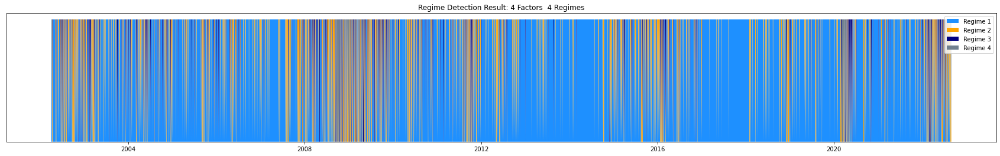


order [3 2 4 5 1]
Number of factors: 4
Number of regimes: 5
count_arr [2879, 1110, 524, 349, 146]


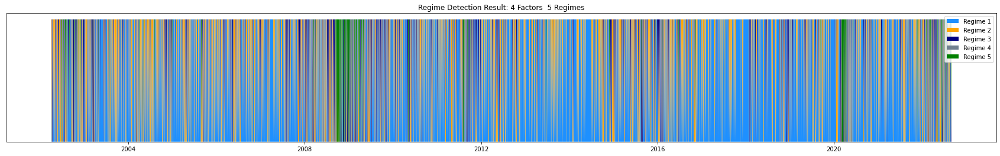


order [2 4 3 6 5 1]
Number of factors: 4
Number of regimes: 6
count_arr [3706, 432, 329, 274, 149, 118]


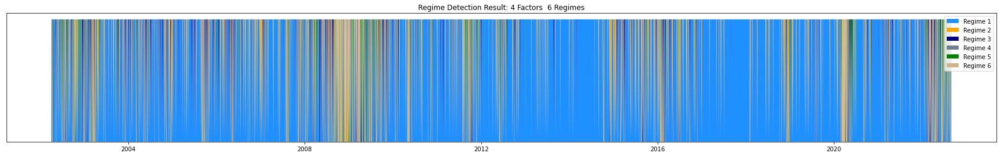


order [3 2 5 7 6 1 4]
Number of factors: 4
Number of regimes: 7
count_arr [2802, 1214, 391, 243, 155, 102, 101]


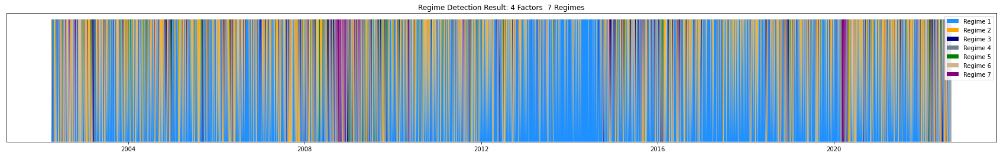


order [3 4 6 1 8 2 7 5]
Number of factors: 4
Number of regimes: 8
count_arr [2688, 944, 699, 232, 161, 109, 89, 86]


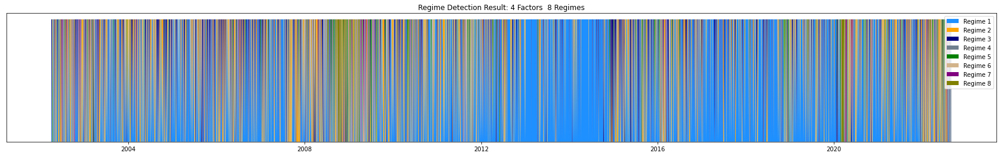


order [3 4 5 1 9 2 8 7 6]
Number of factors: 4
Number of regimes: 9
count_arr [2621, 618, 598, 355, 281, 214, 152, 116, 53]


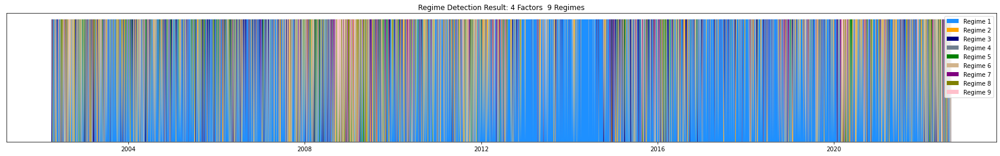


order [ 2  4  6  1  9  3  8  7  5 10]
Number of factors: 4
Number of regimes: 10
count_arr [2544, 678, 475, 418, 263, 234, 134, 108, 104, 50]


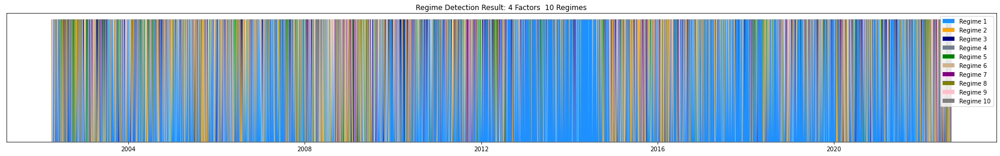


order [1]
Number of factors: 15
Number of regimes: 1
count_arr [5008]


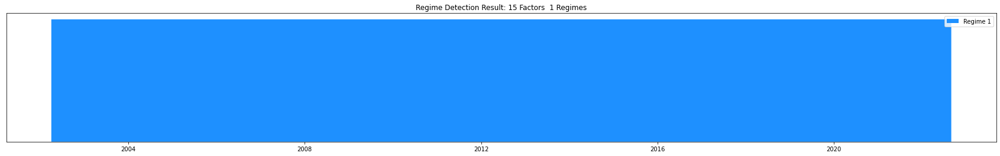


order [2 1]
Number of factors: 15
Number of regimes: 2
count_arr [4229, 779]


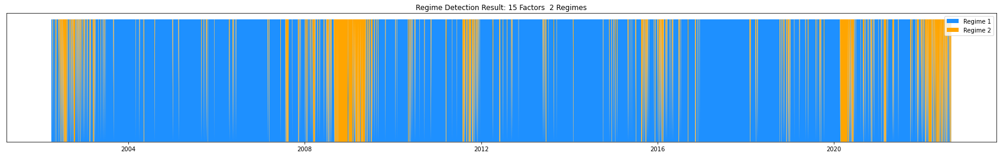


order [1 2 3]
Number of factors: 15
Number of regimes: 3
count_arr [3765, 1063, 180]


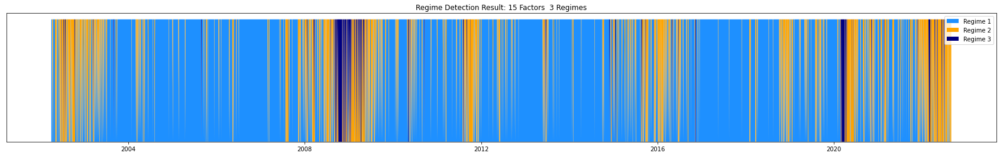


order [2 3 4 1]
Number of factors: 15
Number of regimes: 4
count_arr [3669, 721, 479, 139]


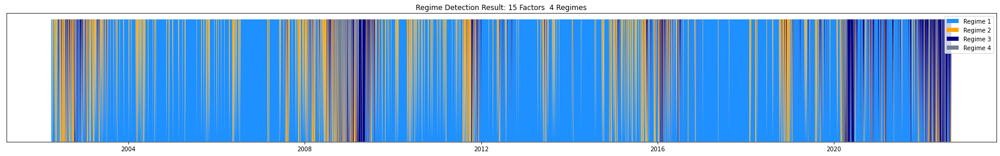

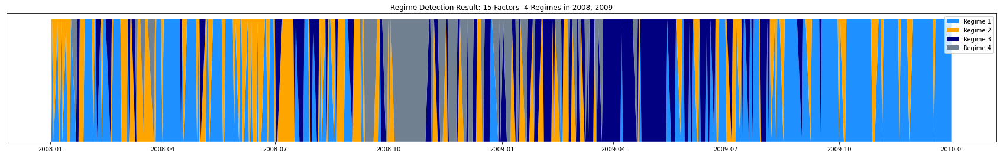

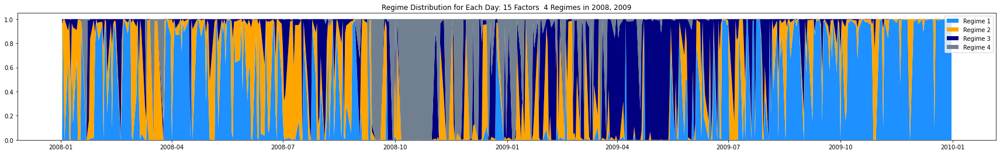

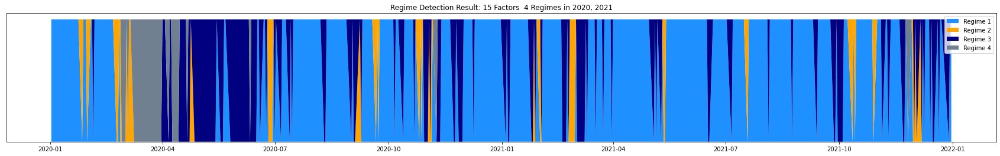

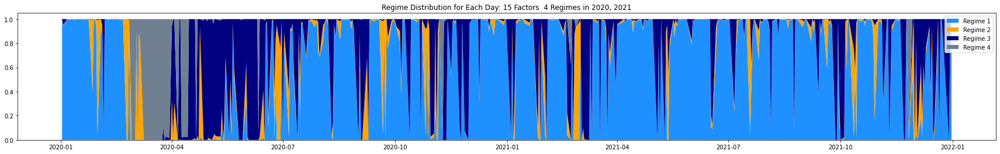


order [2 3 4 1 5]
Number of factors: 15
Number of regimes: 5
count_arr [3688, 648, 338, 209, 125]


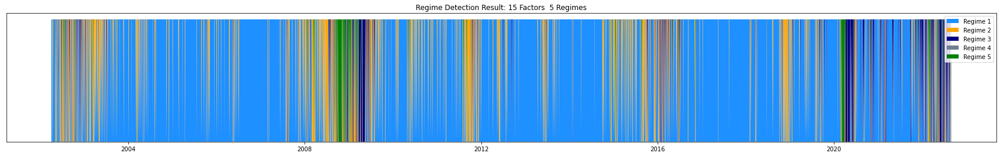


order [3 4 2 1 6 5]
Number of factors: 15
Number of regimes: 6
count_arr [3392, 797, 495, 206, 98, 20]


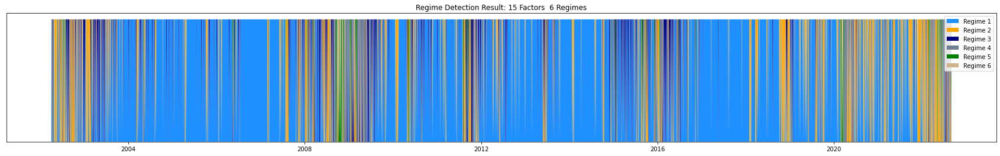


order [4 5 2 1 7 6 3]
Number of factors: 15
Number of regimes: 7
count_arr [3502, 651, 383, 267, 109, 74, 22]


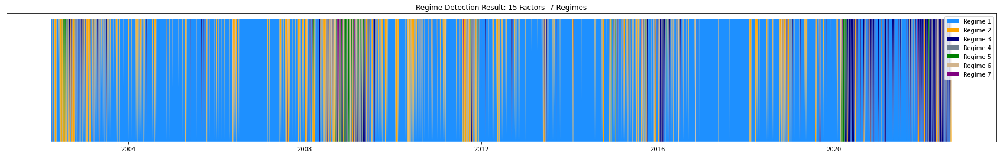


order [6 4 1 2 8 7 5 3]
Number of factors: 15
Number of regimes: 8
count_arr [3334, 605, 353, 312, 166, 107, 85, 46]


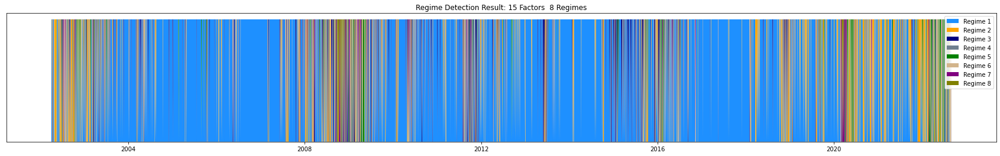


order [8 2 1 3 9 7 4 5 6]
Number of factors: 15
Number of regimes: 9
count_arr [3175, 776, 278, 239, 217, 167, 95, 39, 22]


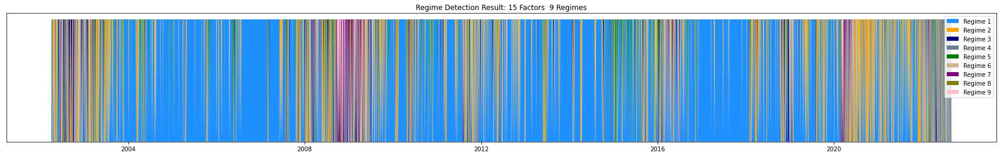


order [ 9  4  2  3 10  7  6  8  5  1]
Number of factors: 15
Number of regimes: 10
count_arr [3288, 446, 342, 221, 217, 212, 111, 100, 50, 21]


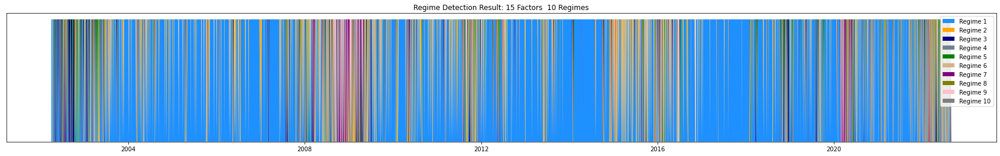

In [37]:
# GMM model: https://scikit-learn.org/stable/modules/generated/sklearn.mixture.GaussianMixture.html

X = final_df[final_df.columns]
models = []
params = []
statistics = []
results = []
bic = []
order_lst = []

n_factors = [2, 4, 15]
n_components = list(np.arange(1, 11))

for f in n_factors:
    for n in n_components:

        # get hidden states
        X_slice = X[X.columns[:f]]
        model = mix.GaussianMixture(n_components = n, random_state = 42)
        model.fit(X_slice)
        ic = model.bic(X_slice)
        hidden_states = model.predict(X_slice)
        
        count_arr = np.bincount(hidden_states)
        ord_lst = len(count_arr) - scipy.stats.rankdata(count_arr).astype(int)+1
        print("order", ord_lst)
        
        # get mean and variance
        mean_df = pd.DataFrame(index = X_slice.columns)
        var_df = pd.DataFrame(index = X_slice.columns)
        sharpe_df = pd.DataFrame(index = X_slice.columns)
        count_df = pd.DataFrame(index = ['count'])
        for i in range(model.n_components):
            state_i_df = X_slice.iloc[hidden_states==i]
            mean_df["Mean Regime "+str(ord_lst[i])] = state_i_df.mean() *252
            var_df["Vol Regime "+str(ord_lst[i])] = state_i_df.std() * np.sqrt(252)
            sharpe_df["SR Regime "+str(ord_lst[i])] = (state_i_df.mean() *252)/(state_i_df.std() * np.sqrt(252))
            count_df.loc['count', "Regime" + str(ord_lst[i])] = count_arr[i]
        mean_df = mean_df.reindex(sorted(mean_df.columns), axis=1)
        var_df = var_df.reindex(sorted(var_df.columns), axis=1)
        sharpe_df = sharpe_df.reindex(sorted(sharpe_df.columns), axis=1)
        count_df = count_df.reindex(sorted(count_df.columns), axis=1)
        
        stats = [mean_df, var_df, sharpe_df, count_df]

        # get transition probabilities
        regimes = pd.DataFrame(hidden_states, index = list(X_slice.index), columns = ['Regime'])
        names = ["Tran. Prob. to state" + str(i) for i in range(model.n_components)]
        prob = pd.DataFrame(model.predict_proba(X_slice), index = list(X_slice.index), columns = names)
        res = pd.concat([X_slice, regimes, prob], axis = 1).dropna()

        # print chart
        print("Number of factors:", f)
        print("Number of regimes:", n)
        print("count_arr",sorted(count_arr)[::-1])
        str_title = str(f) + ' Factors  ' +  str(n) + ' Regimes'
        plot_regime_threshold(res, regime_num = n, plot_title = str_title)
        if f == 15 and n == 4:
          plot_regime_threshold(res, regime_num = n, plot_title = str_title + ' in 2008, 2009', start_date = datetime(2008,1,1), end_date = datetime(2009,12,31))
          plot_regime_threshold(res, regime_num = n, plot_title = str_title + ' in 2008, 2009', distribution = True, start_date = datetime(2008,1,1), end_date = datetime(2009,12,31))
          plot_regime_threshold(res, regime_num = n, plot_title = str_title + ' in 2020, 2021', start_date = datetime(2020,1,1), end_date = datetime(2021,12,31))
          plot_regime_threshold(res, regime_num = n, plot_title = str_title + ' in 2020, 2021', distribution = True, start_date = datetime(2020,1,1), end_date = datetime(2021,12,31))

        print()

        # save results
        models.append(model)
        params.append([f, n])
        statistics.append(stats)
        results.append(res)
        bic.append(ic)
        order_lst.append(ord_lst)
        

## **VISUALISATIONS**

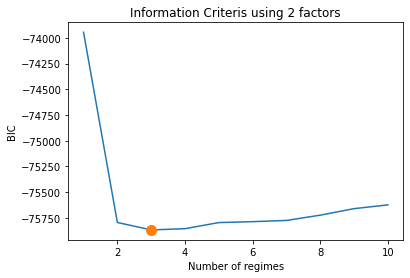

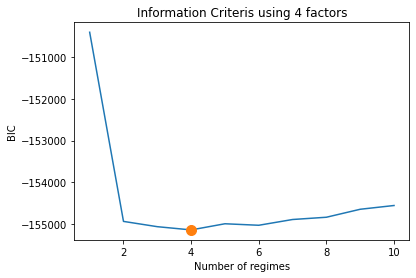

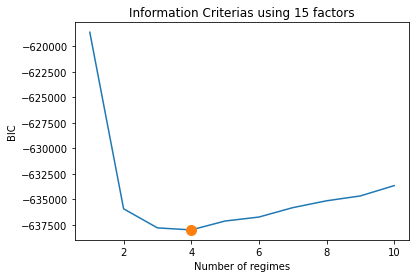

In [38]:
# knee plots for information criterias
plt.figure()
plt.title("Information Criteris using 2 factors")
plt.plot(np.arange(1, 11), bic[:10])
plt.plot(1+np.argmin(bic[:10]), min(bic[:10]), marker = '.', markersize = 20)
plt.xlabel("Number of regimes")
plt.ylabel("BIC")
plt.show()

plt.figure()
plt.title("Information Criteris using 4 factors")
plt.plot(np.arange(1, 11), bic[10:20])
plt.plot(1+np.argmin(bic[10:20]), min(bic[10:20]), marker = '.', markersize = 20)
plt.xlabel("Number of regimes")
plt.ylabel("BIC")
plt.show()

plt.figure()
plt.title("Information Criterias using 15 factors")
plt.plot(np.arange(1, 11), bic[20:30])
plt.plot(1+np.argmin(bic[20:30]), min(bic[20:30]), marker = '.', markersize = 20)
plt.xlabel("Number of regimes")
plt.ylabel("BIC")
plt.show()

In [39]:
# # Empirical distribution of log-returns for each factor associated with each detected regime
# for ind in range(30):
#     print("------------------------------------------------------")
#     print("Number of factors:", params[ind][0])
#     print("Number of regimes:", params[ind][1])
#     print("------------------------------------------------------")
#     for f in factors[:params[ind][0]]:
#         for i in range(models[ind].n_components):
#             mask = results[ind].Regime == i
#             sns.distplot(results[ind][mask][f], hist = True, kde = True)
#         plt.legend(["state " + str(i) for i in order_lst[ind]]) 
#         plt.xlabel(f + " log returns")
#         plt.show()
#         print()

In [40]:
# Print mean and standard deviation for all factors in each regimes for all models
for ind in range(30):
  print("------------------------------------------------------")
  print("Number of factors:", params[ind][0])
  print("Number of regimes:", params[ind][1])
  print("------------------------------------------------------")
  for item in statistics[ind]:
    display(item)
  print()

------------------------------------------------------
Number of factors: 2
Number of regimes: 1
------------------------------------------------------


,Mean Regime 1
Interest Rate,0.035326
Equity,0.047119


,Vol Regime 1
Interest Rate,0.054433
Equity,0.167812


,SR Regime 1
Interest Rate,0.648968
Equity,0.280787


,Regime1
count,5008.0



------------------------------------------------------
Number of factors: 2
Number of regimes: 2
------------------------------------------------------


,Mean Regime 1,Mean Regime 2
Interest Rate,0.038272,0.014852
Equity,0.224172,-1.183256


,Vol Regime 1,Vol Regime 2
Interest Rate,0.044454,0.099159
Equity,0.097414,0.388910


,SR Regime 1,SR Regime 2
Interest Rate,0.860919,0.149776
Equity,2.301221,-3.042495


,Regime1,Regime2
count,4378.0,630.0



------------------------------------------------------
Number of factors: 2
Number of regimes: 3
------------------------------------------------------


,Mean Regime 1,Mean Regime 2,Mean Regime 3
Interest Rate,0.023324,0.345505,-0.396191
Equity,0.244739,-1.056276,-1.618177


,Vol Regime 1,Vol Regime 2,Vol Regime 3
Interest Rate,0.046051,0.053882,0.137867
Equity,0.093658,0.285174,0.537693


,SR Regime 1,SR Regime 2,SR Regime 3
Interest Rate,0.506480,6.412201,-2.873714
Equity,2.613114,-3.703974,-3.009480


,Regime1,Regime2,Regime3
count,4338.0,460.0,210.0



------------------------------------------------------
Number of factors: 2
Number of regimes: 4
------------------------------------------------------


,Mean Regime 1,Mean Regime 2,Mean Regime 3,Mean Regime 4
Interest Rate,0.037865,0.064083,0.269615,-0.615079
Equity,0.510089,-3.141892,5.088271,-3.537154


,Vol Regime 1,Vol Regime 2,Vol Regime 3,Vol Regime 4
Interest Rate,0.043856,0.066262,0.079702,0.148547
Equity,0.082657,0.101211,0.097083,0.635193


,SR Regime 1,SR Regime 2,SR Regime 3,SR Regime 4
Interest Rate,0.863396,0.967106,3.382785,-4.140650
Equity,6.171144,-31.042844,52.411527,-5.568624


,Regime1,Regime2,Regime3,Regime4
count,3962.0,742.0,188.0,116.0



------------------------------------------------------
Number of factors: 2
Number of regimes: 5
------------------------------------------------------


,Mean Regime 1,Mean Regime 2,Mean Regime 3,Mean Regime 4,Mean Regime 5
Interest Rate,-0.047176,0.215152,0.131492,0.021897,-0.930015
Equity,-0.393863,2.122878,-4.132402,5.125720,-6.527093


,Vol Regime 1,Vol Regime 2,Vol Regime 3,Vol Regime 4,Vol Regime 5
Interest Rate,0.043551,0.049232,0.067127,0.125626,0.123286
Equity,0.058896,0.060817,0.088576,0.179649,0.761314


,SR Regime 1,SR Regime 2,SR Regime 3,SR Regime 4,SR Regime 5
Interest Rate,-1.083228,4.370194,1.958846,0.174307,-7.543591
Equity,-6.687475,34.906084,-46.653993,28.531887,-8.573454


,Regime1,Regime2,Regime3,Regime4,Regime5
count,2920.0,1393.0,484.0,155.0,56.0



------------------------------------------------------
Number of factors: 2
Number of regimes: 6
------------------------------------------------------


,Mean Regime 1,Mean Regime 2,Mean Regime 3,Mean Regime 4,Mean Regime 5,Mean Regime 6
Interest Rate,0.098268,-0.153618,0.243937,0.184724,-0.890234,-0.079731
Equity,0.860932,-1.337739,4.041761,-4.524205,-11.659047,9.454194


,Vol Regime 1,Vol Regime 2,Vol Regime 3,Vol Regime 4,Vol Regime 5,Vol Regime 6
Interest Rate,0.041374,0.054453,0.069774,0.063314,0.128238,0.177682
Equity,0.053618,0.046974,0.081986,0.081288,0.312526,0.371917


,SR Regime 1,SR Regime 2,SR Regime 3,SR Regime 4,SR Regime 5,SR Regime 6
Interest Rate,2.375138,-2.821094,3.496105,2.917568,-6.942039,-0.448728
Equity,16.056731,-28.478314,49.298209,-55.656263,-37.305818,25.420200


,Regime1,Regime2,Regime3,Regime4,Regime5,Regime6
count,2714.0,1411.0,417.0,380.0,47.0,39.0



------------------------------------------------------
Number of factors: 2
Number of regimes: 7
------------------------------------------------------


,Mean Regime 1,Mean Regime 2,Mean Regime 3,Mean Regime 4,Mean Regime 5,Mean Regime 6,Mean Regime 7
Interest Rate,0.022282,0.189079,-0.116508,0.181440,0.214352,-1.057396,0.091620
Equity,0.183404,2.312353,-2.002337,-4.972931,5.143283,-11.343236,10.046256


,Vol Regime 1,Vol Regime 2,Vol Regime 3,Vol Regime 4,Vol Regime 5,Vol Regime 6,Vol Regime 7
Interest Rate,0.039641,0.058633,0.064176,0.059974,0.062769,0.129511,0.183200
Equity,0.047044,0.042060,0.045447,0.078019,0.068985,0.339578,0.375859


,SR Regime 1,SR Regime 2,SR Regime 3,SR Regime 4,SR Regime 5,SR Regime 6,SR Regime 7
Interest Rate,0.562094,3.224766,-1.815438,3.025313,3.414940,-8.16450,0.500107
Equity,3.898571,54.977972,-44.059171,-63.740138,74.556908,-33.40394,26.728761


,Regime1,Regime2,Regime3,Regime4,Regime5,Regime6,Regime7
count,2738.0,867.0,832.0,290.0,200.0,47.0,34.0



------------------------------------------------------
Number of factors: 2
Number of regimes: 8
------------------------------------------------------


,Mean Regime 1,Mean Regime 2,Mean Regime 3,Mean Regime 4,Mean Regime 5,Mean Regime 6,Mean Regime 7,Mean Regime 8
Interest Rate,0.164995,0.186014,-0.004698,-1.088100,0.154112,0.216607,-1.224271,0.578979
Equity,0.271388,2.333257,-2.080592,-0.240637,-5.162510,5.295291,-10.396642,10.698971


,Vol Regime 1,Vol Regime 2,Vol Regime 3,Vol Regime 4,Vol Regime 5,Vol Regime 6,Vol Regime 7,Vol Regime 8
Interest Rate,0.032222,0.058336,0.059357,0.028794,0.060680,0.065792,0.132710,0.172082
Equity,0.045243,0.045450,0.045135,0.038428,0.075712,0.068040,0.406359,0.380778


,SR Regime 1,SR Regime 2,SR Regime 3,SR Regime 4,SR Regime 5,SR Regime 6,SR Regime 7,SR Regime 8
Interest Rate,5.120585,3.188700,-0.079152,-37.789330,2.539767,3.292316,-9.225191,3.364549
Equity,5.998472,51.336945,-46.097417,-6.262001,-68.186467,77.826691,-25.584889,28.097691


,Regime1,Regime2,Regime3,Regime4,Regime5,Regime6,Regime7,Regime8
count,2335.0,899.0,886.0,373.0,255.0,180.0,50.0,30.0



------------------------------------------------------
Number of factors: 2
Number of regimes: 9
------------------------------------------------------


,Mean Regime 1,Mean Regime 2,Mean Regime 3,Mean Regime 4,Mean Regime 5,Mean Regime 6,Mean Regime 7,Mean Regime 8,Mean Regime 9
Interest Rate,-0.286032,0.399584,-0.163902,0.042955,0.452768,0.170397,0.013101,-1.323893,0.597663
Equity,-0.706053,0.399370,1.615399,-2.543909,3.244828,-5.392880,6.102793,-9.797437,11.387618


,Vol Regime 1,Vol Regime 2,Vol Regime 3,Vol Regime 4,Vol Regime 5,Vol Regime 6,Vol Regime 7,Vol Regime 8,Vol Regime 9
Interest Rate,0.046072,0.032935,0.038911,0.062186,0.066660,0.060931,0.060990,0.131418,0.178655
Equity,0.034866,0.027733,0.032978,0.042476,0.051191,0.073365,0.065084,0.424265,0.371454


,SR Regime 1,SR Regime 2,SR Regime 3,SR Regime 4,SR Regime 5,SR Regime 6,SR Regime 7,SR Regime 8,SR Regime 9
Interest Rate,-6.208388,12.132397,-4.212185,0.690744,6.792221,2.796535,0.214809,-10.073907,3.345350
Equity,-20.250286,14.400359,48.984783,-59.891057,63.386911,-73.507251,93.768452,-23.092750,30.656877


,Regime1,Regime2,Regime3,Regime4,Regime5,Regime6,Regime7,Regime8,Regime9
count,1293.0,1283.0,1000.0,618.0,415.0,216.0,104.0,53.0,26.0



------------------------------------------------------
Number of factors: 2
Number of regimes: 10
------------------------------------------------------


,Mean Regime 1,Mean Regime 10,Mean Regime 2,Mean Regime 3,Mean Regime 4,Mean Regime 5,Mean Regime 6,Mean Regime 7,Mean Regime 8
Interest Rate,0.213981,-0.119734,0.118002,-0.147253,-0.009993,0.580677,-1.272912,0.015398,-0.070559
Equity,0.429426,10.211445,-1.459798,2.023645,-3.675738,3.481672,-0.185858,-6.918320,6.268817


,Vol Regime 1,Vol Regime 10,Vol Regime 2,Vol Regime 3,Vol Regime 4,Vol Regime 5,Vol Regime 6,Vol Regime 7,Vol Regime 8
Interest Rate,0.036084,0.188621,0.040165,0.038612,0.075039,0.066843,0.038519,0.055989,0.057505
Equity,0.035683,0.374945,0.037701,0.029527,0.055441,0.056445,0.040340,0.076982,0.060936


,SR Regime 1,SR Regime 10,SR Regime 2,SR Regime 3,SR Regime 4,SR Regime 5,SR Regime 6,SR Regime 7,SR Regime 8
Interest Rate,5.930058,-0.634786,2.937932,-3.813664,-0.133173,8.687229,-33.046359,0.275014,-1.227018
Equity,12.034461,27.234529,-38.719993,68.534916,-66.299670,61.682555,-4.607337,-89.869743,102.875108


,Regime1,Regime10,Regime2,Regime3,Regime4,Regime5,Regime6,Regime7,Regime8
count,1956.0,32.0,1047.0,708.0,390.0,339.0,329.0,90.0,85.0



------------------------------------------------------
Number of factors: 4
Number of regimes: 1
------------------------------------------------------


,Mean Regime 1
Interest Rate,0.035326
Equity,0.047119
Credit,0.055347
Commodities,0.058051


,Vol Regime 1
Interest Rate,0.054433
Equity,0.167812
Credit,0.035599
Commodities,0.241813


,SR Regime 1
Interest Rate,0.648968
Equity,0.280787
Credit,1.554718
Commodities,0.240066


,Regime1
count,5008.0



------------------------------------------------------
Number of factors: 4
Number of regimes: 2
------------------------------------------------------


,Mean Regime 1,Mean Regime 2
Interest Rate,0.040252,-0.010095
Equity,0.161031,-1.003186
Credit,0.081691,-0.187558
Commodities,0.195100,-1.205599


,Vol Regime 1,Vol Regime 2
Interest Rate,0.047290,0.098347
Equity,0.111436,0.410824
Credit,0.022573,0.089494
Commodities,0.189898,0.508509


,SR Regime 1,SR Regime 2
Interest Rate,0.851167,-0.102648
Equity,1.445043,-2.441890
Credit,3.618901,-2.095753
Commodities,1.027396,-2.370852


,Regime1,Regime2
count,4518.0,490.0



------------------------------------------------------
Number of factors: 4
Number of regimes: 3
------------------------------------------------------


,Mean Regime 1,Mean Regime 2,Mean Regime 3
Interest Rate,0.028297,0.208343,-0.311591
Equity,0.217899,-1.230045,-0.716518
Credit,0.080692,0.076166,-0.718753
Commodities,0.159228,-0.093445,-2.295160


,Vol Regime 1,Vol Regime 2,Vol Regime 3
Interest Rate,0.047159,0.066413,0.135513
Equity,0.103574,0.284857,0.570804
Credit,0.022451,0.045380,0.133374
Commodities,0.179494,0.439483,0.591199


,SR Regime 1,SR Regime 2,SR Regime 3
Interest Rate,0.600022,3.137074,-2.299336
Equity,2.103791,-4.318107,-1.255277
Credit,3.594104,1.678420,-5.389004
Commodities,0.887094,-0.212624,-3.882210


,Regime1,Regime2,Regime3
count,4362.0,490.0,156.0



------------------------------------------------------
Number of factors: 4
Number of regimes: 4
------------------------------------------------------


,Mean Regime 1,Mean Regime 2,Mean Regime 3,Mean Regime 4
Interest Rate,0.032229,-0.014110,0.238340,-0.146095
Equity,0.316221,-2.168344,2.184523,-1.273991
Credit,0.085575,-0.017177,0.167114,-0.555880
Commodities,0.403553,-4.305638,5.736603,-1.806043


,Vol Regime 1,Vol Regime 2,Vol Regime 3,Vol Regime 4
Interest Rate,0.044525,0.063775,0.064251,0.129775
Equity,0.086262,0.177256,0.199812,0.556219
Credit,0.021169,0.034801,0.039149,0.131697
Commodities,0.142863,0.194524,0.174841,0.644259


,SR Regime 1,SR Regime 2,SR Regime 3,SR Regime 4
Interest Rate,0.723841,-0.221240,3.709506,-1.125761
Equity,3.665795,-12.232813,10.932914,-2.290449
Credit,4.042556,-0.493565,4.268636,-4.220889
Commodities,2.824756,-22.134211,32.810471,-2.803285


,Regime1,Regime2,Regime3,Regime4
count,3732.0,723.0,384.0,169.0



------------------------------------------------------
Number of factors: 4
Number of regimes: 5
------------------------------------------------------


,Mean Regime 1,Mean Regime 2,Mean Regime 3,Mean Regime 4,Mean Regime 5
Interest Rate,0.085895,-0.139013,0.062479,0.278253,-0.314576
Equity,0.749510,-1.015289,-2.566208,2.245593,-1.602142
Credit,0.106494,0.012499,-0.020764,0.191341,-0.679393
Commodities,1.199652,-1.838626,-5.177714,5.636020,-2.575705


,Vol Regime 1,Vol Regime 2,Vol Regime 3,Vol Regime 4,Vol Regime 5
Interest Rate,0.039243,0.061583,0.054751,0.070443,0.133540
Equity,0.077643,0.083475,0.185086,0.214766,0.580593
Credit,0.019953,0.025747,0.034467,0.047366,0.135797
Commodities,0.129093,0.121115,0.183287,0.207984,0.649017


,SR Regime 1,SR Regime 2,SR Regime 3,SR Regime 4,SR Regime 5
Interest Rate,2.188800,-2.257331,1.141157,3.950073,-2.355663
Equity,9.653258,-12.162778,-13.864934,10.455988,-2.759493
Credit,5.337231,0.485451,-0.602435,4.039657,-5.002997
Commodities,9.292944,-15.180876,-28.249166,27.098288,-3.968625


,Regime1,Regime2,Regime3,Regime4,Regime5
count,2879.0,1110.0,524.0,349.0,146.0



------------------------------------------------------
Number of factors: 4
Number of regimes: 6
------------------------------------------------------


,Mean Regime 1,Mean Regime 2,Mean Regime 3,Mean Regime 4,Mean Regime 5,Mean Regime 6
Interest Rate,0.031535,0.025872,0.303737,-0.271455,0.238080,-0.103046
Equity,0.281891,-0.494587,0.341695,-4.233669,4.556817,-1.918720
Credit,0.085348,0.093548,0.114986,-0.337152,0.325674,-0.622988
Commodities,0.318149,-6.069326,6.530699,-1.829294,2.827928,-2.840065


,Vol Regime 1,Vol Regime 2,Vol Regime 3,Vol Regime 4,Vol Regime 5,Vol Regime 6
Interest Rate,0.044218,0.056487,0.056573,0.084323,0.075934,0.135309
Equity,0.088863,0.166463,0.174535,0.116437,0.126939,0.644090
Credit,0.021058,0.028354,0.027789,0.046863,0.074276,0.138369
Commodities,0.138171,0.136047,0.139215,0.150989,0.148668,0.750030


,SR Regime 1,SR Regime 2,SR Regime 3,SR Regime 4,SR Regime 5,SR Regime 6
Interest Rate,0.713170,0.458007,5.368976,-3.219237,3.135352,-0.761559
Equity,3.172196,-2.971151,1.957745,-36.360078,35.897572,-2.978963
Credit,4.053066,3.299235,4.137886,-7.194345,4.384660,-4.502365
Commodities,2.302574,-44.612133,46.910854,-12.115425,19.021787,-3.786602


,Regime1,Regime2,Regime3,Regime4,Regime5,Regime6
count,3706.0,432.0,329.0,274.0,149.0,118.0



------------------------------------------------------
Number of factors: 4
Number of regimes: 7
------------------------------------------------------


,Mean Regime 1,Mean Regime 2,Mean Regime 3,Mean Regime 4,Mean Regime 5,Mean Regime 6,Mean Regime 7
Interest Rate,0.004353,0.136648,0.003833,-0.295915,0.202638,0.454833,-0.084878
Equity,0.106294,0.703312,-0.950259,-4.267095,2.470918,3.760960,-2.711249
Credit,0.083905,0.095154,0.071101,-0.376053,0.218309,0.331003,-0.766962
Commodities,-0.699217,3.400299,-6.415184,-1.500271,8.442473,1.993785,-5.119658


,Vol Regime 1,Vol Regime 2,Vol Regime 3,Vol Regime 4,Vol Regime 5,Vol Regime 6,Vol Regime 7
Interest Rate,0.045620,0.044061,0.054148,0.084655,0.069277,0.088072,0.141045
Equity,0.080004,0.123774,0.176696,0.114189,0.230171,0.120212,0.675944
Credit,0.020998,0.022088,0.028964,0.047839,0.036443,0.090997,0.144292
Commodities,0.105388,0.100626,0.128212,0.144729,0.192900,0.153878,0.683622


,SR Regime 1,SR Regime 2,SR Regime 3,SR Regime 4,SR Regime 5,SR Regime 6,SR Regime 7
Interest Rate,0.095428,3.101375,0.070791,-3.495548,2.925045,5.164339,-0.601780
Equity,1.328597,5.682226,-5.377928,-37.368834,10.735159,31.286010,-4.011059
Credit,3.995807,4.307919,2.454815,-7.860778,5.990384,3.637536,-5.315348
Commodities,-6.634708,33.791514,-50.035752,-10.366044,43.766124,12.956935,-7.489021


,Regime1,Regime2,Regime3,Regime4,Regime5,Regime6,Regime7
count,2802.0,1214.0,391.0,243.0,155.0,102.0,101.0



------------------------------------------------------
Number of factors: 4
Number of regimes: 8
------------------------------------------------------


,Mean Regime 1,Mean Regime 2,Mean Regime 3,Mean Regime 4,Mean Regime 5,Mean Regime 6,Mean Regime 7,Mean Regime 8
Interest Rate,0.016913,0.176149,-0.021174,-0.259292,0.070578,0.161797,0.331822,-0.214076
Equity,0.257761,0.887502,-0.231833,-3.924809,-3.601589,2.317522,4.171264,-3.093926
Credit,0.085030,0.107896,0.082394,-0.307722,-0.051813,0.173861,0.449617,-1.047248
Commodities,0.095578,4.051190,-4.225646,-1.119617,-7.880544,9.232666,1.568434,-5.281677


,Vol Regime 1,Vol Regime 2,Vol Regime 3,Vol Regime 4,Vol Regime 5,Vol Regime 6,Vol Regime 7,Vol Regime 8
Interest Rate,0.043396,0.048492,0.054504,0.087010,0.049927,0.077672,0.083050,0.147597
Equity,0.078479,0.140939,0.114488,0.099439,0.189019,0.242123,0.137047,0.708098
Credit,0.020810,0.023680,0.024277,0.048454,0.036551,0.045106,0.107610,0.138072
Commodities,0.087675,0.103371,0.087186,0.117692,0.160759,0.196969,0.171119,0.715433


,SR Regime 1,SR Regime 2,SR Regime 3,SR Regime 4,SR Regime 5,SR Regime 6,SR Regime 7,SR Regime 8
Interest Rate,0.389735,3.632540,-0.388487,-2.980027,1.413612,2.083093,3.995461,-1.450409
Equity,3.284464,6.297056,-2.024960,-39.469417,-19.054116,9.571686,30.436655,-4.369347
Credit,4.086003,4.556440,3.393876,-6.350802,-1.417579,3.854542,4.178219,-7.584810
Commodities,1.090144,39.190622,-48.466926,-9.513127,-49.020847,46.873614,9.165770,-7.382492


,Regime1,Regime2,Regime3,Regime4,Regime5,Regime6,Regime7,Regime8
count,2688.0,944.0,699.0,232.0,161.0,109.0,89.0,86.0



------------------------------------------------------
Number of factors: 4
Number of regimes: 9
------------------------------------------------------


,Mean Regime 1,Mean Regime 2,Mean Regime 3,Mean Regime 4,Mean Regime 5,Mean Regime 6,Mean Regime 7,Mean Regime 8,Mean Regime 9
Interest Rate,0.013550,0.198951,-0.031027,0.114286,0.201512,-0.318275,0.109767,-0.118072,0.092922
Equity,0.150493,2.224486,-0.287224,-1.581184,2.255788,-4.009110,-3.763241,4.303885,-9.495927
Credit,0.084748,0.178922,0.077145,0.004710,0.146586,-0.357564,-0.028902,0.030750,-1.267386
Commodities,-0.094971,2.903717,-4.505738,3.068378,6.840118,-1.290144,-7.956255,4.689148,-11.891994


,Vol Regime 1,Vol Regime 2,Vol Regime 3,Vol Regime 4,Vol Regime 5,Vol Regime 6,Vol Regime 7,Vol Regime 8,Vol Regime 9
Interest Rate,0.042387,0.050936,0.055957,0.053831,0.056847,0.086787,0.048089,0.113992,0.141296
Equity,0.070732,0.083598,0.119346,0.074870,0.179875,0.100809,0.173039,0.362042,0.457282
Credit,0.020640,0.024960,0.025037,0.025878,0.031395,0.047555,0.035405,0.112776,0.154810
Commodities,0.092541,0.111369,0.087064,0.076081,0.118413,0.109864,0.166541,0.434534,0.437152


,SR Regime 1,SR Regime 2,SR Regime 3,SR Regime 4,SR Regime 5,SR Regime 6,SR Regime 7,SR Regime 8,SR Regime 9
Interest Rate,0.319670,3.905867,-0.554481,2.123062,3.544794,-3.667325,2.282561,-1.035792,0.657644
Equity,2.127636,26.609415,-2.406648,-21.119136,12.540864,-39.769308,-21.747935,11.887809,-20.766005
Credit,4.106078,7.168351,3.081174,0.181991,4.669115,-7.519009,-0.816306,0.272661,-8.186728
Commodities,-1.026261,26.073010,-51.751862,40.330612,57.765124,-11.743110,-47.773628,10.791206,-27.203360


,Regime1,Regime2,Regime3,Regime4,Regime5,Regime6,Regime7,Regime8,Regime9
count,2621.0,618.0,598.0,355.0,281.0,214.0,152.0,116.0,53.0



------------------------------------------------------
Number of factors: 4
Number of regimes: 10
------------------------------------------------------


,Mean Regime 1,Mean Regime 10,Mean Regime 2,Mean Regime 3,Mean Regime 4,Mean Regime 5,Mean Regime 6,Mean Regime 7,Mean Regime 8,Mean Regime 9
Interest Rate,0.032578,-0.012699,0.019324,0.254464,0.034135,-0.269106,0.172905,-0.052365,-0.163986,0.014122
Equity,0.291333,-10.213737,-0.153259,2.575222,-1.159800,-3.029274,2.383674,-5.333941,4.603659,-1.659067
Credit,0.090808,-1.500396,0.090322,0.201462,-0.008072,-0.073989,0.143508,-0.492350,0.164392,0.016533
Commodities,0.165931,-12.219381,-4.238647,3.169019,3.368515,-1.108097,7.162722,-3.758267,4.879567,-9.307636


,Vol Regime 1,Vol Regime 10,Vol Regime 2,Vol Regime 3,Vol Regime 4,Vol Regime 5,Vol Regime 6,Vol Regime 7,Vol Regime 8,Vol Regime 9
Interest Rate,0.040662,0.140715,0.052322,0.054997,0.054518,0.081829,0.056318,0.061569,0.122419,0.054507
Equity,0.068910,0.411973,0.106879,0.086151,0.084643,0.082489,0.187626,0.110567,0.363096,0.200631
Credit,0.020338,0.141653,0.024169,0.026272,0.025887,0.035834,0.033601,0.053319,0.118841,0.028956
Commodities,0.089613,0.435793,0.084291,0.123576,0.070351,0.076776,0.118705,0.172315,0.432478,0.133371


,SR Regime 1,SR Regime 10,SR Regime 2,SR Regime 3,SR Regime 4,SR Regime 5,SR Regime 6,SR Regime 7,SR Regime 8,SR Regime 9
Interest Rate,0.801195,-0.090247,0.369319,4.626861,0.626122,-3.288651,3.070151,-0.850508,-1.339551,0.259093
Equity,4.227722,-24.792225,-1.433945,29.892123,-13.702271,-36.723592,12.704416,-48.241830,12.678898,-8.269242
Credit,4.464865,-10.592046,3.737049,7.668191,-0.311810,-2.064786,4.270903,-9.234087,1.383299,0.570961
Commodities,1.851648,-28.039444,-50.285831,25.644263,47.881848,-14.432920,60.340382,-21.810433,11.282822,-69.787367


,Regime1,Regime10,Regime2,Regime3,Regime4,Regime5,Regime6,Regime7,Regime8,Regime9
count,2544.0,50.0,678.0,475.0,418.0,263.0,234.0,134.0,108.0,104.0



------------------------------------------------------
Number of factors: 15
Number of regimes: 1
------------------------------------------------------


,Mean Regime 1
Interest Rate,0.035326
Equity,0.047119
Credit,0.055347
Commodities,0.058051
Emerging Market,0.059173
Foreign Currency,-0.004914
Local Inflation,0.042416
Equity Short Volatility,0.063850
Fixed Income Carry,0.024114
Foreign Exchange Carry,0.041224


,Vol Regime 1
Interest Rate,0.054433
Equity,0.167812
Credit,0.035599
Commodities,0.241813
Emerging Market,0.112114
Foreign Currency,0.028565
Local Inflation,0.046984
Equity Short Volatility,0.138527
Fixed Income Carry,0.050629
Foreign Exchange Carry,0.099127


,SR Regime 1
Interest Rate,0.648968
Equity,0.280787
Credit,1.554718
Commodities,0.240066
Emerging Market,0.527791
Foreign Currency,-0.172022
Local Inflation,0.902776
Equity Short Volatility,0.460925
Fixed Income Carry,0.476294
Foreign Exchange Carry,0.415870


,Regime1
count,5008.0



------------------------------------------------------
Number of factors: 15
Number of regimes: 2
------------------------------------------------------


,Mean Regime 1,Mean Regime 2
Interest Rate,0.043042,-0.006565
Equity,0.167740,-0.607699
Credit,0.087873,-0.121230
Commodities,0.164557,-0.520142
Emerging Market,0.156683,-0.470189
Foreign Currency,0.009482,-0.083065
Local Inflation,0.056672,-0.034975
Equity Short Volatility,0.161578,-0.466687
Fixed Income Carry,0.043601,-0.081676
Foreign Exchange Carry,0.098612,-0.270324


,Vol Regime 1,Vol Regime 2
Interest Rate,0.047629,0.082051
Equity,0.106663,0.342624
Credit,0.022233,0.072959
Commodities,0.193562,0.413688
Emerging Market,0.078805,0.214072
Foreign Currency,0.021335,0.052429
Local Inflation,0.038862,0.077272
Equity Short Volatility,0.069697,0.309478
Fixed Income Carry,0.045092,0.073445
Foreign Exchange Carry,0.071198,0.187707


,SR Regime 1,SR Regime 2
Interest Rate,0.903683,-0.080015
Equity,1.572616,-1.773662
Credit,3.952303,-1.661630
Commodities,0.850150,-1.257328
Emerging Market,1.988255,-2.196405
Foreign Currency,0.444430,-1.584330
Local Inflation,1.458269,-0.452624
Equity Short Volatility,2.318301,-1.507980
Fixed Income Carry,0.966938,-1.112081
Foreign Exchange Carry,1.385050,-1.440141


,Regime1,Regime2
count,4229.0,779.0



------------------------------------------------------
Number of factors: 15
Number of regimes: 3
------------------------------------------------------


,Mean Regime 1,Mean Regime 2,Mean Regime 3
Interest Rate,0.040134,0.039454,-0.089627
Equity,0.243427,-0.459222,-1.068743
Credit,0.089335,0.029076,-0.500430
Commodities,0.162562,0.051919,-2.091752
Emerging Market,0.190657,-0.174561,-1.310715
Foreign Currency,0.012212,-0.029051,-0.220596
Local Inflation,0.052306,0.043709,-0.172099
Equity Short Volatility,0.205532,-0.298719,-0.758481
Fixed Income Carry,0.044275,0.005620,-0.288364
Foreign Exchange Carry,0.121929,-0.085480,-0.898596


,Vol Regime 1,Vol Regime 2,Vol Regime 3
Interest Rate,0.046515,0.063538,0.115619
Equity,0.092424,0.225801,0.539787
Credit,0.020792,0.042837,0.118854
Commodities,0.182332,0.304228,0.606687
Emerging Market,0.072217,0.138464,0.343459
Foreign Currency,0.020509,0.030798,0.090155
Local Inflation,0.037815,0.054232,0.118476
Equity Short Volatility,0.055534,0.188167,0.504367
Fixed Income Carry,0.044779,0.055333,0.104593
Foreign Exchange Carry,0.065501,0.120248,0.307254


,SR Regime 1,SR Regime 2,SR Regime 3
Interest Rate,0.862813,0.620953,-0.775197
Equity,2.633810,-2.033745,-1.979936
Credit,4.296604,0.678764,-4.210445
Commodities,0.891569,0.170660,-3.447829
Emerging Market,2.640074,-1.260702,-3.816221
Foreign Currency,0.595478,-0.943268,-2.446845
Local Inflation,1.383211,0.805962,-1.452602
Equity Short Volatility,3.701030,-1.587525,-1.503828
Fixed Income Carry,0.988745,0.101572,-2.757017
Foreign Exchange Carry,1.861485,-0.710863,-2.924602


,Regime1,Regime2,Regime3
count,3765.0,1063.0,180.0



------------------------------------------------------
Number of factors: 15
Number of regimes: 4
------------------------------------------------------


,Mean Regime 1,Mean Regime 2,Mean Regime 3,Mean Regime 4
Interest Rate,0.046288,0.085841,-0.085881,-0.098387
Equity,0.271150,-1.156340,0.507769,-1.211330
Credit,0.096522,-0.084446,0.166064,-0.687937
Commodities,0.203009,-0.925712,1.217975,-2.662523
Emerging Market,0.216717,-0.704675,0.523491,-1.737261
Foreign Currency,0.014837,-0.093855,0.051257,-0.258482
Local Inflation,0.057169,0.041411,0.002999,-0.205956
Equity Short Volatility,0.215314,-0.732127,0.317716,-0.680179
Fixed Income Carry,0.045921,0.035007,-0.089856,-0.215228
Foreign Exchange Carry,0.143749,-0.477807,0.383390,-1.151878


,Vol Regime 1,Vol Regime 2,Vol Regime 3,Vol Regime 4
Interest Rate,0.045066,0.069725,0.060786,0.122554
Equity,0.089121,0.220684,0.218461,0.588780
Credit,0.020432,0.033462,0.053716,0.126838
Commodities,0.178728,0.300760,0.320300,0.612215
Emerging Market,0.069688,0.139966,0.133195,0.364316
Foreign Currency,0.020070,0.032556,0.030296,0.098405
Local Inflation,0.036899,0.054327,0.057678,0.129196
Equity Short Volatility,0.053109,0.211356,0.123339,0.562906
Fixed Income Carry,0.043625,0.062704,0.053770,0.106908
Foreign Exchange Carry,0.063200,0.130201,0.102252,0.334208


,SR Regime 1,SR Regime 2,SR Regime 3,SR Regime 4
Interest Rate,1.027112,1.231133,-1.412835,-0.802808
Equity,3.042494,-5.239791,2.324302,-2.057356
Credit,4.724153,-2.523649,3.091508,-5.423767
Commodities,1.135849,-3.077912,3.802607,-4.348996
Emerging Market,3.109802,-5.034616,3.930250,-4.768556
Foreign Currency,0.739270,-2.882883,1.691881,-2.626729
Local Inflation,1.549348,0.762254,0.051989,-1.594143
Equity Short Volatility,4.054156,-3.463947,2.575970,-1.208336
Fixed Income Carry,1.052619,0.558286,-1.671122,-2.013210
Foreign Exchange Carry,2.274524,-3.669781,3.749482,-3.446594


,Regime1,Regime2,Regime3,Regime4
count,3669.0,721.0,479.0,139.0



------------------------------------------------------
Number of factors: 15
Number of regimes: 5
------------------------------------------------------


,Mean Regime 1,Mean Regime 2,Mean Regime 3,Mean Regime 4,Mean Regime 5
Interest Rate,0.045566,0.071563,-0.044793,-0.063539,-0.072726
Equity,0.249770,0.026915,0.815199,-3.843731,-1.398522
Credit,0.093376,0.002038,0.272195,-0.298978,-0.784249
Commodities,0.182037,-0.109424,1.147398,-1.622324,-2.867861
Emerging Market,0.204851,-0.061374,0.793109,-2.162969,-1.883157
Foreign Currency,0.014376,-0.017939,0.060220,-0.248074,-0.276088
Local Inflation,0.055354,0.028784,-0.011766,0.052717,-0.139365
Equity Short Volatility,0.204820,0.299968,0.475882,-3.286300,-0.832033
Fixed Income Carry,0.045094,0.011626,-0.066983,0.048950,-0.325336
Foreign Exchange Carry,0.133599,-0.018440,0.342547,-1.153690,-1.191810


,Vol Regime 1,Vol Regime 2,Vol Regime 3,Vol Regime 4,Vol Regime 5
Interest Rate,0.045153,0.069118,0.060809,0.070875,0.124087
Equity,0.089680,0.217984,0.214067,0.122011,0.616184
Credit,0.020563,0.034893,0.061389,0.038609,0.122910
Commodities,0.178588,0.328737,0.326542,0.224099,0.637580
Emerging Market,0.070250,0.131820,0.135332,0.119641,0.373640
Foreign Currency,0.020088,0.032492,0.029766,0.033715,0.101700
Local Inflation,0.037090,0.055740,0.058898,0.054323,0.132117
Equity Short Volatility,0.054103,0.177652,0.102449,0.192206,0.590795
Fixed Income Carry,0.043199,0.067991,0.053377,0.051437,0.105239
Foreign Exchange Carry,0.063576,0.129041,0.104182,0.123730,0.341807


,SR Regime 1,SR Regime 2,SR Regime 3,SR Regime 4,SR Regime 5
Interest Rate,1.009147,1.035368,-0.736618,-0.896485,-0.586094
Equity,2.785129,0.123471,3.808141,-31.503132,-2.269650
Credit,4.541007,0.058414,4.433954,-7.743725,-6.380657
Commodities,1.019315,-0.332861,3.513779,-7.239322,-4.498039
Emerging Market,2.916051,-0.465588,5.860477,-18.078852,-5.040027
Foreign Currency,0.715679,-0.552092,2.023114,-7.357913,-2.714735
Local Inflation,1.492445,0.516387,-0.199774,0.970429,-1.054866
Equity Short Volatility,3.785713,1.688511,4.645048,-17.097808,-1.408327
Fixed Income Carry,1.043861,0.170997,-1.254904,0.951652,-3.091397
Foreign Exchange Carry,2.101419,-0.142901,3.287966,-9.324226,-3.486793


,Regime1,Regime2,Regime3,Regime4,Regime5
count,3688.0,648.0,338.0,209.0,125.0



------------------------------------------------------
Number of factors: 15
Number of regimes: 6
------------------------------------------------------


,Mean Regime 1,Mean Regime 2,Mean Regime 3,Mean Regime 4,Mean Regime 5,Mean Regime 6
Interest Rate,0.043431,0.066964,-0.025329,0.092963,-0.247850,-0.305124
Equity,0.284730,-0.823959,0.160638,1.435492,-1.732782,-13.927437
Credit,0.093043,-0.044820,0.150359,0.330963,-1.015193,-2.291157
Commodities,0.181691,-0.019892,-0.235295,1.544546,-1.682653,-17.326493
Emerging Market,0.223943,-0.444666,0.130848,0.970705,-2.044926,-8.660526
Foreign Currency,0.015498,-0.047617,-0.001923,0.087954,-0.238813,-1.649486
Local Inflation,0.051547,0.100329,-0.042753,0.099148,-0.226236,-0.974177
Equity Short Volatility,0.214461,-0.483300,0.212794,0.630241,-0.327976,-11.276043
Fixed Income Carry,0.041773,0.061788,-0.006608,-0.219303,-0.051433,-0.834329
Foreign Exchange Carry,0.144220,-0.155934,-0.072201,0.575066,-1.006137,-7.129486


,Vol Regime 1,Vol Regime 2,Vol Regime 3,Vol Regime 4,Vol Regime 5,Vol Regime 6
Interest Rate,0.044877,0.046143,0.081755,0.085907,0.109093,0.123104
Equity,0.083632,0.190982,0.204548,0.321296,0.466011,0.450849
Credit,0.019967,0.027674,0.042513,0.082851,0.073629,0.169298
Commodities,0.175360,0.253432,0.321122,0.446188,0.390218,0.428337
Emerging Market,0.067917,0.114184,0.134457,0.182411,0.318043,0.302477
Foreign Currency,0.019587,0.026580,0.033112,0.041135,0.098985,0.082349
Local Inflation,0.036548,0.043409,0.062825,0.082999,0.105879,0.151324
Equity Short Volatility,0.045755,0.202242,0.092855,0.185817,0.529507,0.565132
Fixed Income Carry,0.042991,0.050308,0.065157,0.078340,0.095089,0.102708
Foreign Exchange Carry,0.062409,0.083943,0.142585,0.161170,0.290175,0.309119


,SR Regime 1,SR Regime 2,SR Regime 3,SR Regime 4,SR Regime 5,SR Regime 6
Interest Rate,0.967780,1.451230,-0.309815,1.082130,-2.271907,-2.478583
Equity,3.404538,-4.314323,0.785334,4.467815,-3.718326,-30.891563
Credit,4.659794,-1.619559,3.536782,3.994692,-13.788019,-13.533294
Commodities,1.036107,-0.078490,-0.732727,3.461648,-4.312089,-40.450605
Emerging Market,3.297299,-3.894284,0.973159,5.321526,-6.429718,-28.632057
Foreign Currency,0.791235,-1.791453,-0.058064,2.138200,-2.412610,-20.030506
Local Inflation,1.410381,2.311277,-0.680499,1.194577,-2.136737,-6.437679
Equity Short Volatility,4.687172,-2.389716,2.291679,3.391724,-0.619399,-19.952944
Fixed Income Carry,0.971670,1.228197,-0.101421,-2.799392,-0.540900,-8.123280
Foreign Exchange Carry,2.310887,-1.857632,-0.506372,3.568070,-3.467350,-23.063919


,Regime1,Regime2,Regime3,Regime4,Regime5,Regime6
count,3392.0,797.0,495.0,206.0,98.0,20.0



------------------------------------------------------
Number of factors: 15
Number of regimes: 7
------------------------------------------------------


,Mean Regime 1,Mean Regime 2,Mean Regime 3,Mean Regime 4,Mean Regime 5,Mean Regime 6,Mean Regime 7
Interest Rate,0.047888,0.169439,-0.055792,-0.238187,0.172103,-0.446502,-0.084202
Equity,0.292467,-0.998179,0.971979,-0.884577,4.279911,-5.938375,-13.708431
Credit,0.096333,-0.050358,0.177822,0.036152,-0.022953,-0.732351,-2.202746
Commodities,0.177540,0.062411,2.449962,-3.215434,2.432116,-4.753660,-16.581819
Emerging Market,0.229765,-0.574074,0.707930,-0.557252,1.559168,-3.226032,-8.552339
Foreign Currency,0.017231,-0.063857,0.075428,-0.100367,0.430339,-0.761547,-1.637385
Local Inflation,0.050356,0.153581,0.015302,-0.136215,-0.025720,-0.164054,-0.839058
Equity Short Volatility,0.215126,-0.554566,0.488155,-0.206519,3.549008,-4.599354,-11.404402
Fixed Income Carry,0.039530,0.102486,-0.103862,-0.019016,-0.119292,-0.127653,-0.776525
Foreign Exchange Carry,0.142945,-0.281257,0.587444,-0.561668,1.121777,-2.043291,-7.142872


,Vol Regime 1,Vol Regime 2,Vol Regime 3,Vol Regime 4,Vol Regime 5,Vol Regime 6,Vol Regime 7
Interest Rate,0.045190,0.055910,0.058017,0.081019,0.117807,0.088502,0.126086
Equity,0.084889,0.214126,0.177025,0.208035,0.370205,0.205835,0.432344
Credit,0.020162,0.031623,0.048508,0.039403,0.110435,0.072759,0.162041
Commodities,0.177094,0.244808,0.303564,0.274603,0.454777,0.347050,0.435135
Emerging Market,0.068292,0.134079,0.119515,0.111980,0.283534,0.188743,0.288560
Foreign Currency,0.019846,0.031782,0.024166,0.029088,0.061545,0.086426,0.078554
Local Inflation,0.036860,0.047152,0.058779,0.059859,0.113075,0.089630,0.148106
Equity Short Volatility,0.046603,0.217521,0.097092,0.113009,0.351393,0.295800,0.544426
Fixed Income Carry,0.043010,0.044956,0.055481,0.088539,0.084576,0.097114,0.098722
Foreign Exchange Carry,0.063155,0.113833,0.091282,0.114548,0.272202,0.191412,0.302774


,SR Regime 1,SR Regime 2,SR Regime 3,SR Regime 4,SR Regime 5,SR Regime 6,SR Regime 7
Interest Rate,1.059712,3.030539,-0.961645,-2.939907,1.460893,-5.045105,-0.667812
Equity,3.445299,-4.661637,5.490628,-4.252062,11.560916,-28.850198,-31.707200
Credit,4.777998,-1.592462,3.665802,0.917513,-0.207846,-10.065466,-13.593796
Commodities,1.002520,0.254941,8.070659,-11.709375,5.347935,-13.697326,-38.107312
Emerging Market,3.364453,-4.281604,5.923369,-4.976333,5.499053,-17.092235,-29.638022
Foreign Currency,0.868235,-2.009245,3.121254,-3.450468,6.992316,-8.811534,-20.844012
Local Inflation,1.366152,3.257183,0.260324,-2.275590,-0.227459,-1.830358,-5.665249
Equity Short Volatility,4.616090,-2.549478,5.027772,-1.827466,10.099821,-15.548857,-20.947586
Fixed Income Carry,0.919095,2.279719,-1.872013,-0.214773,-1.410477,-1.314466,-7.865765
Foreign Exchange Carry,2.263420,-2.470785,6.435460,-4.903332,4.121127,-10.674814,-23.591397


,Regime1,Regime2,Regime3,Regime4,Regime5,Regime6,Regime7
count,3502.0,651.0,383.0,267.0,109.0,74.0,22.0



------------------------------------------------------
Number of factors: 15
Number of regimes: 8
------------------------------------------------------


,Mean Regime 1,Mean Regime 2,Mean Regime 3,Mean Regime 4,Mean Regime 5,Mean Regime 6,Mean Regime 7,Mean Regime 8
Interest Rate,0.043026,0.087061,-0.304220,0.285284,0.160063,-0.158885,0.016441,-0.256460
Equity,0.258650,-0.789089,-2.114845,2.679336,2.001720,-4.473082,4.523634,-10.359851
Credit,0.094761,0.030817,-0.152321,0.213247,0.311213,-0.384124,-0.144109,-1.488612
Commodities,0.160925,0.350529,-3.693642,2.817194,3.110385,-2.127249,2.245085,-11.141849
Emerging Market,0.217737,-0.325503,-1.571008,1.540887,1.568845,-2.101795,0.704968,-5.528678
Foreign Currency,0.013449,-0.049258,-0.193339,0.232908,0.096414,-0.342187,0.567338,-1.558270
Local Inflation,0.051330,0.160895,-0.225303,0.066900,0.217963,-0.051367,-0.177643,-0.282290
Equity Short Volatility,0.193918,-0.482645,-0.687478,1.470624,0.795369,-3.367632,4.330371,-8.493275
Fixed Income Carry,0.037847,0.073008,0.034345,0.038062,-0.201951,-0.065097,-0.307135,-0.151981
Foreign Exchange Carry,0.130525,0.024578,-1.467315,1.179601,0.990064,-1.262303,0.630355,-3.837589


,Vol Regime 1,Vol Regime 2,Vol Regime 3,Vol Regime 4,Vol Regime 5,Vol Regime 6,Vol Regime 7,Vol Regime 8
Interest Rate,0.044988,0.041291,0.077234,0.064575,0.073900,0.081530,0.122182,0.107086
Equity,0.081359,0.164495,0.172947,0.127897,0.203514,0.154391,0.419447,0.414278
Credit,0.019947,0.025340,0.039852,0.034233,0.067978,0.063342,0.111748,0.132011
Commodities,0.175940,0.205937,0.239586,0.212991,0.420298,0.268606,0.465849,0.526770
Emerging Market,0.067209,0.097214,0.104049,0.096320,0.133504,0.142053,0.327138,0.331774
Foreign Currency,0.019732,0.022739,0.030641,0.029799,0.029880,0.042643,0.065211,0.098504
Local Inflation,0.036542,0.037498,0.060214,0.052116,0.072620,0.079102,0.117318,0.128822
Equity Short Volatility,0.042860,0.177375,0.139204,0.099022,0.123068,0.231138,0.396741,0.486763
Fixed Income Carry,0.043365,0.045532,0.078397,0.040713,0.068036,0.070816,0.102321,0.090966
Foreign Exchange Carry,0.063326,0.060896,0.111420,0.090791,0.130113,0.145957,0.294659,0.341208


,SR Regime 1,SR Regime 2,SR Regime 3,SR Regime 4,SR Regime 5,SR Regime 6,SR Regime 7,SR Regime 8
Interest Rate,0.956398,2.108474,-3.938957,4.417861,2.165937,-1.948783,0.134562,-2.394908
Equity,3.179107,-4.797043,-12.228278,20.949090,9.835801,-28.972447,10.784767,-25.007013
Credit,4.750609,1.216149,-3.822209,6.229315,4.578153,-6.064312,-1.289586,-11.276406
Commodities,0.914662,1.702115,-15.416763,13.226831,7.400431,-7.919580,4.819337,-21.151243
Emerging Market,3.239691,-3.348307,-15.098668,15.997645,11.751315,-14.795878,2.154954,-16.664011
Foreign Currency,0.681610,-2.166210,-6.309856,7.816001,3.226723,-8.024541,8.700003,-15.819306
Local Inflation,1.404672,4.290743,-3.741707,1.283678,3.001430,-0.649375,-1.514201,-2.191323
Equity Short Volatility,4.524456,-2.721043,-4.938645,14.851524,6.462854,-14.569775,10.914857,-17.448464
Fixed Income Carry,0.872757,1.603427,0.438093,0.934893,-2.968290,-0.919248,-3.001696,-1.670732
Foreign Exchange Carry,2.061163,0.403601,-13.169183,12.992434,7.609261,-8.648461,2.139272,-11.247081


,Regime1,Regime2,Regime3,Regime4,Regime5,Regime6,Regime7,Regime8
count,3334.0,605.0,353.0,312.0,166.0,107.0,85.0,46.0



------------------------------------------------------
Number of factors: 15
Number of regimes: 9
------------------------------------------------------


,Mean Regime 1,Mean Regime 2,Mean Regime 3,Mean Regime 4,Mean Regime 5,Mean Regime 6,Mean Regime 7,Mean Regime 8,Mean Regime 9
Interest Rate,0.043126,0.084216,0.565963,-0.255165,-0.624398,0.163754,0.182570,-0.668452,-0.220301
Equity,0.265898,0.269141,-3.703469,0.556194,-1.680503,3.629131,4.228478,-6.529047,-14.042761
Credit,0.096321,0.056193,-0.010393,0.022178,-0.154689,0.246073,0.025676,-0.916153,-2.222520
Commodities,0.143995,0.718653,-1.394446,2.167677,-4.215006,2.479590,2.456351,-5.750596,-16.503356
Emerging Market,0.231328,0.104400,-1.307215,0.538196,-1.618393,1.752316,1.210765,-3.831792,-8.699753
Foreign Currency,0.013735,0.025882,-0.301699,0.018204,-0.087648,0.302145,0.329367,-0.907847,-1.640992
Local Inflation,0.048873,0.105582,0.355766,-0.055510,-0.312017,-0.116463,-0.019912,-0.072101,-0.839114
Equity Short Volatility,0.184808,0.387921,-3.092437,0.302409,-0.250273,2.271455,3.517104,-4.719742,-11.622064
Fixed Income Carry,0.040684,0.055527,0.207414,-0.217362,-0.042874,-0.044740,-0.181516,-0.114351,-0.851303
Foreign Exchange Carry,0.140003,0.152413,-1.065660,0.739885,-1.308619,1.162113,0.813916,-1.757436,-7.081689


,Vol Regime 1,Vol Regime 2,Vol Regime 3,Vol Regime 4,Vol Regime 5,Vol Regime 6,Vol Regime 7,Vol Regime 8,Vol Regime 9
Interest Rate,0.045919,0.041310,0.052853,0.063807,0.077792,0.069016,0.121606,0.104286,0.119848
Equity,0.079757,0.148419,0.120877,0.189096,0.191675,0.133425,0.410591,0.261258,0.416502
Credit,0.020121,0.024001,0.043520,0.049126,0.033198,0.072224,0.099656,0.080057,0.161157
Commodities,0.175614,0.202959,0.279482,0.368168,0.243646,0.181968,0.493037,0.363022,0.434329
Emerging Market,0.068023,0.093676,0.099062,0.129837,0.132489,0.116680,0.303898,0.218285,0.280624
Foreign Currency,0.019871,0.022553,0.030867,0.024104,0.030049,0.033937,0.072583,0.108826,0.078382
Local Inflation,0.036780,0.038838,0.050084,0.070178,0.060648,0.053627,0.113178,0.110046,0.148103
Equity Short Volatility,0.038282,0.135502,0.174138,0.104919,0.126050,0.146820,0.392403,0.317706,0.536143
Fixed Income Carry,0.042744,0.047317,0.045026,0.069778,0.086953,0.050034,0.087583,0.106882,0.093651
Foreign Exchange Carry,0.064716,0.063770,0.104176,0.117400,0.124137,0.096048,0.304945,0.188999,0.306839


,SR Regime 1,SR Regime 2,SR Regime 3,SR Regime 4,SR Regime 5,SR Regime 6,SR Regime 7,SR Regime 8,SR Regime 9
Interest Rate,0.939175,2.038639,10.708329,-3.999034,-8.026553,2.372689,1.501319,-6.409768,-1.838165
Equity,3.333864,1.813384,-30.638324,2.941329,-8.767468,27.199711,10.298516,-24.990772,-33.715938
Credit,4.787015,2.341290,-0.238820,0.451460,-4.659646,3.407086,0.257649,-11.443691,-13.791000
Commodities,0.819952,3.540878,-4.989393,5.887738,-17.299690,13.626494,4.982078,-15.840892,-37.997358
Emerging Market,3.400710,1.114489,-13.195943,4.145173,-12.215260,15.018116,3.984120,-17.554072,-31.001427
Foreign Currency,0.691207,1.147626,-9.774293,0.755207,-2.916874,8.903208,4.537810,-8.342173,-20.935766
Local Inflation,1.328807,2.718502,7.103410,-0.790996,-5.144682,-2.171721,-0.175939,-0.655187,-5.665762
Equity Short Volatility,4.827493,2.862840,-17.758544,2.882307,-1.985502,15.471050,8.962983,-14.855712,-21.677169
Fixed Income Carry,0.951798,1.173498,4.606496,-3.115059,-0.493075,-0.894196,-2.072502,-1.069878,-9.090169
Foreign Exchange Carry,2.163345,2.390029,-10.229426,6.302268,-10.541724,12.099288,2.669055,-9.298648,-23.079473


,Regime1,Regime2,Regime3,Regime4,Regime5,Regime6,Regime7,Regime8,Regime9
count,3175.0,776.0,278.0,239.0,217.0,167.0,95.0,39.0,22.0



------------------------------------------------------
Number of factors: 15
Number of regimes: 10
------------------------------------------------------


,Mean Regime 1,Mean Regime 10,Mean Regime 2,Mean Regime 3,Mean Regime 4,Mean Regime 5,Mean Regime 6,Mean Regime 7,Mean Regime 8,Mean Regime 9
Interest Rate,0.052210,-0.181121,-0.210134,0.453792,-0.282407,-0.194128,0.475136,0.220755,-0.602552,-0.257391
Equity,0.292889,-14.999710,-1.001331,-3.398167,0.122784,2.937787,2.244712,4.801302,-1.539519,-6.455839
Credit,0.097532,-2.409432,-0.041485,0.014547,-0.055016,0.083134,0.200670,0.270067,-0.178161,-0.799344
Commodities,0.266712,-16.343381,-2.967299,-1.097702,1.699607,1.393605,5.667484,3.359707,-5.363846,-5.205317
Emerging Market,0.241137,-9.366628,-0.829455,-1.238712,0.003464,1.087412,1.666877,1.730581,-1.454261,-2.860540
Foreign Currency,0.015461,-1.728266,-0.082063,-0.222279,0.020576,0.254930,0.119770,0.426235,-0.120660,-0.940742
Local Inflation,0.058102,-0.723593,-0.112796,0.363428,-0.053284,-0.148256,0.189241,0.089180,-0.486146,0.102628
Equity Short Volatility,0.201670,-12.393188,-0.090066,-2.933362,0.287420,2.557860,0.831511,3.751397,0.018479,-5.056012
Fixed Income Carry,0.039418,-0.735684,0.032176,0.181006,-0.019885,-0.000047,0.014400,-0.243010,-0.491729,0.157017
Foreign Exchange Carry,0.152450,-7.596434,-0.725461,-0.717048,0.268119,0.587608,1.491559,0.989681,-0.892317,-1.801904


,Vol Regime 1,Vol Regime 10,Vol Regime 2,Vol Regime 3,Vol Regime 4,Vol Regime 5,Vol Regime 6,Vol Regime 7,Vol Regime 8,Vol Regime 9
Interest Rate,0.043642,0.127154,0.067391,0.045785,0.057866,0.048162,0.068663,0.114270,0.072029,0.100141
Equity,0.080287,0.310198,0.146034,0.116324,0.146871,0.114412,0.163973,0.357592,0.247308,0.206974
Credit,0.019361,0.155464,0.029196,0.038700,0.043247,0.053136,0.036553,0.103755,0.042865,0.079048
Commodities,0.165885,0.429054,0.213712,0.236772,0.194901,0.156798,0.223788,0.496257,0.300423,0.338389
Emerging Market,0.065585,0.220332,0.107637,0.101204,0.100344,0.100729,0.103815,0.287745,0.161734,0.219542
Foreign Currency,0.019255,0.073471,0.029884,0.028755,0.020890,0.027634,0.028704,0.060747,0.029374,0.100301
Local Inflation,0.035575,0.144774,0.050372,0.041704,0.054799,0.042309,0.060908,0.111759,0.077867,0.105239
Equity Short Volatility,0.044341,0.494675,0.107141,0.152977,0.091778,0.132006,0.113016,0.351644,0.178934,0.287634
Fixed Income Carry,0.042469,0.101007,0.058674,0.043609,0.075676,0.049538,0.045814,0.083048,0.098144,0.084368
Foreign Exchange Carry,0.060640,0.280902,0.111972,0.101763,0.071211,0.067569,0.115695,0.274434,0.106333,0.189670


,SR Regime 1,SR Regime 10,SR Regime 2,SR Regime 3,SR Regime 4,SR Regime 5,SR Regime 6,SR Regime 7,SR Regime 8,SR Regime 9
Interest Rate,1.196314,-1.424425,-3.118152,9.911377,-4.880347,-4.030759,6.919854,1.931867,-8.365346,-2.570278
Equity,3.648017,-48.355213,-6.856851,-29.212933,0.836001,25.677282,13.689534,13.426766,-6.225113,-31.191478
Credit,5.037498,-15.498298,-1.420939,0.375896,-1.272112,1.564557,5.489817,2.602920,-4.156308,-10.112083
Commodities,1.607812,-38.091633,-13.884554,-4.636107,8.720384,8.887913,25.325224,6.770099,-17.854290,-15.382635
Emerging Market,3.676707,-42.511380,-7.706059,-12.239813,0.034522,10.795475,16.056284,6.014278,-8.991682,-13.029580
Foreign Currency,0.802967,-23.523058,-2.746065,-7.730089,0.984986,9.225085,4.172538,7.016543,-4.107671,-9.379170
Local Inflation,1.633247,-4.998103,-2.239275,8.714457,-0.972345,-3.504086,3.107005,0.797967,-6.243326,0.975188
Equity Short Volatility,4.548186,-25.053190,-0.840630,-19.175212,3.131670,19.376825,7.357455,10.668161,0.103271,-17.577910
Fixed Income Carry,0.928160,-7.283519,0.548383,4.150705,-0.262763,-0.000954,0.314319,-2.926155,-5.010300,1.861094
Foreign Exchange Carry,2.514037,-27.043006,-6.478965,-7.046269,3.765128,8.696385,12.892203,3.606262,-8.391738,-9.500224


,Regime1,Regime10,Regime2,Regime3,Regime4,Regime5,Regime6,Regime7,Regime8,Regime9
count,3288.0,21.0,446.0,342.0,221.0,217.0,212.0,111.0,100.0,50.0


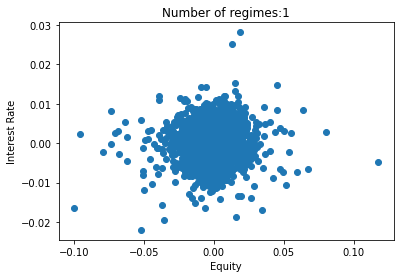

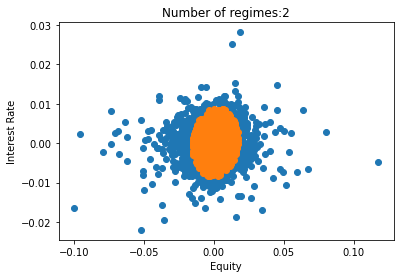

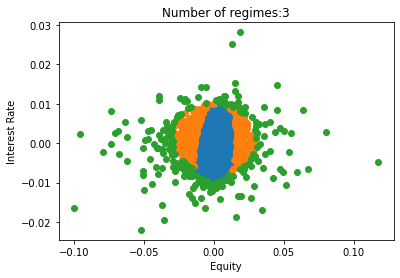

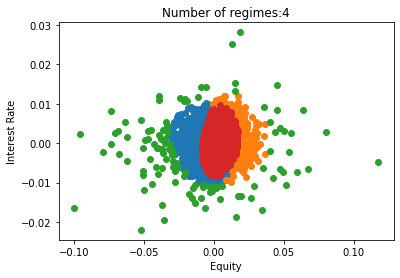

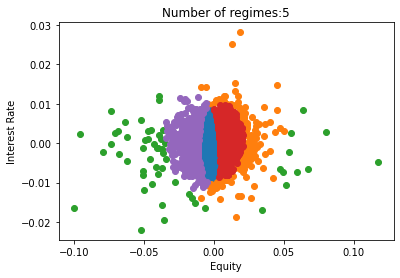

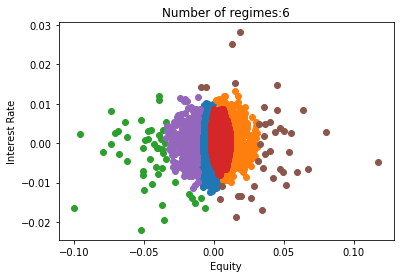

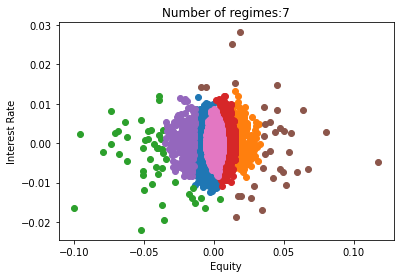

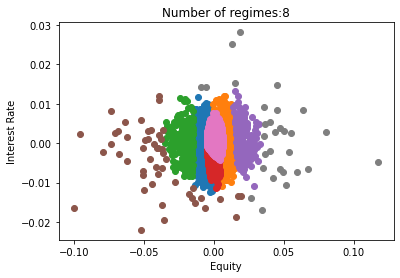

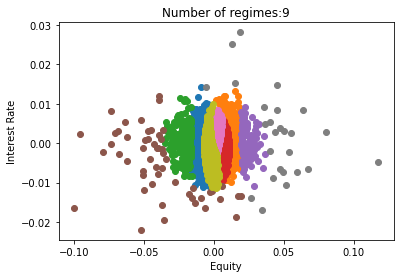

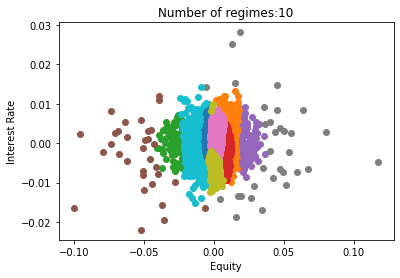

In [41]:
# visualise clusters for 2 factor models
for ind in range(30):
  if(params[ind][0] == 2):
    df = results[ind]
    plt.figure()
    plt.title("Number of regimes:" + str(params[ind][1]))
    for n in range(params[ind][1]):
      plt.scatter(df[df['Regime'] == n]['Equity'], df[df['Regime'] == n]['Interest Rate'])
      plt.xlabel("Equity")
      plt.ylabel("Interest Rate")

## **SENSITIVITY ANALYSIS**

In [42]:
# X = final_df[final_df.columns]
# random_states = random.sample(range(1, 1000), 100)

# n_factors = [2, 4, 15]
# n_components = list(np.arange(1, 11))

# bics = []

# for f in n_factors:
#     for n in n_components:
#         print(f, n)
#         bic = []
#         for s in random_states:
#             X_slice = X[X.columns[:f]]
#             model = mix.GaussianMixture(n_components = n, random_state = s)
#             model.fit(X_slice)
#             ic = model.bic(X_slice)
#             bic.append(ic)
#         bics.append(bic)   

In [43]:
# plt.figure(figsize = (10, 5))
# plt.boxplot(bics[1:10])
# plt.title('BIC values for different initialisation for 2 factors')
# plt.xlabel("Number of regimes")
# plt.ylabel("BIC values")
# plt.xticks(np.arange(1, 10), np.arange(2, 11))
# plt.show()

# plt.figure(figsize = (10, 5))
# plt.boxplot(bics[11:20])
# plt.title('BIC values for different initialisation for 4 factors')
# plt.xlabel("Number of regimes")
# plt.ylabel("BIC values")
# plt.xticks(np.arange(1, 10), np.arange(2, 11))
# plt.show()

# plt.figure(figsize = (10, 5))
# plt.boxplot(bics[21:30])
# plt.title('Information Criteria - Knee Plot', fontsize = 25)
# plt.xlabel("Number of regimes", fontsize = 25)
# plt.ylabel("BIC values", fontsize = 25)
# plt.xticks(np.arange(1, 10), np.arange(2, 11), fontsize = 25)
# plt.yticks(fontsize = 25)
# # plt.plot(np.arange(1, 10), [np.median(b) for b in bics[21:30]])
# plt.show()

## **CONVERGENCE OF PARAMETERS**

In [44]:
X = final_df[final_df.columns]
means = []
vars = []
n_factors = [15]
n_components = [4]
niters = np.arange(1, 26, 1)

for f in n_factors:
    for n in n_components:
        for niter in niters:
            X_slice = X[X.columns[:f]]
            model = mix.GaussianMixture(n_components = n, max_iter = niter, random_state = 42)
            model.fit(X_slice)
            hidden_states = model.predict(X_slice)         
            count_arr = np.bincount(hidden_states)
            ord_lst = len(count_arr) - scipy.stats.rankdata(count_arr).astype(int)+1
            mean_df = pd.DataFrame(index = X_slice.columns)
            var_df = pd.DataFrame(index = X_slice.columns)
            for i in range(model.n_components):
                state_i_df = X_slice.iloc[hidden_states==i]
                mean_df["Mean Regime "+str(ord_lst[i])] = state_i_df.mean() *252
                var_df["Vol Regime "+str(ord_lst[i])] = state_i_df.std() * np.sqrt(252)
            mean_df = mean_df.reindex(sorted(mean_df.columns), axis=1)
            var_df = var_df.reindex(sorted(var_df.columns), axis=1)
            means.append(mean_df)
            vars.append(var_df)

Regime 1 - All factor means converge at iteration: 12


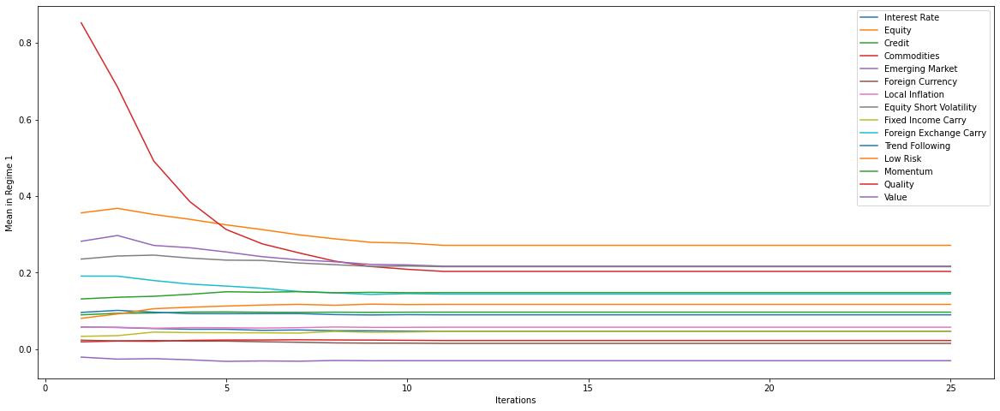

Regime 2 - All factor means converge at iteration: 12


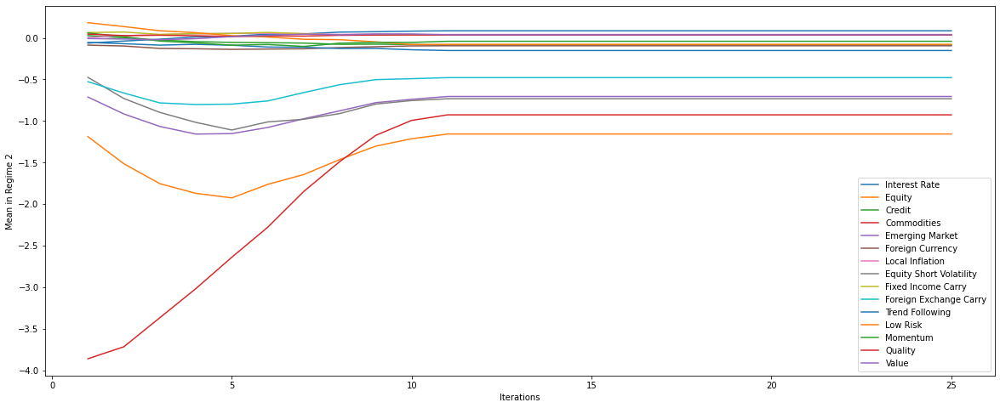

Regime 3 - All factor means converge at iteration: 12


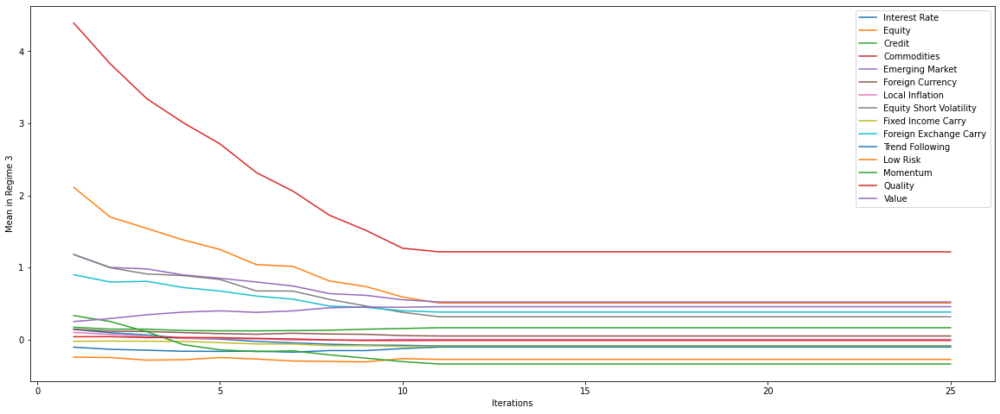

Regime 4 - All factor means converge at iteration: 12


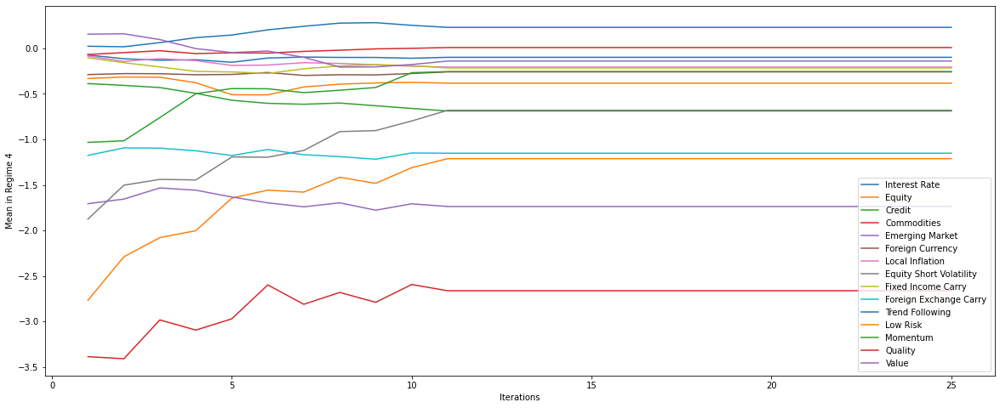

In [45]:
for i in range(4):
  
  regime_means = pd.DataFrame(index = means[0].index, columns = niters)
  for j in range(len(niters)):
    m = means[j]
    regime_means[niters[j]] = m[m.columns[i]]

  for ind in range(1, len(regime_means.columns)):
    if(regime_means[regime_means.columns[ind]].equals(regime_means[regime_means.columns[ind-1]])):
      print("Regime", i+1, "- All factor means converge at iteration:", ind+1)
      break

  regime_means.T.plot(figsize = (20, 8))
  plt.xlabel("Iterations")
  plt.ylabel("Mean in Regime " + str(i+1))
  plt.show()

Regime 1 - All factor volatilities converge at iteration: 12


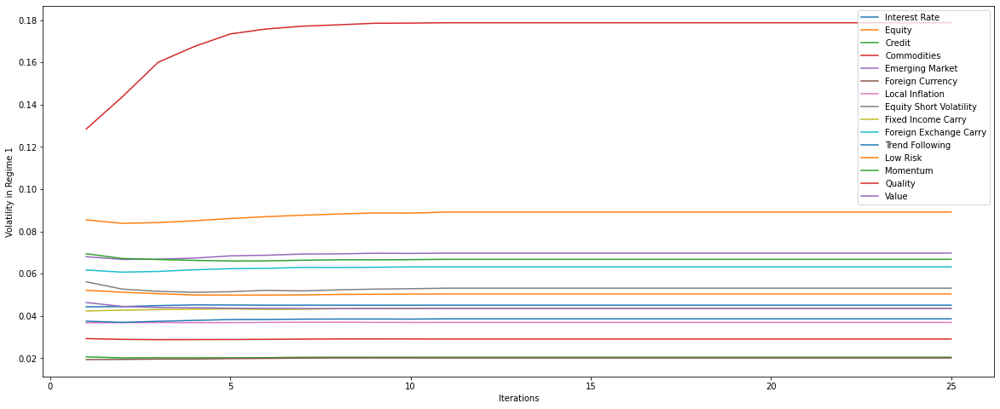

Regime 2 - All factor volatilities converge at iteration: 12


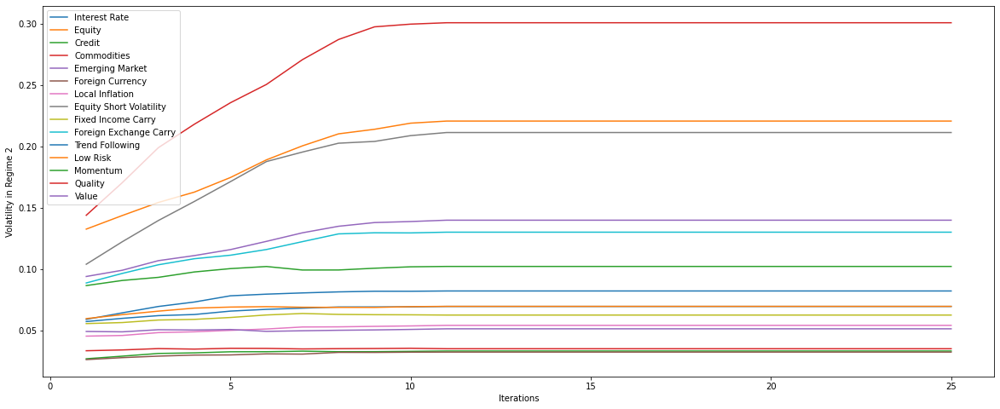

Regime 3 - All factor volatilities converge at iteration: 12


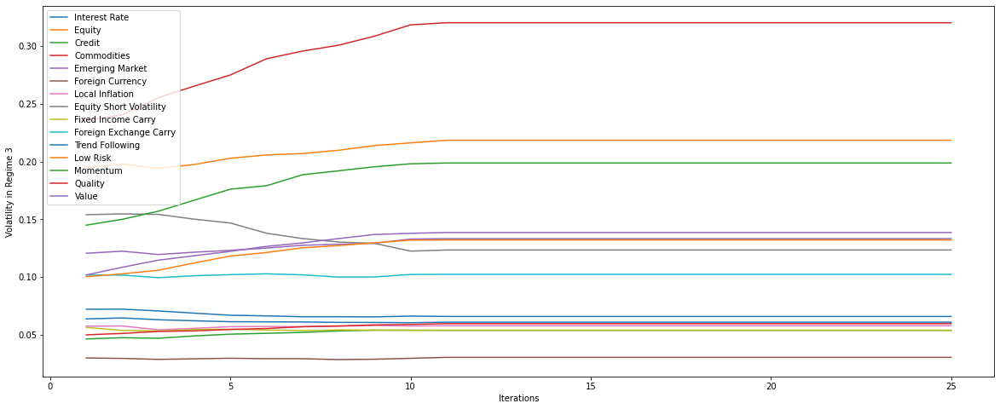

Regime 4 - All factor volatilities converge at iteration: 12


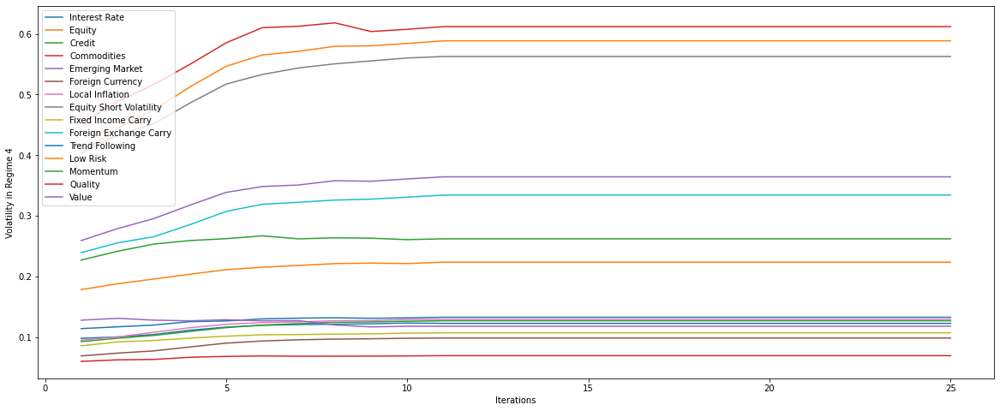

In [46]:
for i in range(4):
  
  regime_vars = pd.DataFrame(index = vars[0].index, columns = niters)
  for j in range(len(niters)):
    v = vars[j]
    regime_vars[niters[j]] = v[v.columns[i]]

  for ind in range(1, len(regime_means.columns)):
    if(regime_means[regime_means.columns[ind]].equals(regime_means[regime_means.columns[ind-1]])):
      print("Regime", i+1, "- All factor volatilities converge at iteration:", ind+1)
      break

  regime_vars.T.plot(figsize = (20, 8))
  plt.xlabel("Iterations")
  plt.ylabel("Volatility in Regime " + str(i+1))
  plt.show()

  # **SMOOTHING THE REGIMES**

## **PROBABILITY THRESHOLD**

In [47]:
## final version of plot_regime
# function to plot regimes with dates

def plot_regime_threshold(data, regime_num, plot_title, distribution = False, with_threshold = False, save_path = False, start_date = None,
                          end_date = None):
    color_lst = ['dodgerblue','orange','navy','slategray','green','tan','purple','olive','pink','grey']
    new_df = pd.DataFrame(data.iloc[:, -regime_num::].values, index=data.index,
                          columns=['Regime '+str(x) for x in range(1,1+regime_num)])

    temp_array = np.zeros(shape=(len(new_df), regime_num))
    temp_array[np.arange(len(new_df)), np.array(new_df).argmax(1)] = 1
    
    #store the way that temp_array is sorted, use same order to sort thres_array
    temp_array_ord = np.argsort(temp_array.sum(axis=0))[::-1] 
    #sort sum, make color same
    #temp_array = temp_array[:,np.argsort(temp_array.sum(axis=0))[::-1]] 
    temp_array = temp_array[:, temp_array_ord]
    
    #sort new_df to accomodate the color
    cols = np.array(new_df.columns.to_list())
    cols = cols[temp_array_ord]
    new_df_sorted = new_df[cols]
  
    #threshold
    new_df_ind = new_df.set_index(np.arange(len(new_df)))
    #print(new_df_ind)
    threshold_array = np.zeros(shape=(len(new_df), regime_num))
    threshold = 0.9
    ind = new_df_ind.index[new_df.max(axis = 1) > threshold] #select index that are larger than threshold
   
    lst = np.argmax(np.array(new_df), axis = 1)
    for i in range(len(new_df)):
        if i in ind or i == 0:
            threshold_array[i,lst[i]] = 1 
        else:
            threshold_array[i,:] = threshold_array[i - 1, :] 

    threshold_array = threshold_array[:, temp_array_ord]
    
    #partial time period
    #partial_time_ind = new_df_ind.index[(new_df.index >= datetime(2020,1,1)) & (new_df.index <= datetime(2022,1,1))]
    #print(partial_time_ind)      
        
    #plot
    fig, ax = plt.subplots(figsize=(30,4))
    if plot_title: 
        title_string = plot_title
    else: title_string = ''
    
    if start_date and end_date:
      idx = np.where((new_df.index >= start_date) & (new_df.index <= end_date))
      new_df = new_df.iloc[idx]
      new_df_sorted = new_df_sorted.iloc[idx]
      threshold_array = threshold_array[idx]
      temp_array = temp_array[idx]

    

    if distribution:
        ax.stackplot(new_df.index, new_df_sorted.T, colors = color_lst[:regime_num],labels=new_df.columns)
        plt.title('Regime Distribution for Each Day: ' + title_string)
        
    elif with_threshold:
        print("number of points exceeding threshold ", threshold, " is: ", len(ind))
        print('percentage:',len(ind)/len(new_df))
        
        
        ax.stackplot(new_df.index, threshold_array.T, colors = color_lst[:regime_num],labels=new_df.columns)
        plt.title("Regime Detection Result with Threshold: "+ title_string)
        ax.axes.get_yaxis().set_visible(False)

    else:
        ax.stackplot(new_df.index, temp_array.T, colors = color_lst[:regime_num],labels=new_df.columns)
        plt.title("Regime Detection Result: "+ title_string)
        ax.axes.get_yaxis().set_visible(False)
        
    plt.legend()

    if save_path:
        plt.savefig(save_path)
    plt.show()
    

Number of factors: 15
Number of regimes: 4
count_arr [3669, 721, 479, 139]


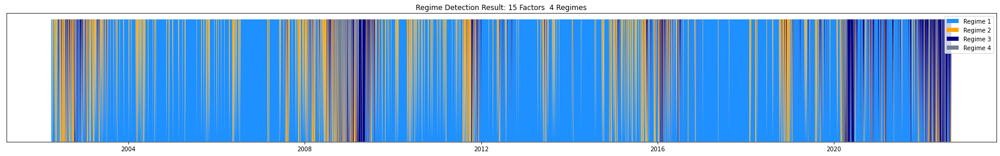

number of points exceeding threshold  0.9  is:  3873
percentage: 0.7733626198083067


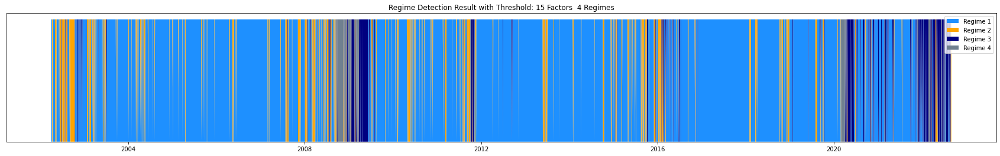

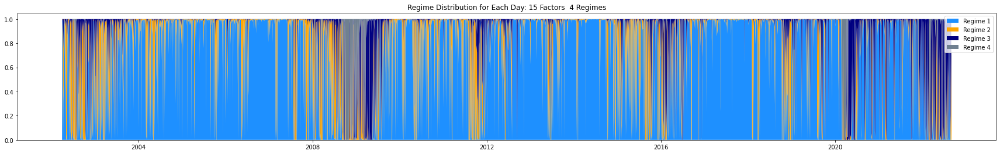

In [48]:
# GMM model: https://scikit-learn.org/stable/modules/generated/sklearn.mixture.GaussianMixture.html

X = final_df[final_df.columns]
models = []
params = []
statistics = []
bic = []
order_lst = []

n_factors = [15]
n_components = list(np.arange(4, 5))

for f in n_factors:
    for n in n_components:

        # get hidden states
        X_slice = X[X.columns[:f]]
        model = mix.GaussianMixture(n_components = n, random_state = 42)
        model.fit(X_slice)
        ic = model.bic(X_slice)
        hidden_states = model.predict(X_slice)
        
        count_arr = np.bincount(hidden_states)
        ord_lst = len(count_arr) - scipy.stats.rankdata(count_arr).astype(int)+1

        # get mean and variance
        mean_df = pd.DataFrame(index = X_slice.columns)
        var_df = pd.DataFrame(index = X_slice.columns)
        sharpe_df = pd.DataFrame(index = X_slice.columns)
        count_df = pd.DataFrame(index = ['count'])
        for i in range(model.n_components):
            state_i_df = X_slice.iloc[hidden_states==i]
            mean_df["Mean Regime "+str(ord_lst[i])] = state_i_df.mean() *252
            var_df["Vol Regime "+str(ord_lst[i])] = state_i_df.std() * np.sqrt(252)
            sharpe_df["SR Regime "+str(ord_lst[i])] = (state_i_df.mean() *252)/(state_i_df.std() * np.sqrt(252))
            count_df.loc['count', "Regime" + str(ord_lst[i])] = count_arr[i]
        mean_df = mean_df.reindex(sorted(mean_df.columns), axis=1)
        var_df = var_df.reindex(sorted(var_df.columns), axis=1)
        sharpe_df = sharpe_df.reindex(sorted(sharpe_df.columns), axis=1)
        count_df = count_df.reindex(sorted(count_df.columns), axis=1)
        
        stats = [mean_df, var_df, sharpe_df, count_df]

        # get transition probabilities
        regimes = pd.DataFrame(hidden_states, index = list(X_slice.index), columns = ['Regime'])
        names = ["Tran. Prob. to state" + str(i) for i in range(model.n_components)]
        prob = pd.DataFrame(model.predict_proba(X_slice), index = list(X_slice.index), columns = names)
        res = pd.concat([X_slice, regimes, prob], axis = 1).dropna()

        # print chart
        print("Number of factors:", f)
        print("Number of regimes:", n)
        #print("count_arr",sorted(count_arr)[::-1])
        print("count_arr",sorted(count_arr)[::-1])
        str_title = str(f) + ' Factors  ' +  str(n) + ' Regimes'
        #r1 = res.loc[(res.index >= datetime(2008,1,1)) & (res.index <= datetime(2010,1,1))]
        plot_regime_threshold(res, regime_num = n, plot_title = str_title, distribution = False, with_threshold = False) #plot maximum
        plot_regime_threshold(res, regime_num = n, plot_title = str_title, distribution = False, with_threshold = True)     #plot threshold
        plot_regime_threshold(res, regime_num = n, plot_title = str_title, distribution = True,  with_threshold = False)  #plot distribution
        """
        if f == 15 and n == 4:
        r1 = res.loc[(res.index >= datetime(2008,1,1)) & (res.index <= datetime(2010,1,1))]
        r2 = res.loc[(res.index >= datetime(2020,1,1)) & (res.index <= datetime(2022,1,1))]
        plot_regime(r1, regime_num = n, plot_title = str_title + ' in 2008, 2009', distribution = False)
        plot_regime(r1, regime_num = n,  plot_title = str_title + ' in 2008, 2009', distribution = True)
        plot_regime(r2, regime_num = n, plot_title = str_title + ' in 2020, 2021', distribution = False)
        plot_regime(r2, regime_num = n,  plot_title = str_title + ' in 2020, 2021', distribution = True)
        """
        print()

        # save results
        models.append(model)
        params.append([f, n])
        statistics.append(stats)
        bic.append(ic)
        order_lst.append(ord_lst)
        

## **ROLLING WINDOW TRANSITION PROBABILITIES AVERAGE**

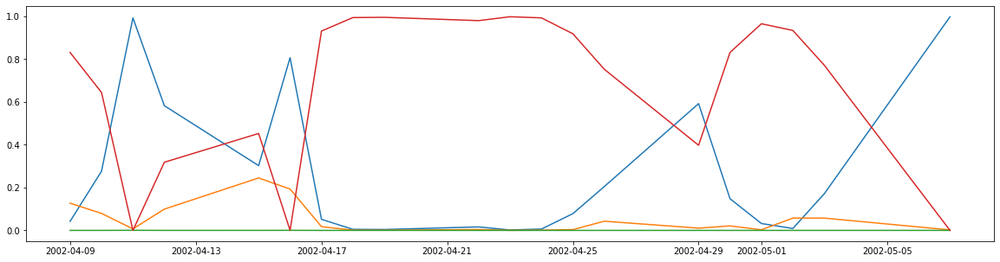

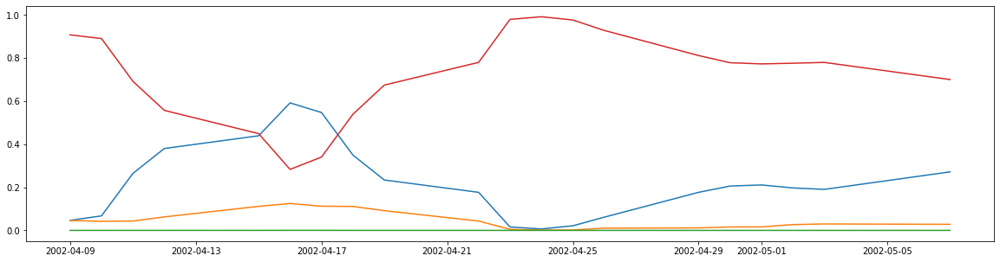

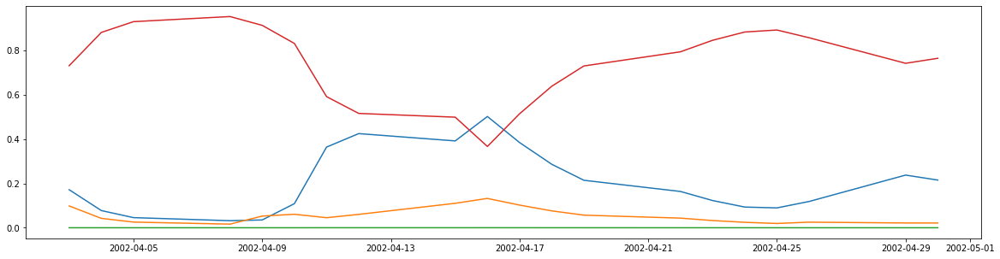

In [49]:
non_smooth = results[23]
plt.figure(figsize = (20, 5))
plt.plot(non_smooth['Tran. Prob. to state0'][4:24])
plt.plot(non_smooth['Tran. Prob. to state1'][4:24])
plt.plot(non_smooth['Tran. Prob. to state2'][4:24])
plt.plot(non_smooth['Tran. Prob. to state3'][4:24])
plt.show()

smooth = results[23].rolling(window = 5).mean().dropna()
smooth['Regime'] = smooth[['Tran. Prob. to state0', 'Tran. Prob. to state1', 'Tran. Prob. to state2', 'Tran. Prob. to state3']].max(axis = 1)
plt.figure(figsize = (20, 5))
plt.plot(smooth['Tran. Prob. to state0'][:20])
plt.plot(smooth['Tran. Prob. to state1'][:20])
plt.plot(smooth['Tran. Prob. to state2'][:20])
plt.plot(smooth['Tran. Prob. to state3'][:20])
plt.show()

# weights = np.arange(1,6)
# smooth_exp = results[23].rolling(window = 5).apply(lambda prices: np.dot(prices, weights)/weights.sum()).dropna()
smooth_exp = results[23].ewm(alpha = 0.25).mean().dropna()
smooth_exp['Regime'] = smooth_exp[['Tran. Prob. to state0', 'Tran. Prob. to state1', 'Tran. Prob. to state2', 'Tran. Prob. to state3']].max(axis = 1)
plt.figure(figsize = (20, 5))
plt.plot(smooth_exp['Tran. Prob. to state0'][:20])
plt.plot(smooth_exp['Tran. Prob. to state1'][:20])
plt.plot(smooth_exp['Tran. Prob. to state2'][:20])
plt.plot(smooth_exp['Tran. Prob. to state3'][:20])
plt.show()

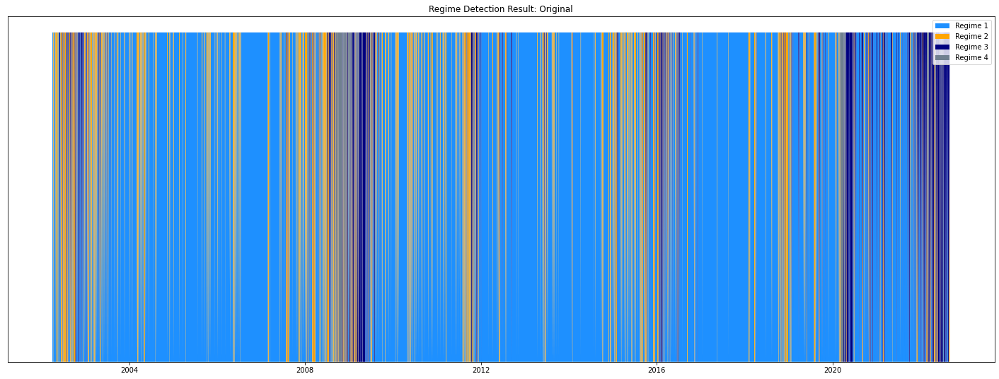

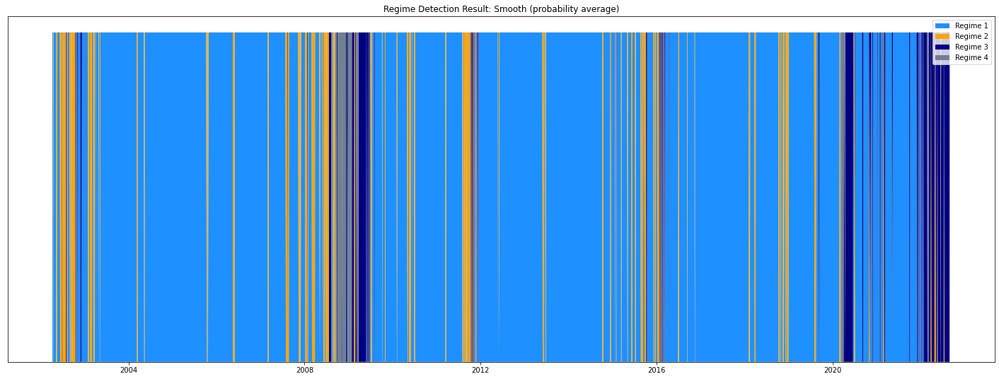

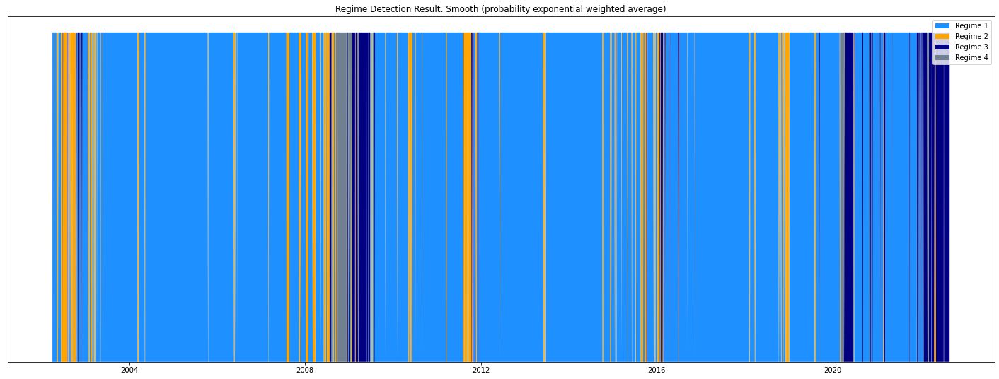

In [50]:
plot_regime(non_smooth, regime_num = 4, plot_title = "Original", distribution = False)
plot_regime(smooth, regime_num = 4, plot_title = "Smooth (probability average)", distribution = False)
plot_regime(smooth_exp, regime_num = 4, plot_title = "Smooth (probability exponential weighted average)", distribution = False)

## **MAJORITY VOTE** 

In [51]:
def get_data_and_stats(year, num_of_regimes = 4, final_df = final_df):
    training = final_df[(final_df.index >= datetime(year-13, 1, 1)) & (final_df.index < datetime(year, 1, 1))]
    test = final_df[(final_df.index >= datetime(year, 1, 1)) & (final_df.index <= datetime(year, 12, 31))]
    model = mix.GaussianMixture(n_components = num_of_regimes, random_state = 42)
    model.fit(training)
    in_sample = model.predict(training)
    mean_dict, std_dict, sharpe_dict = {}, {}, {}
    for i in range(model.n_components):
        state_i_df = training.iloc[in_sample == i]
        mean_dict[i] = state_i_df.mean() * 252
        std_dict[i] = state_i_df.std() * np.sqrt(252)
        sharpe_dict[i] = (state_i_df.mean() *252)/(state_i_df.std() * np.sqrt(252))
    train_regime = pd.DataFrame(in_sample, columns = ['regime'], index = training.index)
    ##add test_regime to plot 2022
    test_regime =pd.DataFrame( model.predict(test), columns = ['regime'], index = test.index)
    return mean_dict, std_dict, sharpe_dict, train_regime, test_regime

def majority_vote_weekly(year, daily_regime):
  weekly_first_date = daily_regime.resample('W').first().index
  weekly_first_date = [x + timedelta(days=1) for x in weekly_first_date] 
  weekly_regime_tohold = pd.DataFrame(index = daily_regime.index, columns=['regime to hold'])  
  for i in range(1,len(weekly_first_date)):
    last_week_regime = daily_regime.loc[(daily_regime.index < weekly_first_date[i])&(daily_regime.index >= weekly_first_date[i-1])]
    last_week_regime_count = last_week_regime.groupby('regime').size().sort_values()
    # if regime count are all ones, use the last date's regime
    if last_week_regime_count.iloc[-1] == 1:
      regime_max = int(last_week_regime.iloc[-1])  
    # if regime count are 2 v.s. 2, use the regime in the latest date belong to those 2 regimes
    elif len(last_week_regime_count) not in [0,1] and last_week_regime_count.iloc[-1] == last_week_regime_count.iloc[-2]:
      last_date1 = last_week_regime[last_week_regime==last_week_regime_count.iloc[-1]].index[-1]
      last_date2 = last_week_regime[last_week_regime==last_week_regime_count.iloc[-2]].index[-1]
      regime_max = int(last_week_regime.loc[max(last_date1,last_date2)])  
    # no equal counts, use the majority
    else:
      regime_max = last_week_regime_count.index[-1]
    if i != len(weekly_first_date) - 1:
      current_week_dates = daily_regime.loc[(daily_regime.index < weekly_first_date[i+1])&(daily_regime.index >= weekly_first_date[i])].index
    else:
      current_week_dates = daily_regime.loc[daily_regime.index >= weekly_first_date[i]].index  
    weekly_regime_tohold.loc[current_week_dates, 'regime to hold'] = regime_max
  weekly_regime_tohold = weekly_regime_tohold.dropna() 
  return weekly_regime_tohold

def label_regime (row, regime, idx_lst):
  for i in range(4):
    if regime == i+1:
      if row['regime to hold'] == idx_lst[i] :
        return 1
      return 0

def plot_majority_vote(year, num_of_regimes = 4, train_plot = True, show_stats = False):
  """
  train_plot: plot training set: True; plot test set: False
  """
  mean_dict, std_dict, sharpe_dict, train_regime, test_regime = get_data_and_stats(year, num_of_regimes)
  if train_plot == True:
    res = majority_vote_weekly(year, train_regime)
  else:
    res = test_regime
    res.columns = ['regime to hold']

  idx_lst =  res.groupby('regime to hold')['regime to hold'].count().sort_values(ascending = False).index

  for i in range(num_of_regimes):
    res['Regime_'+str(i+1)] = res.apply(lambda row: label_regime (row, i+1, idx_lst), axis = 1)
  res = res[['Regime_1','Regime_2','Regime_3','Regime_4']]


  color_lst = ['dodgerblue','orange','navy','slategray','green','tan','purple','olive','pink','grey']
  fig, ax = plt.subplots(figsize=(30,4))
  ax.stackplot(res.index, res.T, colors = color_lst[:num_of_regimes],labels=res.columns)
  ax.axes.get_yaxis().set_visible(False)
  
  if train_plot == True:
    plt.title(str(year) +" Training Set Regime Detection Result After Majority Vote Smoothing")
  else:
    plt.title(str(year) + " Test Set Regime Detection Result After Majority Vote Smoothing")
  
  plt.legend()
  plt.show()

  if show_stats == True:
    smoothed_train_mean = pd.DataFrame.from_dict(mean_dict)
    smoothed_train_mean = smoothed_train_mean[idx_lst]
    smoothed_train_mean.columns = ['Regime 1 Mean','Regime 2 Mean', 'Regime 3 Mean', 'Regime 4 Mean']

    smoothed_train_std = pd.DataFrame.from_dict(std_dict)
    smoothed_train_std = smoothed_train_std[idx_lst]
    smoothed_train_std.columns = ['Regime 1 Std','Regime 2 Std', 'Regime 3 Std', 'Regime 4 Std']

    smoothed_train_sr = pd.DataFrame.from_dict(sharpe_dict)
    smoothed_train_sr = smoothed_train_sr[idx_lst]
    smoothed_train_sr.columns = ['Regime 1 SR','Regime 2 SR', 'Regime 3 SR', 'Regime 4 SR']

    stats_res = pd.concat([smoothed_train_mean,smoothed_train_std,smoothed_train_sr],axis = 1)
    display(stats_res)

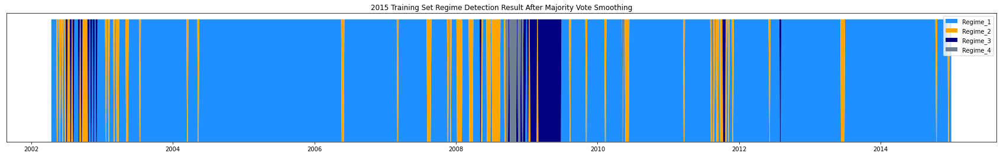

In [52]:
plot_majority_vote(2015, num_of_regimes = 4, train_plot = True)

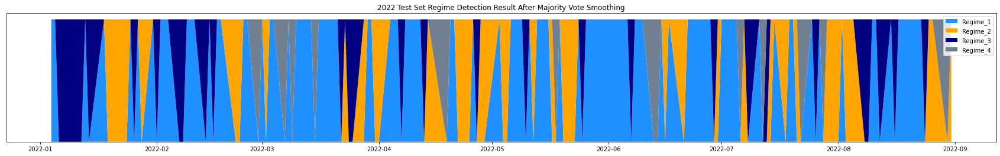

In [53]:
#plot 2022 test set prediction, show predicted inflation
plot_majority_vote(2022, num_of_regimes = 4, train_plot = False)

# **PCA ANALYSIS**

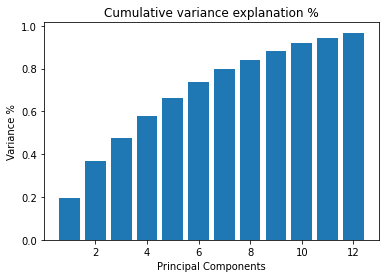

In [54]:
df = (final_df - final_df.min(axis = 0))/(final_df.max(axis = 0) - final_df.min(axis = 0))
pca = PCA(n_components = 12)
pca.fit(df)
PC = range(1, pca.n_components_+1)
plt.bar(PC, pca.explained_variance_ratio_.cumsum())
plt.xlabel('Principal Components')
plt.ylabel('Variance %')
plt.title("Cumulative variance explanation %")
plt.show()

# loadings = pca.components_.T * np.sqrt(pca.explained_variance_)
# loading_matrix = pd.DataFrame(loadings, columns=['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8'], index = final_df.columns)

# plt.barh(y = loading_matrix.index, width = loading_matrix['PC1'])
# plt.title("first component")
# plt.show()
# plt.close()

# plt.barh(y = loading_matrix.index, width = loading_matrix['PC2'])
# plt.title("second component")
# plt.show()
# plt.close()

# plt.barh(y = loading_matrix.index, width = loading_matrix['PC3'])
# plt.title("third component")
# plt.show()
# plt.close()

# plt.barh(y = loading_matrix.index, width = loading_matrix['PC4'])
# plt.title("fourth component")
# plt.show()
# plt.close()

# plt.barh(y = loading_matrix.index, width = loading_matrix['PC5'])
# plt.title("fifth component")
# plt.show()
# plt.close()

# plt.barh(y = loading_matrix.index, width = loading_matrix['PC6'])
# plt.title("sixth component")
# plt.show()
# plt.close()

# plt.barh(y = loading_matrix.index, width = loading_matrix['PC7'])
# plt.title("seventh component")
# plt.show()
# plt.close()

# plt.barh(y = loading_matrix.index, width = loading_matrix['PC8'])
# plt.title("eighth component")
# plt.show()
# plt.close()

order [4 1 3 2]
Number of factors: 8
Number of regimes: 4
count_arr [2433, 1492, 801, 282]


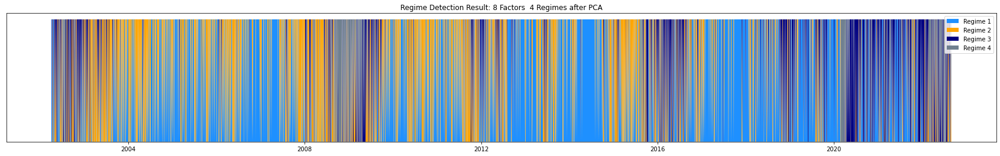

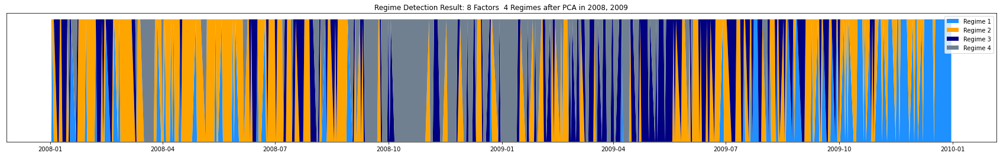

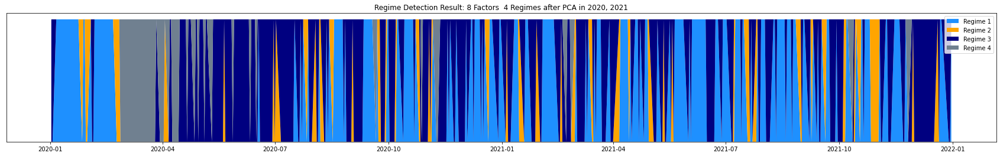

In [55]:
# Use the principal components to run the GMM model, and calculate the mean and standard of each factor under regimes decided by the model.

BIC = []
for n in range(1, 11):
  new_factors = pd.DataFrame(pca.fit_transform(df), 
                             columns=['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10', 'PC11', 'PC12'], 
                            index = df.index)
  X_slice = new_factors.copy()
  f = 8
  model = mix.GaussianMixture(n_components = n, random_state = 42)
  model.fit(X_slice)
  ic = model.bic(X_slice)
  BIC.append(ic)
  hidden_states = model.predict(X_slice)

  if n == 4:
    count_arr = np.bincount(hidden_states)
    ord_lst = len(count_arr) - scipy.stats.rankdata(count_arr).astype(int)+1
    print("order",ord_lst)

    # get mean and variance
    mean_df = pd.DataFrame(index = final_df.columns)
    var_df = pd.DataFrame(index = final_df.columns)
    sharpe_df = pd.DataFrame(index = final_df.columns)
    count_df = pd.DataFrame(index = ['count'])
    for i in range(model.n_components):
        state_i_df = final_df.iloc[hidden_states==i]
        mean_df["Mean Regime "+str(ord_lst[i])] = state_i_df.mean() *252
        var_df["Vol Regime "+str(ord_lst[i])] = state_i_df.std() * np.sqrt(252)
        sharpe_df["SR Regime "+str(ord_lst[i])] = (state_i_df.mean() *252)/(state_i_df.std() * np.sqrt(252))
        count_df.loc['count', "Regime" + str(ord_lst[i])] = count_arr[i]
    mean_df = mean_df.reindex(sorted(mean_df.columns), axis=1)
    var_df = var_df.reindex(sorted(var_df.columns), axis=1)
    sharpe_df = sharpe_df.reindex(sorted(sharpe_df.columns), axis=1)
    count_df = count_df.reindex(sorted(count_df.columns), axis=1)

    stats = [mean_df, var_df, sharpe_df, count_df]

    # get transition probabilities
    regimes = pd.DataFrame(hidden_states, index = list(X_slice.index), columns = ['Regime'])
    names = ["Tran. Prob. to state" + str(i) for i in range(model.n_components)]
    prob = pd.DataFrame(model.predict_proba(X_slice), index = list(X_slice.index), columns = names)
    res = pd.concat([X_slice, regimes, prob], axis = 1).dropna()

    # print chart
    print("Number of factors:", 8)
    print("Number of regimes:", 4)
    print("count_arr",sorted(count_arr)[::-1])
    str_title = str(8) + ' Factors  ' +  str(4) + ' Regimes' + ' after PCA'
    plot_regime_threshold(res, regime_num = n, plot_title = str_title)
    plot_regime_threshold(res, regime_num = n, plot_title = str_title + ' in 2008, 2009', start_date = datetime(2008,1,1), end_date = datetime(2009,12,31))
    plot_regime_threshold(res, regime_num = n, plot_title = str_title + ' in 2020, 2021', start_date = datetime(2020,1,1), end_date = datetime(2021,12,31))
    print()
    stats_df = pd.concat(stats[:-1], axis = 1)

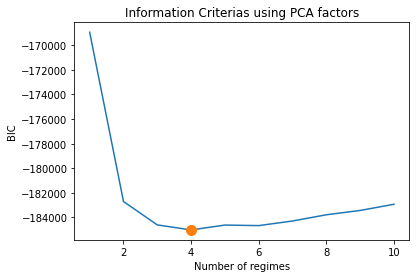

In [56]:
plt.figure()
plt.title("Information Criterias using PCA factors")
plt.plot(np.arange(1, 11), BIC[:10])
plt.plot(1+np.argmin(BIC[:10]), min(BIC[:10]), marker = '.', markersize = 20)
plt.xlabel("Number of regimes")
plt.ylabel("BIC")
plt.show()

In [57]:
stats_df

,Mean Regime 1,Mean Regime 2,Mean Regime 3,Mean Regime 4,Vol Regime 1,Vol Regime 2,Vol Regime 3,Vol Regime 4,SR Regime 1,SR Regime 2,SR Regime 3,SR Regime 4
Interest Rate,0.038328,0.076214,0.013531,-0.145010,0.036937,0.067078,0.044496,0.106333,1.037660,1.136211,0.304100,-1.363740
Equity,0.287819,-0.255195,0.274695,-1.076486,0.071748,0.162861,0.173284,0.470617,4.011544,-1.566954,1.585236,-2.287393
Credit,0.096188,0.032947,0.109403,-0.332052,0.016933,0.032102,0.036992,0.100185,5.680438,1.026324,2.957456,-3.314376
Commodities,0.233869,-0.097301,0.289431,-1.294131,0.150042,0.256220,0.247191,0.561527,1.558685,-0.379756,1.170881,-2.304666
Emerging Market,0.248841,-0.183814,0.306000,-0.992725,0.055805,0.114458,0.105123,0.297436,4.459090,-1.605954,2.910891,-3.337612
Foreign Currency,0.019732,-0.029694,0.017747,-0.150806,0.017123,0.028958,0.025121,0.075040,1.152367,-1.025443,0.706457,-2.009665
Local Inflation,0.049638,0.059571,0.050872,-0.134675,0.031093,0.052633,0.040894,0.106645,1.596431,1.131824,1.244000,-1.262831
Equity Short Volatility,0.208097,-0.088508,0.186784,-0.723748,0.043308,0.122182,0.135188,0.436590,4.805016,-0.724392,1.381662,-1.657731
Fixed Income Carry,0.059213,0.031056,-0.005294,-0.231903,0.036698,0.059966,0.044964,0.094172,1.613537,0.517897,-0.117732,-2.462543
Foreign Exchange Carry,0.171813,-0.125763,0.149975,-0.510868,0.053785,0.103748,0.083782,0.265390,3.194448,-1.212191,1.790058,-1.924969


# **ROBUSTNESS CHECK**



## **2000-2011**

order [1]
Number of factors: 15
Number of regimes: 1
count_arr [2392]


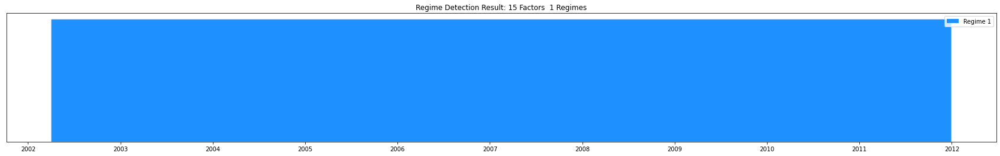


order [2 1]
Number of factors: 15
Number of regimes: 2
count_arr [1982, 410]


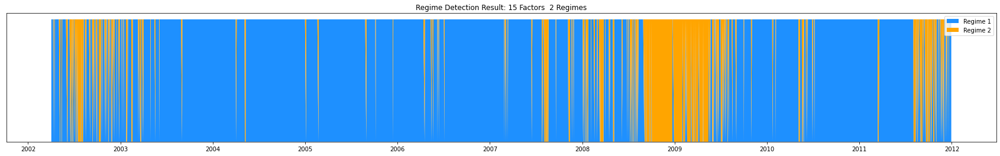


order [3 2 1]
Number of factors: 15
Number of regimes: 3
count_arr [1823, 455, 114]


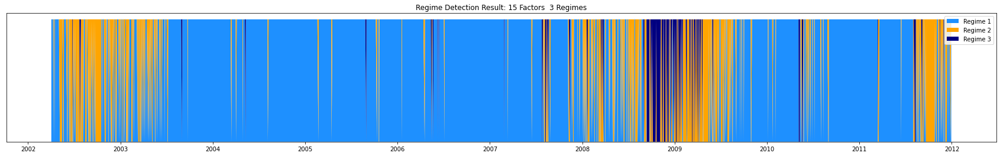


order [4 3 1 2]
Number of factors: 15
Number of regimes: 4
count_arr [1693, 426, 201, 72]


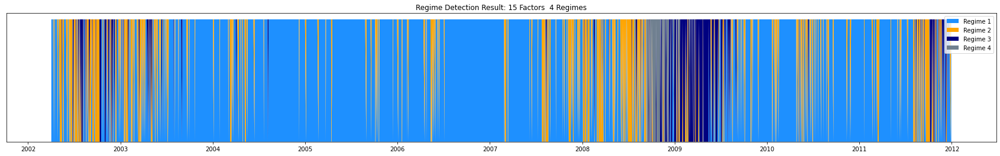

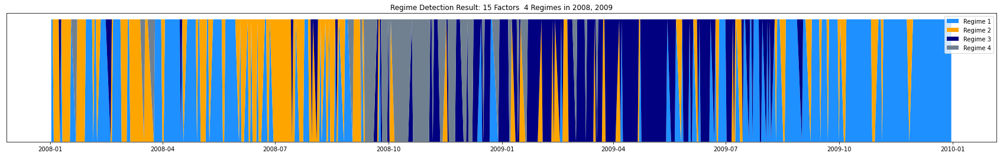

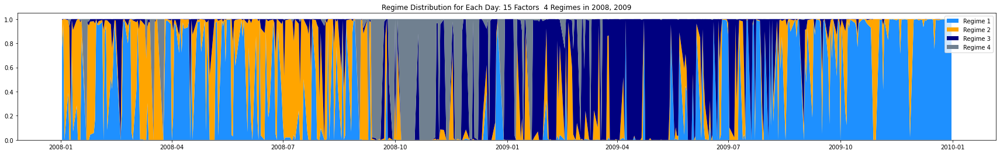


order [2 4 3 1 5]
Number of factors: 15
Number of regimes: 5
count_arr [1672, 359, 169, 130, 62]


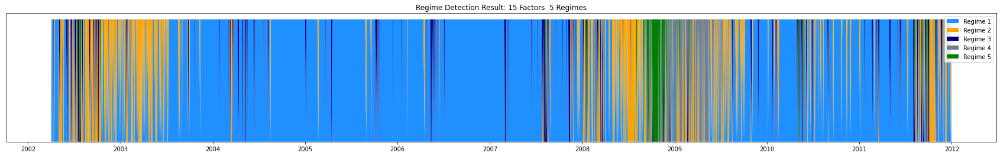


order [2 3 4 1 6 5]
Number of factors: 15
Number of regimes: 6
count_arr [1651, 342, 163, 146, 57, 33]


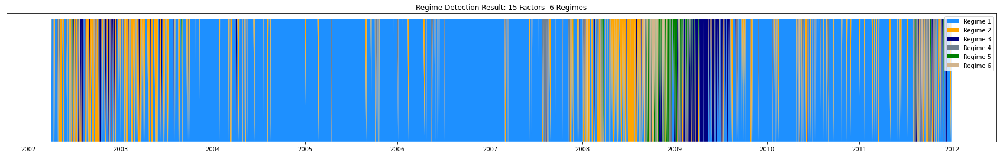


order [6 3 2 1 7 5 4]
Number of factors: 15
Number of regimes: 7
count_arr [1548, 350, 152, 129, 98, 93, 22]


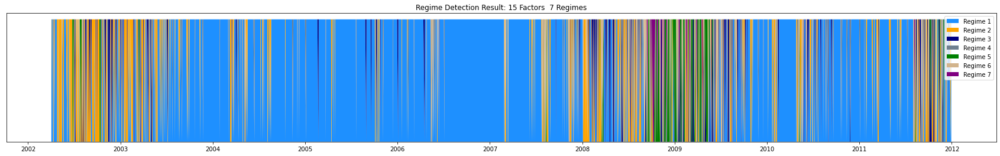


order [5 4 3 8 2 1 7 6]
Number of factors: 15
Number of regimes: 8
count_arr [1414, 407, 171, 152, 107, 68, 54, 19]


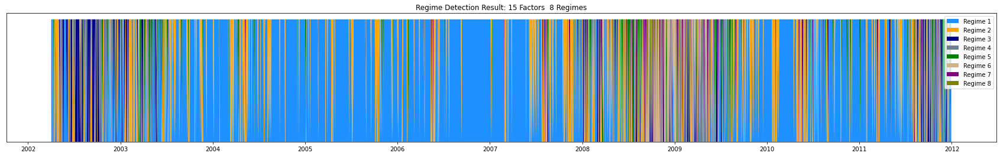


order [4 5 3 8 2 1 7 9 6]
Number of factors: 15
Number of regimes: 9
count_arr [1494, 325, 157, 123, 102, 85, 69, 24, 13]


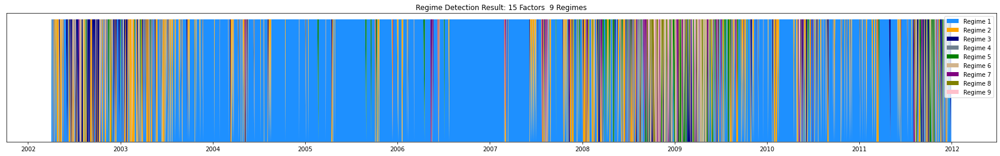


order [ 4  6  3  9  1  5  8 10  7  2]
Number of factors: 15
Number of regimes: 10
count_arr [1254, 481, 170, 148, 136, 79, 59, 32, 21, 12]


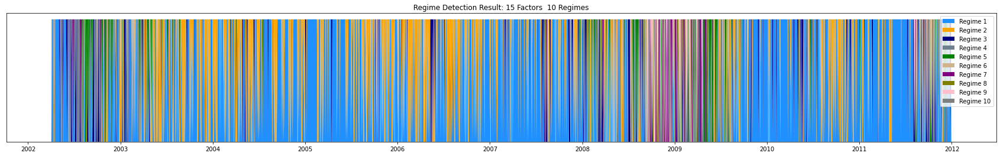

In [58]:
X1 = final_df.loc[(final_df.index >= datetime(2000,1,1)) & (final_df.index <= datetime(2011,12,31))]
models = []
params = []
statistics = []
results = []
bic = []
order_lst = []

n_components = list(np.arange(1, 11))
f = 15
for n in n_components:
    # get hidden states
    X_slice = X1.copy()
    model = mix.GaussianMixture(n_components = n, random_state = 42)
    model.fit(X_slice)
    ic = model.bic(X_slice)
    hidden_states = model.predict(X_slice)
    
    count_arr = np.bincount(hidden_states)
    ord_lst = len(count_arr) - scipy.stats.rankdata(count_arr).astype(int)+1
    print("order",ord_lst)
    # get mean and variance
    mean_df = pd.DataFrame(index = X_slice.columns)
    var_df = pd.DataFrame(index = X_slice.columns)
    sharpe_df = pd.DataFrame(index = X_slice.columns)
    count_df = pd.DataFrame(index = ['count'])
    for i in range(model.n_components):
        state_i_df = X_slice.iloc[hidden_states==i]
        mean_df["Mean Regime "+str(ord_lst[i])] = state_i_df.mean() *252
        var_df["Vol Regime "+str(ord_lst[i])] = state_i_df.std() * np.sqrt(252)
        sharpe_df["SR Regime "+str(ord_lst[i])] = (state_i_df.mean() *252)/(state_i_df.std() * np.sqrt(252))
        count_df.loc['count', "Regime" + str(ord_lst[i])] = count_arr[i]
    mean_df = mean_df.reindex(sorted(mean_df.columns), axis=1)
    var_df = var_df.reindex(sorted(var_df.columns), axis=1)
    sharpe_df = sharpe_df.reindex(sorted(sharpe_df.columns), axis=1)
    count_df = count_df.reindex(sorted(count_df.columns), axis=1)
    
    stats = [mean_df, var_df, sharpe_df, count_df]

    # get transition probabilities
    regimes = pd.DataFrame(hidden_states, index = list(X_slice.index), columns = ['Regime'])
    names = ["Tran. Prob. to state" + str(i) for i in range(model.n_components)]
    prob = pd.DataFrame(model.predict_proba(X_slice), index = list(X_slice.index), columns = names)
    res = pd.concat([X_slice, regimes, prob], axis = 1).dropna()

    # print chart
    print("Number of factors:", 15)
    print("Number of regimes:", n)
    print("count_arr",sorted(count_arr)[::-1])
    str_title = str(f) + ' Factors  ' +  str(n) + ' Regimes'
    plot_regime_threshold(res, regime_num = n, plot_title = str_title)
    if f == 15 and n == 4:
        plot_regime_threshold(res, regime_num = n, plot_title = str_title + ' in 2008, 2009', start_date = datetime(2008,1,1), end_date = datetime(2009,12,31))
        plot_regime_threshold(res, regime_num = n, plot_title = str_title + ' in 2008, 2009', distribution = True, start_date = datetime(2008,1,1), end_date = datetime(2009,12,31))

    print()

    # save results
    models.append(model)
    params.append([f, n])
    statistics.append(stats)
    results.append(res)
    bic.append(ic)
    order_lst.append(ord_lst)

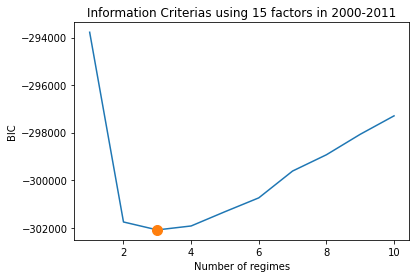

In [59]:
plt.figure()
plt.title("Information Criterias using 15 factors in 2000-2011")
plt.plot(np.arange(1, 11), bic[:10])
plt.plot(1+np.argmin(bic[:10]), min(bic[:10]), marker = '.', markersize = 20)
plt.xlabel("Number of regimes")
plt.ylabel("BIC")
plt.show()

In [60]:
pd.concat(statistics[2], axis = 1)

,Mean Regime 1,Mean Regime 2,Mean Regime 3,Vol Regime 1,Vol Regime 2,Vol Regime 3,SR Regime 1,SR Regime 2,SR Regime 3,Regime1,Regime2,Regime3
Interest Rate,0.068596,0.088919,0.085570,0.054742,0.064578,0.108762,1.253070,1.376930,0.786766,NaN,NaN,NaN
Equity,0.197650,-0.283738,-1.541873,0.109631,0.257318,0.548197,1.802873,-1.102675,-2.812625,NaN,NaN,NaN
Credit,0.094985,0.106339,-0.433714,0.023530,0.052809,0.093988,4.036818,2.013656,-4.614548,NaN,NaN,NaN
Commodities,0.237427,0.102627,-1.727082,0.218358,0.295121,0.594679,1.087329,0.347746,-2.904227,NaN,NaN,NaN
Emerging Market,0.230227,0.023612,-1.628031,0.084118,0.149199,0.371724,2.736951,0.158259,-4.379672,NaN,NaN,NaN
Foreign Currency,0.006815,-0.022221,-0.256382,0.022324,0.035823,0.095207,0.305294,-0.620298,-2.692883,NaN,NaN,NaN
Local Inflation,0.066166,0.078707,-0.049307,0.042993,0.057118,0.110623,1.539009,1.377960,-0.445723,NaN,NaN,NaN
Equity Short Volatility,0.194504,-0.203082,-1.029326,0.066807,0.204280,0.499852,2.911442,-0.994135,-2.059262,NaN,NaN,NaN
Fixed Income Carry,0.038515,0.045432,-0.057483,0.048464,0.052782,0.071189,0.794714,0.860751,-0.807471,NaN,NaN,NaN
Foreign Exchange Carry,0.141262,0.013241,-1.003640,0.070460,0.121909,0.340673,2.004856,0.108611,-2.946050,NaN,NaN,NaN


## **2012-2022**

order [1]
Number of factors: 15
Number of regimes: 1
count_arr [2616]


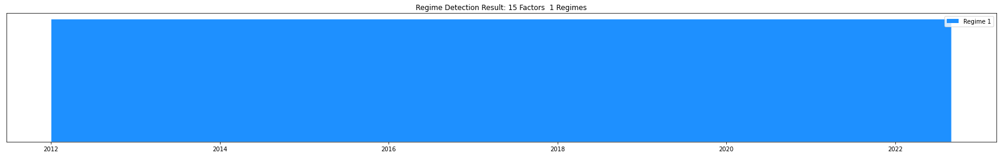


order [2 1]
Number of factors: 15
Number of regimes: 2
count_arr [2254, 362]


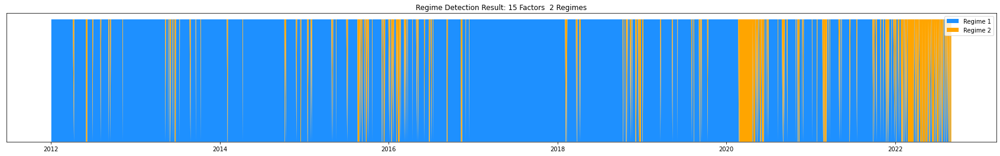


order [3 2 1]
Number of factors: 15
Number of regimes: 3
count_arr [2045, 505, 66]


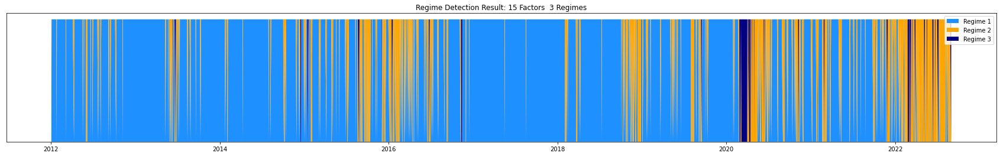


order [4 1 2 3]
Number of factors: 15
Number of regimes: 4
count_arr [1949, 358, 261, 48]


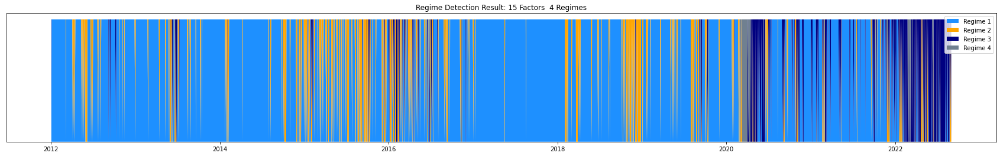

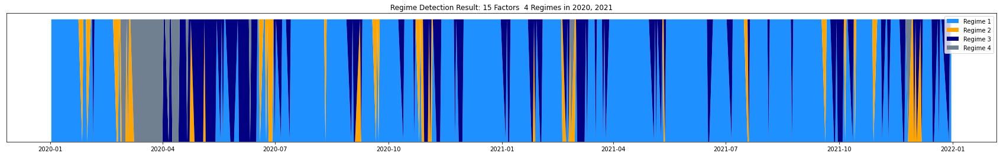

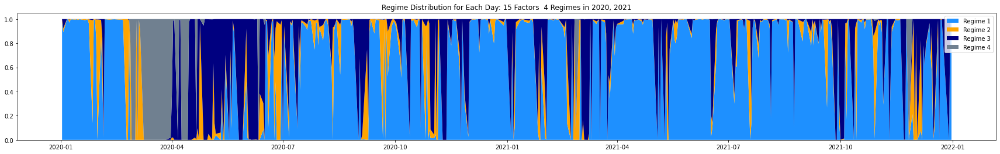


order [4 1 2 3 5]
Number of factors: 15
Number of regimes: 5
count_arr [1881, 450, 214, 50, 21]


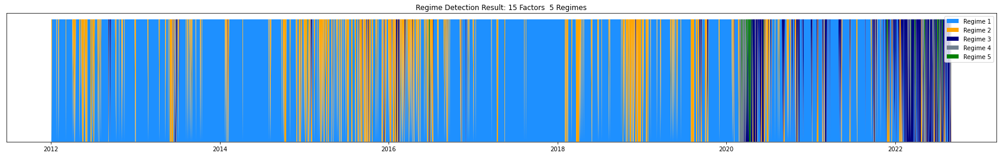


order [4 1 2 3 5 6]
Number of factors: 15
Number of regimes: 6
count_arr [1855, 489, 159, 85, 24, 4]


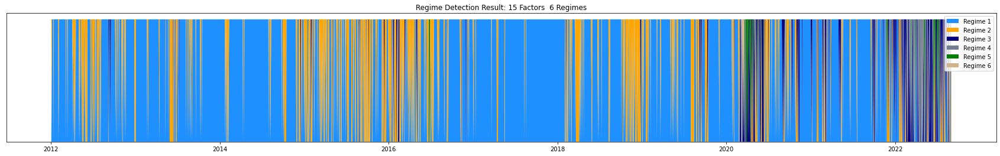


order [6 5 2 5 3 7 1]
Number of factors: 15
Number of regimes: 7
count_arr [1861, 407, 201, 62, 62, 19, 4]


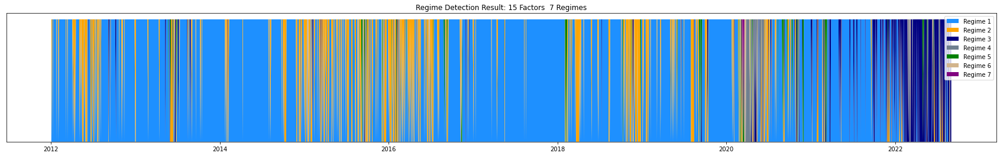


order [3 1 4 6 8 2 5 7]
Number of factors: 15
Number of regimes: 8
count_arr [1868, 344, 150, 122, 68, 31, 29, 4]


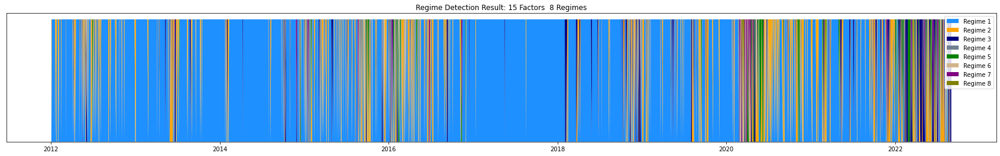


order [5 1 3 7 9 2 6 8 4]
Number of factors: 15
Number of regimes: 9
count_arr [1846, 261, 234, 120, 61, 43, 26, 21, 4]


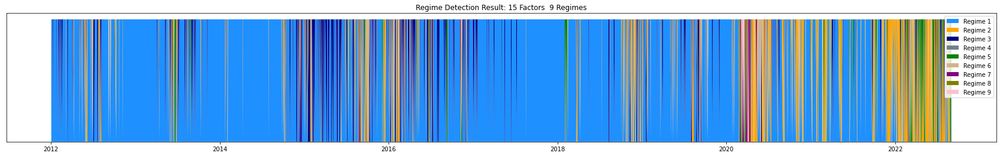


order [ 6  3  1  9 10  5  7  9  4  2]
Number of factors: 15
Number of regimes: 10
count_arr [1788, 185, 161, 151, 149, 79, 53, 23, 23, 4]


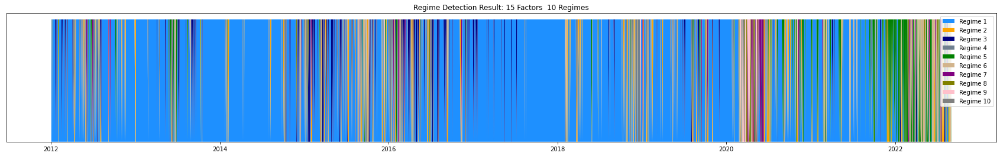

In [61]:
X2 = final_df.loc[(final_df.index >= datetime(2012,1,1))]
models = []
params = []
statistics = []
results = []
bic = []
order_lst = []
f = 15
n_components = list(np.arange(1, 11))

for n in n_components:
    # get hidden states
    X_slice = X2.copy()
    model = mix.GaussianMixture(n_components = n, random_state = 42)
    model.fit(X_slice)
    ic = model.bic(X_slice)
    hidden_states = model.predict(X_slice)
    
    count_arr = np.bincount(hidden_states)
    ord_lst = len(count_arr) - scipy.stats.rankdata(count_arr).astype(int)+1
    print("order",ord_lst)
    # get mean and variance
    mean_df = pd.DataFrame(index = X_slice.columns)
    var_df = pd.DataFrame(index = X_slice.columns)
    sharpe_df = pd.DataFrame(index = X_slice.columns)
    count_df = pd.DataFrame(index = ['count'])
    for i in range(model.n_components):
        state_i_df = X_slice.iloc[hidden_states==i]
        mean_df["Mean Regime "+str(ord_lst[i])] = state_i_df.mean() *252
        var_df["Vol Regime "+str(ord_lst[i])] = state_i_df.std() * np.sqrt(252)
        sharpe_df["SR Regime "+str(ord_lst[i])] = (state_i_df.mean() *252)/(state_i_df.std() * np.sqrt(252))
        count_df.loc['count', "Regime" + str(ord_lst[i])] = count_arr[i]
    mean_df = mean_df.reindex(sorted(mean_df.columns), axis=1)
    var_df = var_df.reindex(sorted(var_df.columns), axis=1)
    sharpe_df = sharpe_df.reindex(sorted(sharpe_df.columns), axis=1)
    count_df = count_df.reindex(sorted(count_df.columns), axis=1)
    
    stats = [mean_df, var_df, sharpe_df, count_df]

    # get transition probabilities
    regimes = pd.DataFrame(hidden_states, index = list(X_slice.index), columns = ['Regime'])
    names = ["Tran. Prob. to state" + str(i) for i in range(model.n_components)]
    prob = pd.DataFrame(model.predict_proba(X_slice), index = list(X_slice.index), columns = names)
    res = pd.concat([X_slice, regimes, prob], axis = 1).dropna()

    # print chart
    print("Number of factors:", 15)
    print("Number of regimes:", n)
    print("count_arr",sorted(count_arr)[::-1])
    str_title = str(f) + ' Factors  ' +  str(n) + ' Regimes'
    plot_regime_threshold(res, regime_num = n, plot_title = str_title)
    if f == 15 and n == 4:
        plot_regime_threshold(res, regime_num = n, plot_title = str_title + ' in 2020, 2021', start_date = datetime(2020,1,1), end_date = datetime(2021,12,31))
        plot_regime_threshold(res, regime_num = n, plot_title = str_title + ' in 2020, 2021', distribution = True, start_date = datetime(2020,1,1), end_date = datetime(2021,12,31))

    print()

    # save results
    models.append(model)
    params.append([f, n])
    statistics.append(stats)
    results.append(res)
    bic.append(ic)
    order_lst.append(ord_lst)

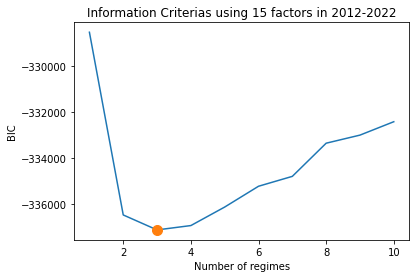

In [62]:
plt.figure()
plt.title("Information Criterias using 15 factors in 2012-2022")
plt.plot(np.arange(1, 11), bic[:10])
plt.plot(1+np.argmin(bic[:10]), min(bic[:10]), marker = '.', markersize = 20)
plt.xlabel("Number of regimes")
plt.ylabel("BIC")
plt.show()

In [63]:
pd.concat(statistics[2], axis = 1)

,Mean Regime 1,Mean Regime 2,Mean Regime 3,Vol Regime 1,Vol Regime 2,Vol Regime 3,SR Regime 1,SR Regime 2,SR Regime 3,Regime1,Regime2,Regime3
Interest Rate,0.013977,-0.010101,-0.330843,0.039487,0.061451,0.123918,0.353969,-0.164373,-2.669850,NaN,NaN,NaN
Equity,0.222164,-0.353766,-1.441530,0.083360,0.205813,0.509551,2.665119,-1.718874,-2.829021,NaN,NaN,NaN
Credit,0.078357,-0.035188,-0.566532,0.018463,0.039374,0.144004,4.243978,-0.893677,-3.934140,NaN,NaN,NaN
Commodities,0.080448,0.065823,-2.873858,0.153810,0.308608,0.633785,0.523035,0.213289,-4.534435,NaN,NaN,NaN
Emerging Market,0.106474,-0.141871,-1.433477,0.067211,0.120388,0.293534,1.584167,-1.178446,-4.883519,NaN,NaN,NaN
Foreign Currency,0.012559,-0.013126,-0.253782,0.019604,0.025516,0.079223,0.640658,-0.514410,-3.203385,NaN,NaN,NaN
Local Inflation,0.040127,0.000826,-0.316224,0.032881,0.052357,0.134857,1.220369,0.015779,-2.344892,NaN,NaN,NaN
Equity Short Volatility,0.191484,-0.286901,-1.087453,0.051857,0.178878,0.520796,3.692522,-1.603893,-2.088058,NaN,NaN,NaN
Fixed Income Carry,0.049895,-0.066661,-0.483893,0.041962,0.058389,0.141713,1.189044,-1.141670,-3.414596,NaN,NaN,NaN
Foreign Exchange Carry,0.061419,0.011783,-1.124752,0.066035,0.114347,0.243692,0.930099,0.103042,-4.615470,NaN,NaN,NaN


# **OUT OF SAMPLE PNL**



In [64]:
def GMM_out_of_sample(data, start_year, k = 2, num_of_factors = 15, num_of_regimes = 4, alpha = 1, threshold = 0):
    '''
    INPUT:
    data: All the factors, including training and testing
    start_year: The year to start trading
    k: long top k factors, and short bottom k factors
    num_of_factors: number of factors used in GMM model
    num_of_regimes: number of regimes used in GMM model
    alpha: EWMA used to smooth the probabilities. If alpha = 0, then no moving average is done.
    threshold: parameter to smooth the regimes. If threshold = 0, then no threhold is set.

    RETURN:
    A dataframe with detected regimes for each day and returns for each day
    '''

    data = data.iloc[:, :num_of_factors]
    end_year = data.index[-1].year
    year_lst = np.arange(start_year, end_year+1)
    PNL = pd.DataFrame(columns = ['regime', 'return'])
    for year in year_lst:
        train = data.loc[data.index < datetime(year, 1, 1)]
        test = data.loc[(data.index >= datetime(year, 1, 1)) & (data.index <= datetime(year, 12, 31))]
        pnl = pd.DataFrame(index = test.index, columns = ['regime', 'return'])
        model = mix.GaussianMixture(n_components = num_of_regimes, random_state = 42)
        model.fit(train)
        hidden_states = pd.DataFrame(index = test.index, columns = ['regime', 'max prob'])
        # Notice the shift in test to one day later!
        hidden_states['regime'] = pd.DataFrame(model.predict_proba(test.shift(1).fillna(0))).ewm(alpha = alpha).mean().idxmax(axis = 1).values 
        hidden_states['max prob'] = pd.DataFrame(model.predict_proba(test.shift(1).fillna(0))).ewm(alpha = alpha).mean().max(axis = 1).values
        for i in range(hidden_states.shape[0]):
            if hidden_states.iloc[i]['max prob'] <= threshold:
                hidden_states.iloc[i, 0] = hidden_states.iloc[i-1, 0]
        pnl['regime'] = hidden_states['regime']

        in_sample = model.predict(train)
        sharpe_df = pd.DataFrame(index = train.columns)
        for i in range(model.n_components):
            state_i_df = train.iloc[in_sample==i]
            sharpe_df["SR Regime " + str(i)] = (state_i_df.mean() *252)/(state_i_df.std() * np.sqrt(252))

        factor_dict_long = {}
        factor_dict_short = {}
        for i in range(model.n_components):
            factor_dict_long[i] = sharpe_df['SR Regime ' + str(i)].nlargest(k).index.to_list()
            factor_dict_short[i] = sharpe_df['SR Regime ' + str(i)].nsmallest(k).index.to_list()

        positions = pd.DataFrame(index = test.index, columns = test.columns)
        for i in range(model.n_components):
            indices = pnl[pnl['regime'] == i].index
            positions.loc[indices, factor_dict_long[i]] = 1
            positions.loc[indices, factor_dict_short[i]] = -1
        positions = positions.fillna(0)
        ret = (positions * test).sum(axis = 1)/k
        pnl['return'] = ret
        PNL = PNL.append(pnl)
    
    return PNL

In [65]:
def pnl_analysis(pnl):
    '''
    A helper function used to analyze the pnl of the simulated strategy and plot the PnL curve for the strategy.

    INPUT:
    pnl: A pandas dataframe, with columns: regime (regime detected for each day) and return (return of the strategy for each day)

    RETURN:
    percentage_of_regime_switches: the number of regime switches divided by total number of days
    sharpe_ratio: annualized sharpe ratio of the strategy
    '''
    plt.plot((1+pnl['return']).cumprod())
    plt.xlabel('date')
    plt.ylabel('cumulative return')
    plt.show()
    plt.close()
    pnl['regime change'] = pnl['regime'] - pnl['regime'].shift(1)
    percentage_of_regime_switches = pnl[pnl['regime change'] != 0].shape[0] / pnl.shape[0]
    sharpe_ratio = (pnl['return'].mean() / pnl['return'].std()) * np.sqrt(252)

    return percentage_of_regime_switches, sharpe_ratio

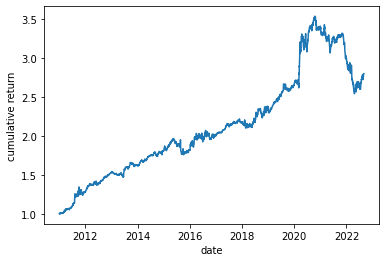

(0.2881118881118881, 1.028132633765121)

In [66]:
pnl = GMM_out_of_sample(data = final_df, start_year = 2011)
pnl_analysis(pnl)

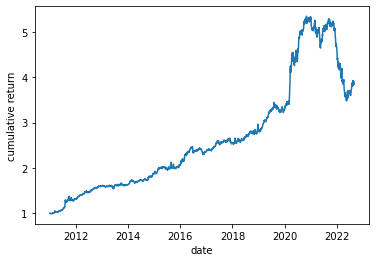

(0.2881118881118881, 1.2396415751887497)

In [67]:
# change the long/short factors to be 1
pnl = GMM_out_of_sample(data = final_df, start_year = 2011, k = 1)
pnl_analysis(pnl)

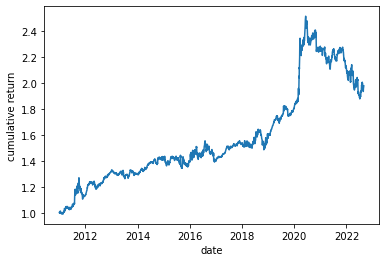

(0.10244755244755245, 0.7159923734052421)

In [68]:
# Using a threshold of probability 0.95
pnl = GMM_out_of_sample(data = final_df, start_year = 2011, threshold = 0.95)
pnl_analysis(pnl)

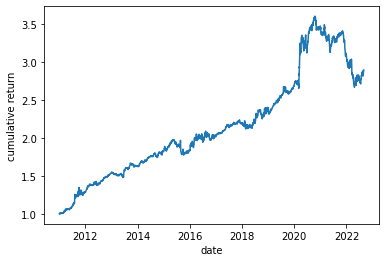

(0.28076923076923077, 1.0632930531714748)

In [69]:
# changing the EWMA alpha parameter to be 0.95
pnl = GMM_out_of_sample(data = final_df, start_year = 2011, alpha = 0.95)
pnl_analysis(pnl)

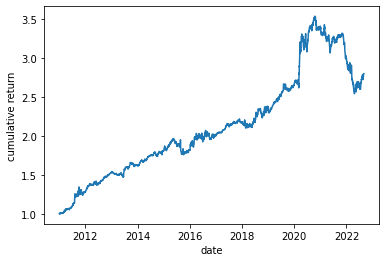

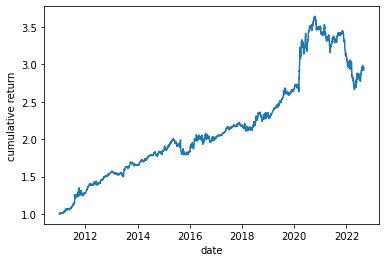

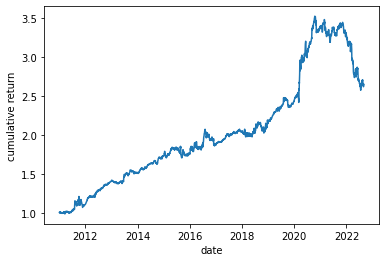

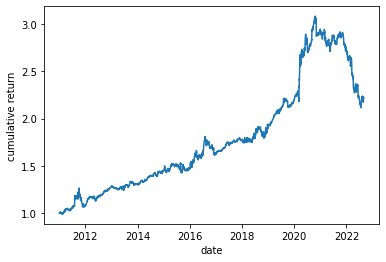

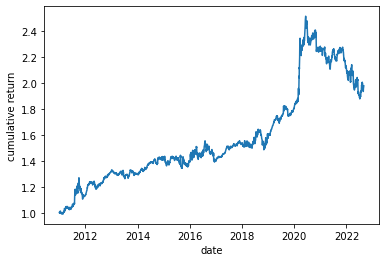

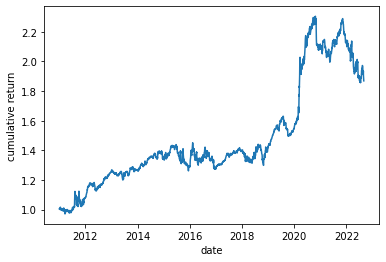

,alpha,threshold,percentage of regime switches,sharpe ratio
0,1,0.00,28.81 %,1.028133
1,1,0.50,27.31 %,1.080158
2,1,0.80,16.89 %,0.991226
3,1,0.90,13.71 %,0.817645
4,1,0.95,10.24 %,0.715992
5,1,0.99,5.77 %,0.650238


In [70]:
alpha = 1
res_alpha0 = {}
for threshold in [0, 0.5, 0.8, 0.9, 0.95, 0.99]:
  pnl = GMM_out_of_sample(data = final_df, start_year = 2011, k = 2, alpha = alpha, threshold = threshold)
  res_alpha0[threshold] = [pnl_analysis(pnl)]
res0 = pd.DataFrame(res_alpha0, index = ['r']).T
res0['percentage of regime switches'] = res0['r'].apply(lambda x: str(round(x[0] * 100,2)) + ' %')
res0['sharpe ratio'] = res0['r'].apply(lambda x: x[1])
res0['alpha'] = 1
res0['threshold'] = res0.index
res0 = res0[['alpha', 'threshold', 'percentage of regime switches', 'sharpe ratio']].reset_index().drop('index', axis = 1)
res0

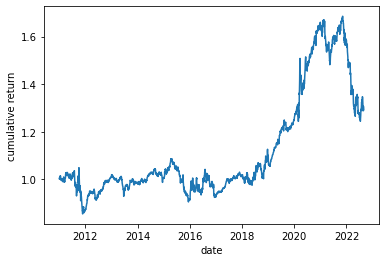

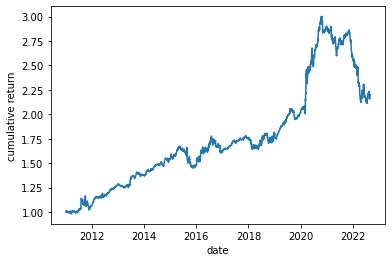

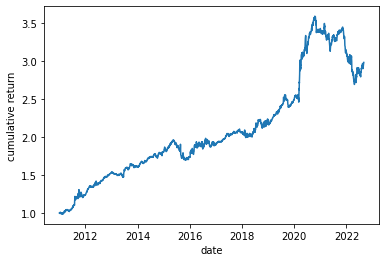

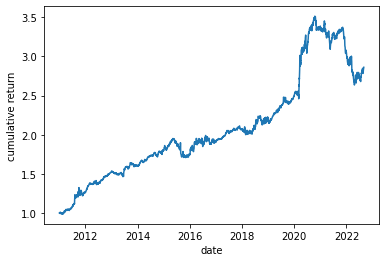

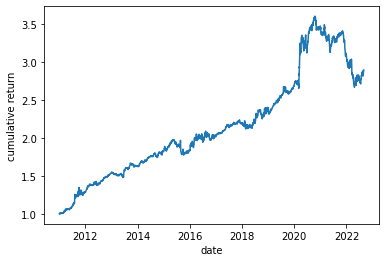

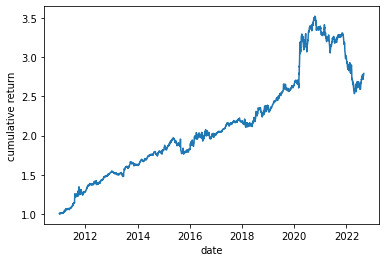

,alpha,threshold,percentage of regime switches,sharpe ratio
0,0.10,0,3.29 %,0.297407
1,0.50,0,20.31 %,0.806231
2,0.80,0,26.01 %,1.092707
3,0.90,0,27.24 %,1.051488
4,0.95,0,28.08 %,1.063293
5,0.99,0,28.67 %,1.025635


In [71]:
threshold = 0
res_threshold0 = {}
for alpha in [0.1, 0.5, 0.8, 0.9, 0.95, 0.99]:
  pnl = GMM_out_of_sample(data = final_df, start_year = 2011, k = 2, alpha = alpha, threshold = threshold)
  res_threshold0[alpha] = [pnl_analysis(pnl)]
res1 = pd.DataFrame(res_threshold0, index = ['r']).T
res1['percentage of regime switches'] = res1['r'].apply(lambda x: str(round(x[0] * 100,2)) + ' %')
res1['sharpe ratio'] = res1['r'].apply(lambda x: x[1])
res1['threshold'] = 0
res1['alpha'] = res1.index
res1 = res1[['alpha', 'threshold', 'percentage of regime switches', 'sharpe ratio']].reset_index().drop('index', axis = 1)
res1

# **LONG ONLY PORTFOLIOS CONSTRUCTION**

## **TOP SHARPE AND MARKOWITZ PORTFOLIOS**

### **UTILITY FUNCTIONS**

In [72]:
# https://colab.research.google.com/github/cvxgrp/cvx_short_course/blob/master/applications/portfolio_optimization.ipynb#scrollTo=STo0LxbrduDk

def portfolio_optimizer(mu, Sigma, gamma_range=[-1, 4], SAMPLES = 100):
  n = len(mu)
  w = cp.Variable(n)
  gamma = cp.Parameter(nonneg=True)
  ret = mu @ w
  risk = cp.quad_form(w, Sigma)
  zero_w_list = [i for i in range(len(mu)) if mu[i] < 0]
  prob = cp.Problem(cp.Maximize(ret - gamma * risk), [cp.sum(w) == 1, w >= 0])
  risk_data = np.zeros(SAMPLES)
  ret_data = np.zeros(SAMPLES)
  w_data = []
  gamma_vals = np.logspace(gamma_range[0], gamma_range[1], num=SAMPLES)
  for i in range(SAMPLES):
      gamma.value = gamma_vals[i]
      prob.solve()
      risk_data[i] = cp.sqrt(risk).value
      ret_data[i] = ret.value
      w_data.append(w.value)
  return ret_data, risk_data, w_data


def markowitz_beta(mu, Sigma, betas, target_beta):
    n = len(mu)
    w = cp.Variable(n)
    gamma = cp.Parameter(nonneg=True)
    ret = mu @ w
    risk = cp.quad_form(w, Sigma)

    prob = cp.Problem(cp.Minimize(risk), [cp.sum(w) == 1, cp.multiply(w,betas)==target_beta])
    prob.solve()
    risk_data = cp.sqrt(risk).value
    ret_data = ret.value
    w_data = w.value

    return ret_data, risk_data, w_data 

In [73]:
def max_drawdown(wealth):
  roll_max = wealth.cummax()
  Daily_Drawdown = wealth/roll_max - 1.0
  Max_Daily_Drawdown = Daily_Drawdown.min()
  return -Max_Daily_Drawdown

In [74]:
class Regime_Switch_Portfolio:
    def __init__(self, X, factor, n_, k = 2, weekly_X = False, years = range(2015, 2023), startdate = '2015-01-01', train_years = 13, seed=42) -> None:
        # factor is daily, X is daily or weekly
        self.mw_df = pd.DataFrame(0, index = factor[factor.index >= startdate].index, 
                                  columns=['regime_mw_ret', 'regime_mw_nv', 'no_regime_mw_ret', 'no_regime_mw_nv', 
                                           'regime_ms_ret','regime_ms_nv','no_regime_ms_ret','no_regime_ms_nv',
                                           'ew_ret', 'ew_nv'])
        self.data = X
        self.factor = factor
        self.years = years
        self.long_k = k
        self.weight_dict = {key:None for key in self.years}
        self.efficient_f = {key:{z:[] for z in range(n_)} for key in self.years}
        self.eff_point = {key:{z:[] for z in range(n_)} for key in self.years}
        self.inverse_p = {key:{z:[] for z in range(n_)} for key in self.years}
        self.train_years = train_years
        # self.dates = list(self.data.index)
        self.regime_num = n_
        self.stats = pd.DataFrame(np.nan, index=['annualized return', 'Sharpe', "MDD", "Calmar"], columns=['regime_mw','no_regime_mw','regime_ms','no_regime_ms','equal_weight']+list(factor.columns))
        self.weekly_X = weekly_X
        self.seed = seed
        self.loop_cal()
        self.nv_cal()
        
    
    def get_test_regime_weekly_majority_vote(self, year, daily_regime):
        '''
        input: 
          year: test year;
          daily_regime: test_regime from GMM_train_test 
        output:
          daily regime to hold (change on a weekly basis)
        '''
        weekly_first_date = daily_regime.resample('W').first().index
        weekly_first_date = [x + timedelta(days=1) for x in weekly_first_date] 
        weekly_regime_tohold = pd.DataFrame(index = daily_regime.index, columns=['regime'])
        for i in range(1,len(weekly_first_date)):
          last_week_regime = daily_regime.loc[(daily_regime.index < weekly_first_date[i])&(daily_regime.index >= weekly_first_date[i-1])]
          last_week_regime_count = last_week_regime.groupby('regime').size().sort_values()

          # if regime count are all ones, use the last date's regime
          if last_week_regime_count.iloc[-1] == 1:
            regime_max = int(last_week_regime.iloc[-1])
          # if regime count are 2 v.s. 2, use the regime in the latest date belong to those 2 regimes
          elif len(last_week_regime_count) not in [0,1] and last_week_regime_count.iloc[-1] == last_week_regime_count.iloc[-2]:
            last_date1 = last_week_regime[last_week_regime==last_week_regime_count.iloc[-1]].index[-1]
            last_date2 = last_week_regime[last_week_regime==last_week_regime_count.iloc[-2]].index[-1]
            regime_max = int(last_week_regime.loc[max(last_date1,last_date2)])
          # no equal counts, use the majority
          else:
            regime_max = last_week_regime_count.index[-1]

          if i != len(weekly_first_date) - 1:
            current_week_dates = daily_regime.loc[(daily_regime.index < weekly_first_date[i+1])&(daily_regime.index >= weekly_first_date[i])].index
          else:
            current_week_dates = daily_regime.loc[daily_regime.index >= weekly_first_date[i]].index
          weekly_regime_tohold.loc[current_week_dates, 'regime'] = regime_max
        weekly_regime_tohold = weekly_regime_tohold.dropna()
        return weekly_regime_tohold
              
    
    def GMM_train_test(self, training, test, train_f, test_f, num_of_regimes = 4, weekly_X = False, seed = 42):
        model = mix.GaussianMixture(n_components = num_of_regimes, random_state = seed)
        model.fit(training)
        
        train_result = model.predict(training)
        train_regime = pd.DataFrame(train_result, columns = ['regime'], index = training.index)

        test_result = model.predict(test)
        test_regime = pd.DataFrame(test_result, columns = ['regime'], index = test.index)

        if weekly_X:
            train_regime = train_regime.reindex(train_f.index)
            train_regime.ffill(inplace = True)
            train_regime.bfill(inplace = True)
            
            test_regime = test_regime.shift(1)
            test_regime = test_regime.reindex(test_f.index)
            test_regime.ffill(inplace = True)
            test_regime.bfill(inplace = True)

        mean_dict, std_dict, sharpe_dict, cov_dict = {}, {}, {}, {}
        for i in range(model.n_components):
            train_regime_i = train_regime[train_regime['regime'] == i]
            state_i_df = train_f.loc[train_regime_i.index]
            mean_dict[i] = state_i_df.mean() * 252
            std_dict[i] = state_i_df.std() * np.sqrt(252)
            sharpe_dict[i] = (state_i_df.mean() *252)/(state_i_df.std() * np.sqrt(252))
            cov_dict[i] = state_i_df.cov() * 252
            
        return mean_dict, std_dict, sharpe_dict, cov_dict, test_regime, train_regime

    def loop_cal(self):
        for test_year in self.years:
            test_start_date = datetime(test_year, 1, 1)
            test_end_date = datetime(test_year, 12, 31)
            train_start_date = datetime(test_year - self.train_years, 1, 1)

            train = self.data[(self.data.index >= train_start_date) & (self.data.index < test_start_date)]
            test = self.data[(self.data.index >= test_start_date) & (self.data.index <= test_end_date)]
            train_f =  self.factor[(self.factor.index >= train_start_date) & (self.factor.index < test_start_date)]
            test_f = self.factor[(self.factor.index >= test_start_date) & (self.factor.index <= test_end_date)]
 
            temp_mean, temp_std, temp_sharpe, temp_cov, test_regime, train_regime = self.GMM_train_test(train, test, train_f, test_f, self.regime_num, weekly_X = self.weekly_X, seed = self.seed)
            
            if not self.weekly_X:
                weekly_regime = self.get_test_regime_weekly_majority_vote(test_year, test_regime)
                weekly_regime_train = self.get_test_regime_weekly_majority_vote(test_year, train_regime)
            else:
                weekly_regime_train = train_regime
                weekly_regime = test_regime

            # regime max sharpe
            factor_dict_long = {}
            factor_dict_short = {}
            for i in range(self.regime_num):
                long_factors_sharpe = temp_sharpe[i].nlargest(self.long_k) 
                long_factors_sharpe = long_factors_sharpe[long_factors_sharpe > 0]
                factor_dict_long[i] = long_factors_sharpe.index.to_list()
            test_temp = test_f.loc[weekly_regime.index]
            positions = pd.DataFrame(index = test_temp.index, columns = test_temp.columns)
            pnl = pd.DataFrame(index = test_temp.index, columns = ['regime', 'return'])
            for i in range(self.regime_num):
                indices = weekly_regime[weekly_regime['regime'] == i].index
                positions.loc[indices, factor_dict_long[i]] = 1
            positions = positions.fillna(0)
            ret = (positions * test_temp).sum(axis = 1)/ positions.sum(axis = 1)
            pnl['return'] = ret
            pnl['regime'] = weekly_regime['regime']
            
            # no regime max sharpe
            mean = train_f.mean() * 252
            std = train_f.std() * np.sqrt(252)
            sharpe = (mean * 252)/(std * np.sqrt(252))
            long_factors_sharpe = sharpe.nlargest(self.long_k)
            long_factors_sharpe = long_factors_sharpe[long_factors_sharpe > 0]
            factor_to_long = long_factors_sharpe.index.to_list()

            positions = pd.DataFrame(index = test_f.index, columns = test_f.columns)
            pnl_ms_baseline = pd.DataFrame(index = test_f.index, columns = ['return'])
            positions[factor_to_long] = 1
            positions = positions.fillna(0)
            ret = (positions * test_f).sum(axis = 1)/ positions.sum(axis=1)
            pnl_ms_baseline['return'] = ret

            # regime Markowitz
            max_sharpe_w = []
            for i in range(self.regime_num):
                mu = np.array(temp_mean[i])
                Sigma = np.array(temp_cov[i])
                ret_data, risk_data, w_data = portfolio_optimizer(mu, Sigma, gamma_range=[-1, 4])
                idx = np.argmax(ret_data / risk_data)
                max_sharpe_w.append(w_data[idx])

                inv_weight = np.sqrt(1/Sigma.diagonal())/np.sum(np.sqrt(1/Sigma.diagonal()))
                self.inverse_p[test_year][i].append(np.sqrt(inv_weight @ Sigma @inv_weight.T))
                self.inverse_p[test_year][i].append(inv_weight @ mu)


                self.efficient_f[test_year][i].append(ret_data)
                self.efficient_f[test_year][i].append(risk_data)
                self.eff_point[test_year][i].append(risk_data[idx]) 
                self.eff_point[test_year][i].append(ret_data[idx]) 

            self.weight_dict[test_year]=max_sharpe_w

            # no regime Markowitz
            mu_all = np.array(train_f.mean(axis=0))
            cov_all = np.array(train_f.cov())
            ret_data, risk_data, w_data = portfolio_optimizer(mu_all, cov_all, gamma_range=[-1, 4]) 
            idx = np.argmax(ret_data / risk_data)

            for date in weekly_regime.index:
                self.mw_df.loc[date, 'regime_mw_ret'] =  test_f.loc[date,:] @ max_sharpe_w[int(weekly_regime.loc[date, 'regime'])]
                self.mw_df.loc[date, 'no_regime_mw_ret'] = test_f.loc[date,:] @ w_data[idx]
                self.mw_df.loc[date, 'ew_ret'] = test_f.loc[date,:].mean()

            self.mw_df.loc[weekly_regime.index, 'regime_ms_ret'] = pnl.loc[weekly_regime.index, 'return']
            self.mw_df.loc[weekly_regime.index, 'no_regime_ms_ret'] = pnl_ms_baseline.loc[weekly_regime.index, 'return']

    def calculate_stats(self, ret, nv):
        ar = (nv.iloc[-1] / nv.iloc[0]) ** (252 / len(nv)) - 1
        sharpe = (ret.mean() / ret.std()) * np.sqrt(252)
        mdd = max_drawdown(nv)
        Calmar = ret.mean() * 252 / max_drawdown(nv)
        return [ar, sharpe, mdd, Calmar]

    def nv_cal(self):
        self.mw_df.regime_mw_nv = (1+self.mw_df.regime_mw_ret).cumprod()
        self.mw_df.no_regime_mw_nv = (1+self.mw_df.no_regime_mw_ret).cumprod()
        self.mw_df.regime_ms_nv = (1+self.mw_df.regime_ms_ret).cumprod()
        self.mw_df.no_regime_ms_nv = (1+self.mw_df.no_regime_ms_ret).cumprod()
        self.mw_df.ew_nv = (1+self.mw_df.ew_ret).cumprod()

        self.stats['regime_mw'] = self.calculate_stats(self.mw_df.regime_mw_ret, self.mw_df.regime_mw_nv)
        self.stats['no_regime_mw'] = self.calculate_stats(self.mw_df.no_regime_mw_ret,self.mw_df.no_regime_mw_nv)
        self.stats['regime_ms'] = self.calculate_stats(self.mw_df.regime_ms_ret, self.mw_df.regime_ms_nv)
        self.stats['no_regime_ms'] = self.calculate_stats(self.mw_df.no_regime_ms_ret, self.mw_df.no_regime_ms_nv)
        self.stats['equal_weight'] = self.calculate_stats(self.mw_df.ew_ret, self.mw_df.ew_nv)
        
        for f in self.factor:
            factor_ret = self.factor.loc[self.mw_df.regime_mw_nv.index, f]
            factor_nv = (1+factor_ret).cumprod()
            self.stats[f] = self.calculate_stats(factor_ret, factor_nv)

    def plot_figure(self):
        self.mw_df[[ 'regime_mw_nv', 'no_regime_mw_nv','regime_ms_nv','no_regime_ms_nv', 'ew_nv']].plot()
        plt.legend(["Regime Markowitz",  'No Regime Markowitz', 'Regime Max Sharpe','No Regime Max Sharpe', 'Equal Weighted'])
        plt.xlabel("Date")
        plt.ylabel("Cumulative returns")
        plt.show()

    def print_stats(self):
        print("For " + str(self.regime_num) + " Regime Case:")
        display(self.stats)

    def eff_plot(self, year):
      color1 = ['orange', 'blue', 'green', 'red', 'black']
      for i in range(self.regime_num):
        plt.plot(self.efficient_f[year][i][1], self.efficient_f[year][i][0], color = color1[i])
        # plt.plot(self.eff_point[year][i][0], self.eff_point[year][i][1])
      for i in range(self.regime_num):
        # plt.plot(self.efficient_f[year][i][1], self.efficient_f[year][i][0])
        plt.plot(self.eff_point[year][i][0], self.eff_point[year][i][1], marker="o", markersize=5, 
                 markeredgecolor=color1[i], markerfacecolor=color1[i])
      for i in range(self.regime_num):
        # plt.plot(self.efficient_f[year][i][1], self.efficient_f[year][i][0])
        plt.plot(self.inverse_p[year][i][0], self.inverse_p[year][i][1], marker="o", markersize=5, 
                 markeredgecolor=color1[i], markerfacecolor=color1[i])
      plt.title("EFFICIENT FRONTIER for YEAR " + str(year))
      plt.legend(["Regime"+str(i) for i in range(1, self.regime_num+1)])
      plt.xlabel("std")
      plt.ylabel("Return")
      plt.show()

In [75]:
final_df.head()

,Interest Rate,Equity,Credit,Commodities,Emerging Market,Foreign Currency,Local Inflation,Equity Short Volatility,Fixed Income Carry,Foreign Exchange Carry,Trend Following,Low Risk,Momentum,Quality,Value
Date,,,,,,,,,,,,,,,
2002-04-03,0.003201,-0.004629,0.001418,-0.012797,-0.000021,-0.001560,0.005413,-0.008489,0.001839,-0.000877,-0.000618,0.000064,-0.006541,-0.000397,0.007077
2002-04-04,0.002607,-0.001380,0.000492,-0.023046,0.000037,-0.000398,0.002651,0.001399,0.005787,-0.001464,0.002117,0.000442,0.000402,-0.000150,-0.002165
2002-04-05,0.000826,-0.002263,0.000616,-0.015066,0.002990,-0.001601,0.002501,-0.001653,-0.002182,0.000683,0.000440,0.003700,-0.000063,0.003049,0.004912
2002-04-08,-0.001516,-0.004962,0.000173,0.009791,-0.003813,0.000355,0.000337,0.002653,0.000862,-0.002345,-0.004237,0.000937,0.005677,0.002057,-0.000864
2002-04-09,0.001067,-0.004521,0.000380,-0.015899,-0.000731,-0.000199,-0.000323,-0.005489,-0.002166,-0.000881,0.003179,0.001220,0.007328,0.001860,0.007096


### **USING DAILY DATA**

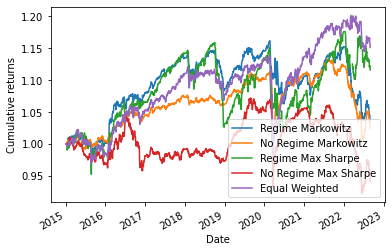

For 3 Regime Case:


,regime_mw,no_regime_mw,regime_ms,no_regime_ms,equal_weight,Interest Rate,Equity,Credit,Commodities,Emerging Market,Foreign Currency,Local Inflation,Equity Short Volatility,Fixed Income Carry,Foreign Exchange Carry,Trend Following,Low Risk,Momentum,Quality,Value
annualized return,0.004732,0.003186,0.014776,-0.008092,0.019000,-0.003122,0.040724,0.020479,0.034830,0.008423,-0.004885,0.022848,0.050055,-0.008571,0.022583,0.016588,0.014189,0.028935,0.018118,-0.028209
Sharpe,0.155483,0.134913,0.320274,-0.190944,0.460638,-0.040753,0.333760,0.568043,0.259500,0.133002,-0.182201,0.539280,0.426132,-0.133607,0.287266,0.337057,0.199424,0.307253,0.455721,-0.290639
MDD,0.108133,0.111323,0.120656,0.139635,0.139632,0.198352,0.352732,0.158942,0.574353,0.270648,0.063298,0.114048,0.311347,0.330282,0.198458,0.140133,0.217135,0.193224,0.111810,0.432696
Calmar,0.049032,0.031645,0.133357,-0.052833,0.141408,-0.010302,0.146214,0.132785,0.108501,0.048609,-0.074134,0.211388,0.188495,-0.021535,0.132166,0.130329,0.085686,0.184464,0.166848,-0.057748


In [76]:
r3 = Regime_Switch_Portfolio(final_df, final_df, 3, weekly_X = False) 
r3.plot_figure()
r3.print_stats()

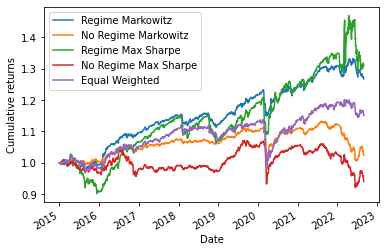

For 4 Regime Case:


,regime_mw,no_regime_mw,regime_ms,no_regime_ms,equal_weight,Interest Rate,Equity,Credit,Commodities,Emerging Market,Foreign Currency,Local Inflation,Equity Short Volatility,Fixed Income Carry,Foreign Exchange Carry,Trend Following,Low Risk,Momentum,Quality,Value
annualized return,0.032221,0.003186,0.036804,-0.008092,0.019000,-0.003122,0.040724,0.020479,0.034830,0.008423,-0.004885,0.022848,0.050055,-0.008571,0.022583,0.016588,0.014189,0.028935,0.018118,-0.028209
Sharpe,1.021803,0.134913,0.595877,-0.190944,0.460638,-0.040753,0.333760,0.568043,0.259500,0.133002,-0.182201,0.539280,0.426132,-0.133607,0.287266,0.337057,0.199424,0.307253,0.455721,-0.290639
MDD,0.067633,0.111323,0.124493,0.139635,0.139632,0.198352,0.352732,0.158942,0.574353,0.270648,0.063298,0.114048,0.311347,0.330282,0.198458,0.140133,0.217135,0.193224,0.111810,0.432696
Calmar,0.476273,0.031645,0.306901,-0.052833,0.141408,-0.010302,0.146214,0.132785,0.108501,0.048609,-0.074134,0.211388,0.188495,-0.021535,0.132166,0.130329,0.085686,0.184464,0.166848,-0.057748


In [77]:
r4 = Regime_Switch_Portfolio(final_df, final_df, 4, weekly_X = False) 
r4.plot_figure()
r4.print_stats()

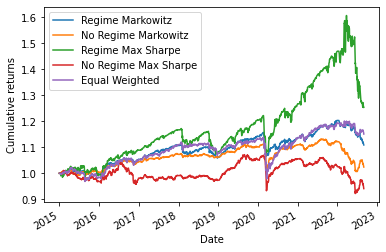

For 5 Regime Case:


,regime_mw,no_regime_mw,regime_ms,no_regime_ms,equal_weight,Interest Rate,Equity,Credit,Commodities,Emerging Market,Foreign Currency,Local Inflation,Equity Short Volatility,Fixed Income Carry,Foreign Exchange Carry,Trend Following,Low Risk,Momentum,Quality,Value
annualized return,0.013950,0.003186,0.030714,-0.008092,0.019000,-0.003122,0.040724,0.020479,0.034830,0.008423,-0.004885,0.022848,0.050055,-0.008571,0.022583,0.016588,0.014189,0.028935,0.018118,-0.028209
Sharpe,0.462056,0.134913,0.456859,-0.190944,0.460638,-0.040753,0.333760,0.568043,0.259500,0.133002,-0.182201,0.539280,0.426132,-0.133607,0.287266,0.337057,0.199424,0.307253,0.455721,-0.290639
MDD,0.078559,0.111323,0.219789,0.139635,0.139632,0.198352,0.352732,0.158942,0.574353,0.270648,0.063298,0.114048,0.311347,0.330282,0.198458,0.140133,0.217135,0.193224,0.111810,0.432696
Calmar,0.182483,0.031645,0.149436,-0.052833,0.141408,-0.010302,0.146214,0.132785,0.108501,0.048609,-0.074134,0.211388,0.188495,-0.021535,0.132166,0.130329,0.085686,0.184464,0.166848,-0.057748


In [78]:
r5 = Regime_Switch_Portfolio(final_df, final_df, 5, weekly_X = False) 
r5.plot_figure()
r5.print_stats()

### **USING WEEKLY DATA**

In [79]:
final_df_weekly = final_df.resample('W-MON').sum()

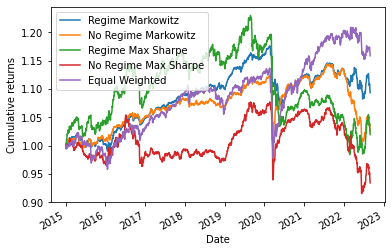

For 3 Regime Case:


,regime_mw,no_regime_mw,regime_ms,no_regime_ms,equal_weight,Interest Rate,Equity,Credit,Commodities,Emerging Market,Foreign Currency,Local Inflation,Equity Short Volatility,Fixed Income Carry,Foreign Exchange Carry,Trend Following,Low Risk,Momentum,Quality,Value
annualized return,0.011902,0.003136,0.002422,-0.009120,0.019923,-0.003122,0.040724,0.020479,0.034830,0.008423,-0.004885,0.022848,0.050055,-0.008571,0.022583,0.016588,0.014189,0.028935,0.018118,-0.028209
Sharpe,0.473186,0.136310,0.074004,-0.214379,0.476535,-0.040753,0.333760,0.568043,0.259500,0.133002,-0.182201,0.539280,0.426132,-0.133607,0.287266,0.337057,0.199424,0.307253,0.455721,-0.290639
MDD,0.088812,0.120139,0.199661,0.150097,0.139632,0.198352,0.352732,0.158942,0.574353,0.270648,0.063298,0.114048,0.311347,0.330282,0.198458,0.140133,0.217135,0.193224,0.111810,0.432696
Calmar,0.138191,0.029841,0.020866,-0.055707,0.147774,-0.010302,0.146214,0.132785,0.108501,0.048609,-0.074134,0.211388,0.188495,-0.021535,0.132166,0.130329,0.085686,0.184464,0.166848,-0.057748


In [80]:
r3_weekly = Regime_Switch_Portfolio(final_df_weekly, final_df, 3, weekly_X = True) 
r3_weekly.plot_figure()
r3_weekly.print_stats()

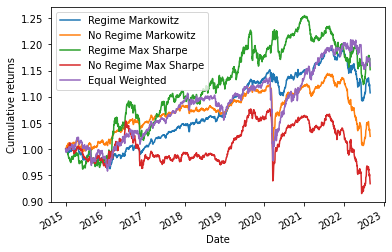

For 4 Regime Case:


,regime_mw,no_regime_mw,regime_ms,no_regime_ms,equal_weight,Interest Rate,Equity,Credit,Commodities,Emerging Market,Foreign Currency,Local Inflation,Equity Short Volatility,Fixed Income Carry,Foreign Exchange Carry,Trend Following,Low Risk,Momentum,Quality,Value
annualized return,0.013753,0.003136,0.019191,-0.009120,0.019923,-0.003122,0.040724,0.020479,0.034830,0.008423,-0.004885,0.022848,0.050055,-0.008571,0.022583,0.016588,0.014189,0.028935,0.018118,-0.028209
Sharpe,0.567059,0.136310,0.471530,-0.214379,0.476535,-0.040753,0.333760,0.568043,0.259500,0.133002,-0.182201,0.539280,0.426132,-0.133607,0.287266,0.337057,0.199424,0.307253,0.455721,-0.290639
MDD,0.084651,0.120139,0.104976,0.150097,0.139632,0.198352,0.352732,0.158942,0.574353,0.270648,0.063298,0.114048,0.311347,0.330282,0.198458,0.140133,0.217135,0.193224,0.111810,0.432696
Calmar,0.165034,0.029841,0.188523,-0.055707,0.147774,-0.010302,0.146214,0.132785,0.108501,0.048609,-0.074134,0.211388,0.188495,-0.021535,0.132166,0.130329,0.085686,0.184464,0.166848,-0.057748


In [81]:
r4_weekly = Regime_Switch_Portfolio(final_df_weekly, final_df, 4, weekly_X = True) 
r4_weekly.plot_figure()
r4_weekly.print_stats()

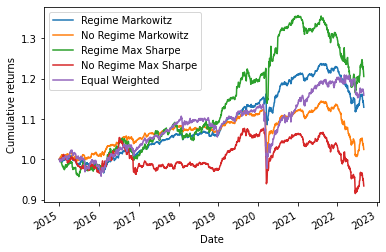

For 5 Regime Case:


,regime_mw,no_regime_mw,regime_ms,no_regime_ms,equal_weight,Interest Rate,Equity,Credit,Commodities,Emerging Market,Foreign Currency,Local Inflation,Equity Short Volatility,Fixed Income Carry,Foreign Exchange Carry,Trend Following,Low Risk,Momentum,Quality,Value
annualized return,0.016397,0.003136,0.025390,-0.009120,0.019923,-0.003122,0.040724,0.020479,0.034830,0.008423,-0.004885,0.022848,0.050055,-0.008571,0.022583,0.016588,0.014189,0.028935,0.018118,-0.028209
Sharpe,0.636035,0.136310,0.570462,-0.214379,0.476535,-0.040753,0.333760,0.568043,0.259500,0.133002,-0.182201,0.539280,0.426132,-0.133607,0.287266,0.337057,0.199424,0.307253,0.455721,-0.290639
MDD,0.096202,0.120139,0.140808,0.150097,0.139632,0.198352,0.352732,0.158942,0.574353,0.270648,0.063298,0.114048,0.311347,0.330282,0.198458,0.140133,0.217135,0.193224,0.111810,0.432696
Calmar,0.172209,0.029841,0.184728,-0.055707,0.147774,-0.010302,0.146214,0.132785,0.108501,0.048609,-0.074134,0.211388,0.188495,-0.021535,0.132166,0.130329,0.085686,0.184464,0.166848,-0.057748


In [82]:
r5_weekly = Regime_Switch_Portfolio(final_df_weekly, final_df, 5, weekly_X = True)
r5_weekly.plot_figure()
r5_weekly.print_stats()

## **DIFFERENT TRADING UNIVERSE PORTFOLIO**

In [83]:
invest_factors_us = pd.read_csv('https://raw.githubusercontent.com/DN612/Capstone-Regime-Detection/main/invest_factors_us.csv')
invest_factors_us['Date'] = pd.to_datetime(invest_factors_us['Date'])
invest_factors_us = invest_factors_us.set_index('Date')

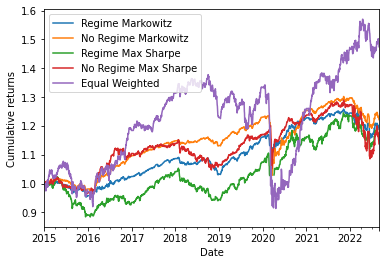

For 3 Regime Case:


,regime_mw,no_regime_mw,regime_ms,no_regime_ms,equal_weight,Interest Rate,Equity,Credit,Commodities,Emerging Markets,Local Inflation
annualized return,0.021993,0.025564,0.018474,0.016386,0.050173,0.008069,0.083937,0.030200,0.117190,0.009034,0.026036
Sharpe,0.585547,0.682443,0.390236,0.313972,0.474217,0.271664,0.523805,0.676085,0.584903,0.142255,0.531293
MDD,0.107225,0.167459,0.137077,0.157890,0.337235,0.921736,0.361026,0.170376,0.560758,0.268442,0.114709
Calmar,0.209773,0.155092,0.146831,0.113237,0.166048,0.151604,0.266905,0.181019,0.243622,0.050390,0.238617


In [84]:
r3 = Regime_Switch_Portfolio(final_df, invest_factors_us, 3, weekly_X = False) 
r3.plot_figure()
r3.print_stats()

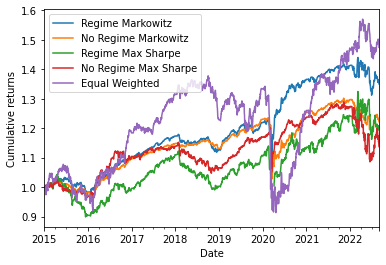

For 4 Regime Case:


,regime_mw,no_regime_mw,regime_ms,no_regime_ms,equal_weight,Interest Rate,Equity,Credit,Commodities,Emerging Markets,Local Inflation
annualized return,0.038592,0.025564,0.022864,0.016386,0.050173,0.008069,0.083937,0.030200,0.117190,0.009034,0.026036
Sharpe,0.882352,0.682443,0.375067,0.313972,0.474217,0.271664,0.523805,0.676085,0.584903,0.142255,0.531293
MDD,0.109447,0.167459,0.137942,0.157890,0.337235,0.921736,0.361026,0.170376,0.560758,0.268442,0.114709
Calmar,0.354850,0.155092,0.184259,0.113237,0.166048,0.151604,0.266905,0.181019,0.243622,0.050390,0.238617


In [85]:
r4 = Regime_Switch_Portfolio(final_df, invest_factors_us, 4, weekly_X = False) 
r4.plot_figure()
r4.print_stats()

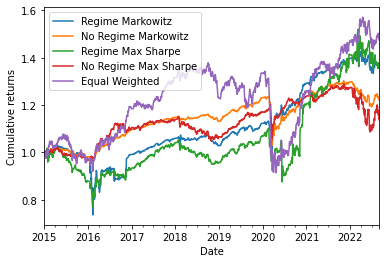

For 5 Regime Case:


,regime_mw,no_regime_mw,regime_ms,no_regime_ms,equal_weight,Interest Rate,Equity,Credit,Commodities,Emerging Markets,Local Inflation
annualized return,0.038929,0.025564,0.039864,0.016386,0.050173,0.008069,0.083937,0.030200,0.117190,0.009034,0.026036
Sharpe,0.460723,0.682443,0.423383,0.313972,0.474217,0.271664,0.523805,0.676085,0.584903,0.142255,0.531293
MDD,0.287271,0.167459,0.251019,0.157890,0.337235,0.921736,0.361026,0.170376,0.560758,0.268442,0.114709
Calmar,0.147687,0.155092,0.182548,0.113237,0.166048,0.151604,0.266905,0.181019,0.243622,0.050390,0.238617


In [86]:
r5 = Regime_Switch_Portfolio(final_df, invest_factors_us, 5, weekly_X = False) 
r5.plot_figure()
r5.print_stats()

## **PROBABILITY WEIGHTED PORTFOLIOS**

In [87]:
class Regime_Switch_Portfolio_Prob:
    def __init__(self, X, factor, n_, k = 2, weekly_X = False, years = range(2015, 2023), startdate = '2015-01-01', train_years = 13, weighted = False) -> None:
        # factor is daily, X is daily or weekly
        self.mw_df = pd.DataFrame(0, index = factor[factor.index >= startdate].index, 
                                  columns=['regime_mw_ret', 'regime_mw_nv', 'no_regime_mw_ret', 'no_regime_mw_nv', 
                                           'regime_ms_ret','regime_ms_nv','no_regime_ms_ret','no_regime_ms_nv',
                                           'weighted_regime_ms_ret', 'weighted_regime_ms_nv', 'weighted_regime_mw_ret', 'weighted_regime_mw_nv',
                                           'ew_ret', 'ew_nv'])
        self.data = X
        self.factor = factor
        self.years = years
        self.long_k = k
        self.weight_dict = {key:None for key in self.years}
        self.efficient_f = {key:{z:[] for z in range(n_)} for key in self.years}
        self.train_years = train_years
        self.weighted = weighted
        # self.dates = list(self.data.index)
        self.regime_num = n_
        self.stats = pd.DataFrame(np.nan, index=['annualized return', 'Sharpe', "MDD", "Calmar"], columns=['regime_mw','no_regime_mw','regime_ms','no_regime_ms','weighted_regime_ms','weighted_regime_mw','equal_weight']+list(factor.columns))
        self.weekly_X = weekly_X
        self.loop_cal()
        self.nv_cal()
            
    def get_test_regime_weekly_majority_vote(self, year, daily_regime, daily_prob):
        '''
        input: 
          year: test year;
          daily_regime: test_regime from GMM_train_test 
        output:
          daily regime to hold (change on a weekly basis)
        '''
        weekly_first_date = daily_regime.resample('W').first().index
        weekly_first_date = [x + timedelta(days=1) for x in weekly_first_date] 
        weekly_regime_tohold = pd.DataFrame(index = daily_regime.index, columns=['regime'])
        weekly_regime_probs = pd.DataFrame(index = daily_regime.index, columns=['regime ' + str(i) for i in range(self.regime_num)])

        for i in range(1,len(weekly_first_date)):
          last_week_regime = daily_regime.loc[(daily_regime.index < weekly_first_date[i])&(daily_regime.index >= weekly_first_date[i-1])]
          last_week_regime_count = last_week_regime.groupby('regime').size().sort_values()
          last_week_regime_prob = daily_prob.loc[(daily_prob.index < weekly_first_date[i])&(daily_prob.index >= weekly_first_date[i-1])]
          
          # if regime count are all ones, use the last date's regime
          if last_week_regime_count.iloc[-1] == 1:
            regime_max = int(last_week_regime.iloc[-1])
          # if regime count are 2 v.s. 2, use the regime in the latest date belong to those 2 regimes
          elif len(last_week_regime_count) not in [0,1] and last_week_regime_count.iloc[-1] == last_week_regime_count.iloc[-2]:
            last_date1 = last_week_regime[last_week_regime==last_week_regime_count.iloc[-1]].index[-1]
            last_date2 = last_week_regime[last_week_regime==last_week_regime_count.iloc[-2]].index[-1]
            regime_max = int(last_week_regime.loc[max(last_date1,last_date2)])
          # no equal counts, use the majority
          else:
            regime_max = last_week_regime_count.index[-1]

          if i != len(weekly_first_date) - 1:
            current_week_dates = daily_regime.loc[(daily_regime.index < weekly_first_date[i+1])&(daily_regime.index >= weekly_first_date[i])].index
          else:
            current_week_dates = daily_regime.loc[daily_regime.index >= weekly_first_date[i]].index
          weekly_regime_tohold.loc[current_week_dates, 'regime'] = regime_max
          weekly_regime_probs.loc[current_week_dates, weekly_regime_probs.columns] = list(last_week_regime_prob.mean())
        weekly_regime_tohold = weekly_regime_tohold.dropna()
        weekly_regime_probs = weekly_regime_probs.dropna()
        return weekly_regime_tohold, weekly_regime_probs
              
    
    def GMM_train_test(self, training, test, train_f, test_f, num_of_regimes = 4, weekly_X = False):
        model = mix.GaussianMixture(n_components = num_of_regimes, random_state = 42)
        model.fit(training)
        
        train_result = model.predict(training)
        train_regime = pd.DataFrame(train_result, columns = ['regime'], index = training.index)

        test_result = model.predict(test)
        test_regime = pd.DataFrame(test_result, columns = ['regime'], index = test.index)
        test_prob = pd.DataFrame(model.predict_proba(test), columns = ['regime ' + str(i) for i in range(self.regime_num)], index = test.index)

        if weekly_X:
            train_regime = train_regime.reindex(train_f.index)
            train_regime.ffill(inplace = True)
            train_regime.bfill(inplace = True)
            test_regime = test_regime.reindex(test_f.index)
            test_regime = test_regime.shift(1)
            test_regime.ffill(inplace = True)
            test_regime.bfill(inplace = True)

        mean_dict, std_dict, sharpe_dict, cov_dict = {}, {}, {}, {}
        for i in range(model.n_components):
            train_regime_i = train_regime[train_regime['regime'] == i]
            state_i_df = train_f.loc[train_regime_i.index]
            mean_dict[i] = state_i_df.mean() * 252
            std_dict[i] = state_i_df.std() * np.sqrt(252)
            sharpe_dict[i] = (state_i_df.mean() *252)/(state_i_df.std() * np.sqrt(252))
            cov_dict[i] = state_i_df.cov() * 252
            
        return mean_dict, std_dict, sharpe_dict, cov_dict, test_regime, train_regime, test_prob

    def loop_cal(self):
        for test_year in self.years:
            test_start_date = datetime(test_year, 1, 1)
            test_end_date = datetime(test_year, 12, 31)
            train_start_date = datetime(test_year - self.train_years, 1, 1)

            train = self.data[(self.data.index >= train_start_date) & (self.data.index < test_start_date)]
            test = self.data[(self.data.index >= test_start_date) & (self.data.index <= test_end_date)]
            train_f =  self.factor[(self.factor.index >= train_start_date) & (self.factor.index < test_start_date)]
            test_f = self.factor[(self.factor.index >= test_start_date) & (self.factor.index <= test_end_date)]

            temp_mean, temp_std, temp_sharpe, temp_cov, test_regime, train_regime, test_prob = self.GMM_train_test(train, test, train_f, test_f, self.regime_num, weekly_X = self.weekly_X) 

            if not self.weekly_X:
                weekly_regime, weekly_regime_probs = self.get_test_regime_weekly_majority_vote(test_year, test_regime, test_prob)
                #weekly_regime_train = self.get_test_regime_weekly_majority_vote(test_year, train_regime)
            else:
                weekly_regime_train = train_regime
                weekly_regime = test_regime

            # regime max sharpe
            factor_dict_long = {}
            factor_dict_short = {}
            for i in range(self.regime_num):
                long_factors_sharpe = temp_sharpe[i].nlargest(self.long_k) 
                long_factors_sharpe = long_factors_sharpe[long_factors_sharpe > 0]
                factor_dict_long[i] = long_factors_sharpe.index.to_list()
            test_temp = test_f.loc[weekly_regime.index]
            positions = pd.DataFrame(index = test_temp.index, columns = test_temp.columns)
            pnl = pd.DataFrame(index = test_temp.index, columns = ['regime', 'return'])
            for i in range(self.regime_num):
                indices = weekly_regime[weekly_regime['regime'] == i].index
                positions.loc[indices, factor_dict_long[i]] = 1
            positions = positions.fillna(0)
            ret = (positions * test_temp).sum(axis = 1)/ positions.sum(axis = 1)
            pnl['return'] = ret
            pnl['regime'] = weekly_regime['regime']
            
            # no regime max sharpe
            mean = train_f.mean() * 252
            std = train_f.std() * np.sqrt(252)
            sharpe = (mean * 252)/(std * np.sqrt(252))
            long_factors_sharpe = sharpe.nlargest(self.long_k)
            long_factors_sharpe = long_factors_sharpe[long_factors_sharpe > 0]
            factor_to_long = long_factors_sharpe.index.to_list()

            positions = pd.DataFrame(index = test_f.index, columns = test_f.columns)
            pnl_ms_baseline = pd.DataFrame(index = test_f.index, columns = ['return'])
            positions[factor_to_long] = 1
            positions = positions.fillna(0)
            ret = (positions * test_f).sum(axis = 1)/ positions.sum(axis=1)
            pnl_ms_baseline['return'] = ret

            # regime Markowitz
            max_sharpe_w = []
            for i in range(self.regime_num):
                mu = np.array(temp_mean[i])
                Sigma = np.array(temp_cov[i])
                ret_data, risk_data, w_data = portfolio_optimizer(mu, Sigma, gamma_range=[-1, 4])
                idx = np.argmax(ret_data / risk_data)
                max_sharpe_w.append(w_data[idx])
                self.efficient_f[test_year][i].append(ret_data)
                self.efficient_f[test_year][i].append([x**2 for x in risk_data]) 
            self.weight_dict[test_year]=max_sharpe_w

            # no regime Markowitz
            mu_all = np.array(train_f.mean(axis=0))
            cov_all = np.array(train_f.cov())
            ret_data, risk_data, w_data = portfolio_optimizer(mu_all, cov_all, gamma_range=[-1, 4]) 
            idx = np.argmax(ret_data / risk_data)

            for date in weekly_regime.index:
                self.mw_df.loc[date, 'regime_mw_ret'] =  test_f.loc[date,:] @ max_sharpe_w[int(weekly_regime.loc[date, 'regime'])]
                self.mw_df.loc[date, 'no_regime_mw_ret'] = test_f.loc[date,:] @ w_data[idx]
                self.mw_df.loc[date, 'ew_ret'] = test_f.loc[date,:].mean()

            # weighted regime max sharpe
            factor_dict_long = {}
            factor_dict_short = {}
            for i in range(self.regime_num):
              long_factors_sharpe = temp_sharpe[i].nlargest(self.long_k) 
              long_factors_sharpe = long_factors_sharpe[long_factors_sharpe > 0]
              factor_dict_long[i] = long_factors_sharpe.index.to_list()
            regimes_pnl = pd.DataFrame(0, columns = ['regime ' + str(i) for i in range(self.regime_num)], index = test_f.index)
            for i in range(self.regime_num):
              regimes_pnl.iloc[:, i] = test_f[factor_dict_long[i]].mean(axis = 1)

            regimes_pnl = regimes_pnl.reindex(weekly_regime_probs.index)
            weighted_pnl = (regimes_pnl * weekly_regime_probs).sum(axis = 1)
            self.mw_df.loc[weighted_pnl.index, 'weighted_regime_ms_ret'] = weighted_pnl

            # weighted regime Markowitz
            mw_pnls = pd.DataFrame(0, index = test_f.index, columns = ['regime ' + str(i) for i in range(self.regime_num)])
            for i in range(self.regime_num):
              mu = np.array(temp_mean[i])
              Sigma = np.array(temp_cov[i])
              ret_data, risk_data, w_data = portfolio_optimizer(mu, Sigma, gamma_range=[-1, 4])
              idx = np.argmax(ret_data / risk_data)
              max_sharpe_w = w_data[idx]
              mw_pnls.iloc[:, i] = test_f @ max_sharpe_w
            mw_pnls = mw_pnls.reindex(weekly_regime_probs.index)
            weighted_mw_pnls = (mw_pnls * weekly_regime_probs).sum(axis = 1)
            self.mw_df.loc[weighted_mw_pnls.index, 'weighted_regime_mw_ret'] = weighted_mw_pnls            

            self.mw_df.loc[weekly_regime.index, 'regime_ms_ret'] = pnl.loc[weekly_regime.index, 'return']
            self.mw_df.loc[weekly_regime.index, 'no_regime_ms_ret'] = pnl_ms_baseline.loc[weekly_regime.index, 'return']

    def calculate_stats(self, ret, nv):
        ar = (nv.iloc[-1] / nv.iloc[0]) ** (252 / len(nv)) - 1
        sharpe = (ret.mean() / ret.std()) * np.sqrt(252)
        mdd = max_drawdown(nv)
        Calmar = ret.mean() * 252 / max_drawdown(nv)
        return [ar, sharpe, mdd, Calmar]

    def nv_cal(self):
        self.mw_df.regime_mw_nv = (1+self.mw_df.regime_mw_ret).cumprod()
        self.mw_df.no_regime_mw_nv = (1+self.mw_df.no_regime_mw_ret).cumprod()
        self.mw_df.regime_ms_nv = (1+self.mw_df.regime_ms_ret).cumprod()
        self.mw_df.no_regime_ms_nv = (1+self.mw_df.no_regime_ms_ret).cumprod()
        self.mw_df.ew_nv = (1+self.mw_df.ew_ret).cumprod()
        self.mw_df.weighted_regime_ms_nv = (1+self.mw_df.weighted_regime_ms_ret).cumprod()
        self.mw_df.weighted_regime_mw_nv = (1+self.mw_df.weighted_regime_mw_ret).cumprod()

        self.stats['regime_mw'] = self.calculate_stats(self.mw_df.regime_mw_ret, self.mw_df.regime_mw_nv)
        self.stats['no_regime_mw'] = self.calculate_stats(self.mw_df.no_regime_mw_ret,self.mw_df.no_regime_mw_nv)
        self.stats['regime_ms'] = self.calculate_stats(self.mw_df.regime_ms_ret, self.mw_df.regime_ms_nv)
        self.stats['no_regime_ms'] = self.calculate_stats(self.mw_df.no_regime_ms_ret, self.mw_df.no_regime_ms_nv)
        self.stats['equal_weight'] = self.calculate_stats(self.mw_df.ew_ret, self.mw_df.ew_nv)
        self.stats['weighted_regime_ms'] = self.calculate_stats(self.mw_df.weighted_regime_ms_ret, self.mw_df.weighted_regime_ms_nv)
        self.stats['weighted_regime_mw'] = self.calculate_stats(self.mw_df.weighted_regime_mw_ret, self.mw_df.weighted_regime_mw_nv)
        
        
        for f in self.factor:
            factor_ret = self.factor.loc[self.mw_df.regime_mw_nv.index, f]
            factor_nv = (1+factor_ret).cumprod()
            self.stats[f] = self.calculate_stats(factor_ret, factor_nv)

    def plot_figure(self):
        plt.figure(figsize = (15,5))
        plt.plot(self.mw_df[[ 'regime_mw_nv', 'no_regime_mw_nv','regime_ms_nv','no_regime_ms_nv', 'weighted_regime_ms_nv', 'weighted_regime_mw_nv', 'ew_nv']])
        plt.legend(["Regime Markowitz",  'No Regime Markowitz', 'Regime Max Sharpe','No Regime Max Sharpe', 'Weighted Regime Max Sharpe', 'Weighted Regime Markowitz', 'Equal Weighted'])
        plt.xlabel("Date")
        plt.ylabel("Cumulative returns")
        plt.show()

    def print_stats(self):
        print("For " + str(self.regime_num) + " Regime Case:")
        display(self.stats)

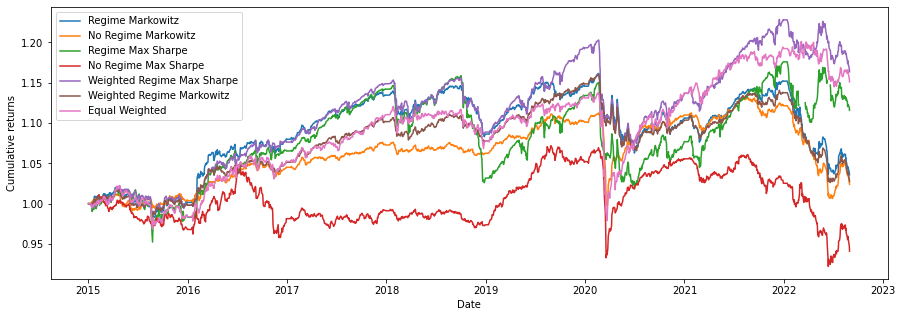

For 3 Regime Case:


,regime_mw,no_regime_mw,regime_ms,no_regime_ms,weighted_regime_ms,weighted_regime_mw,equal_weight,Interest Rate,Equity,Credit,...,Foreign Currency,Local Inflation,Equity Short Volatility,Fixed Income Carry,Foreign Exchange Carry,Trend Following,Low Risk,Momentum,Quality,Value
annualized return,0.004732,0.003186,0.014776,-0.008092,0.020479,0.003653,0.019000,-0.003122,0.040724,0.020479,...,-0.004885,0.022848,0.050055,-0.008571,0.022583,0.016588,0.014189,0.028935,0.018118,-0.028209
Sharpe,0.155483,0.134913,0.320274,-0.190944,0.521492,0.140703,0.460638,-0.040753,0.333760,0.568043,...,-0.182201,0.539280,0.426132,-0.133607,0.287266,0.337057,0.199424,0.307253,0.455721,-0.290639
MDD,0.108133,0.111323,0.120656,0.139635,0.109988,0.115557,0.139632,0.198352,0.352732,0.158942,...,0.063298,0.114048,0.311347,0.330282,0.198458,0.140133,0.217135,0.193224,0.111810,0.432696
Calmar,0.049032,0.031645,0.133357,-0.052833,0.191768,0.035169,0.141408,-0.010302,0.146214,0.132785,...,-0.074134,0.211388,0.188495,-0.021535,0.132166,0.130329,0.085686,0.184464,0.166848,-0.057748


In [88]:
r3 = Regime_Switch_Portfolio_Prob(final_df, final_df, 3, weekly_X = False) 
r3.plot_figure()
r3.print_stats()

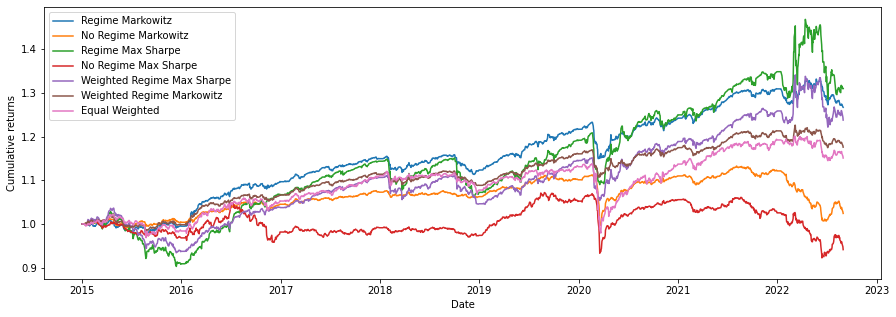

For 4 Regime Case:


,regime_mw,no_regime_mw,regime_ms,no_regime_ms,weighted_regime_ms,weighted_regime_mw,equal_weight,Interest Rate,Equity,Credit,...,Foreign Currency,Local Inflation,Equity Short Volatility,Fixed Income Carry,Foreign Exchange Carry,Trend Following,Low Risk,Momentum,Quality,Value
annualized return,0.032221,0.003186,0.036804,-0.008092,0.028977,0.021930,0.019000,-0.003122,0.040724,0.020479,...,-0.004885,0.022848,0.050055,-0.008571,0.022583,0.016588,0.014189,0.028935,0.018118,-0.028209
Sharpe,1.021803,0.134913,0.595877,-0.190944,0.612203,0.854829,0.460638,-0.040753,0.333760,0.568043,...,-0.182201,0.539280,0.426132,-0.133607,0.287266,0.337057,0.199424,0.307253,0.455721,-0.290639
MDD,0.067633,0.111323,0.124493,0.139635,0.098661,0.053530,0.139632,0.198352,0.352732,0.158942,...,0.063298,0.114048,0.311347,0.330282,0.198458,0.140133,0.217135,0.193224,0.111810,0.432696
Calmar,0.476273,0.031645,0.306901,-0.052833,0.301536,0.411479,0.141408,-0.010302,0.146214,0.132785,...,-0.074134,0.211388,0.188495,-0.021535,0.132166,0.130329,0.085686,0.184464,0.166848,-0.057748


In [89]:
r4 = Regime_Switch_Portfolio_Prob(final_df, final_df, 4, weekly_X = False) 
r4.plot_figure()
r4.print_stats()

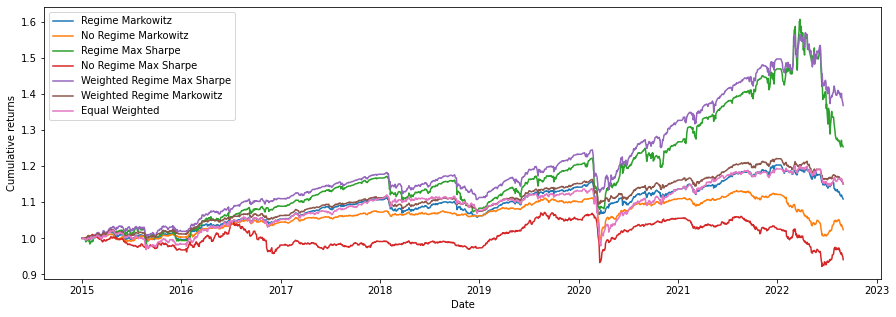

For 5 Regime Case:


,regime_mw,no_regime_mw,regime_ms,no_regime_ms,weighted_regime_ms,weighted_regime_mw,equal_weight,Interest Rate,Equity,Credit,...,Foreign Currency,Local Inflation,Equity Short Volatility,Fixed Income Carry,Foreign Exchange Carry,Trend Following,Low Risk,Momentum,Quality,Value
annualized return,0.013950,0.003186,0.030714,-0.008092,0.042846,0.018946,0.019000,-0.003122,0.040724,0.020479,...,-0.004885,0.022848,0.050055,-0.008571,0.022583,0.016588,0.014189,0.028935,0.018118,-0.028209
Sharpe,0.462056,0.134913,0.456859,-0.190944,0.798837,0.719919,0.460638,-0.040753,0.333760,0.568043,...,-0.182201,0.539280,0.426132,-0.133607,0.287266,0.337057,0.199424,0.307253,0.455721,-0.290639
MDD,0.078559,0.111323,0.219789,0.139635,0.128621,0.058395,0.139632,0.198352,0.352732,0.158942,...,0.063298,0.114048,0.311347,0.330282,0.198458,0.140133,0.217135,0.193224,0.111810,0.432696
Calmar,0.182483,0.031645,0.149436,-0.052833,0.337735,0.327480,0.141408,-0.010302,0.146214,0.132785,...,-0.074134,0.211388,0.188495,-0.021535,0.132166,0.130329,0.085686,0.184464,0.166848,-0.057748


In [90]:
r5 = Regime_Switch_Portfolio_Prob(final_df, final_df, 5, weekly_X = False) 
r5.plot_figure()
r5.print_stats()

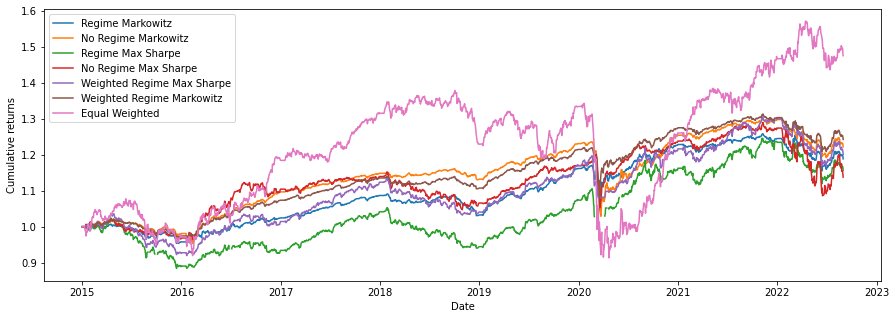

For 3 Regime Case:


,regime_mw,no_regime_mw,regime_ms,no_regime_ms,weighted_regime_ms,weighted_regime_mw,equal_weight,Interest Rate,Equity,Credit,Commodities,Emerging Markets,Local Inflation
annualized return,0.021993,0.025564,0.018474,0.016386,0.023344,0.027702,0.050173,0.008069,0.083937,0.030200,0.117190,0.009034,0.026036
Sharpe,0.585547,0.682443,0.390236,0.313972,0.508904,0.801483,0.474217,0.271664,0.523805,0.676085,0.584903,0.142255,0.531293
MDD,0.107225,0.167459,0.137077,0.157890,0.112104,0.113837,0.337235,0.921736,0.361026,0.170376,0.560758,0.268442,0.114709
Calmar,0.209773,0.155092,0.146831,0.113237,0.215959,0.245385,0.166048,0.151604,0.266905,0.181019,0.243622,0.050390,0.238617


In [91]:
r3 = Regime_Switch_Portfolio_Prob(final_df, invest_factors_us, 3, weekly_X = False) 
r3.plot_figure()
r3.print_stats()

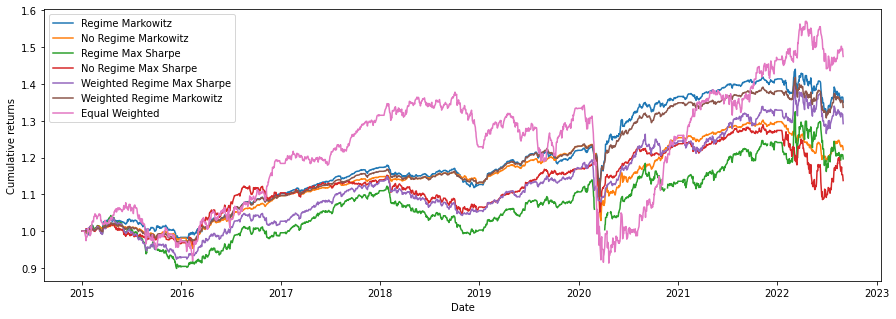

For 4 Regime Case:


,regime_mw,no_regime_mw,regime_ms,no_regime_ms,weighted_regime_ms,weighted_regime_mw,equal_weight,Interest Rate,Equity,Credit,Commodities,Emerging Markets,Local Inflation
annualized return,0.038592,0.025564,0.022864,0.016386,0.032833,0.037218,0.050173,0.008069,0.083937,0.030200,0.117190,0.009034,0.026036
Sharpe,0.882352,0.682443,0.375067,0.313972,0.624481,0.985013,0.474217,0.271664,0.523805,0.676085,0.584903,0.142255,0.531293
MDD,0.109447,0.167459,0.137942,0.157890,0.108084,0.116703,0.337235,0.921736,0.361026,0.170376,0.560758,0.268442,0.114709
Calmar,0.354850,0.155092,0.184259,0.113237,0.312459,0.319278,0.166048,0.151604,0.266905,0.181019,0.243622,0.050390,0.238617


In [92]:
r4 = Regime_Switch_Portfolio_Prob(final_df, invest_factors_us, 4, weekly_X = False) 
r4.plot_figure()
r4.print_stats()

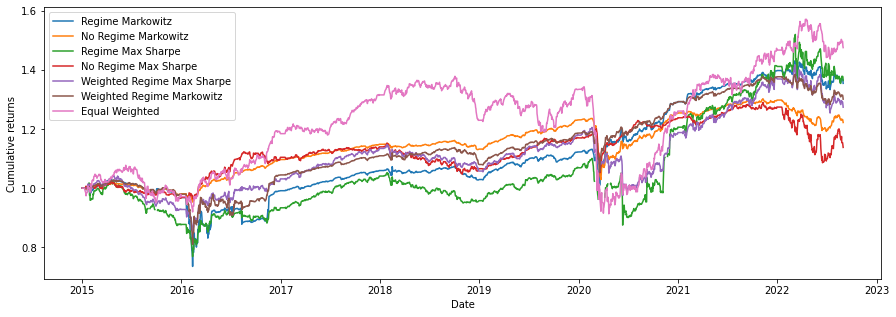

For 5 Regime Case:


,regime_mw,no_regime_mw,regime_ms,no_regime_ms,weighted_regime_ms,weighted_regime_mw,equal_weight,Interest Rate,Equity,Credit,Commodities,Emerging Markets,Local Inflation
annualized return,0.038929,0.025564,0.039864,0.016386,0.030933,0.033677,0.050173,0.008069,0.083937,0.030200,0.117190,0.009034,0.026036
Sharpe,0.460723,0.682443,0.423383,0.313972,0.423466,0.512788,0.474217,0.271664,0.523805,0.676085,0.584903,0.142255,0.531293
MDD,0.287271,0.167459,0.251019,0.157890,0.190742,0.211273,0.337235,0.921736,0.361026,0.170376,0.560758,0.268442,0.114709
Calmar,0.147687,0.155092,0.182548,0.113237,0.176318,0.168132,0.166048,0.151604,0.266905,0.181019,0.243622,0.050390,0.238617


In [93]:
r5 = Regime_Switch_Portfolio_Prob(final_df, invest_factors_us, 5, weekly_X = False) 
r5.plot_figure()
r5.print_stats()

# **ADDITIONAL CHECKS**

#### **CORRELATION CHECK**

In [94]:
spy = yf.download('SPY', start='2000-01-01', end='2022-01-01')
spyv = yf.download('SPYV', start='2000-01-01', end='2022-01-01')

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


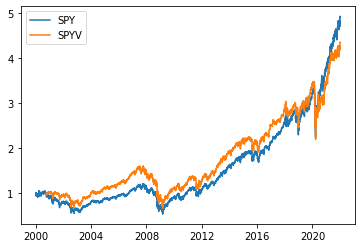

In [95]:
plt.plot(spy["Adj Close"]/spy["Adj Close"].iloc[0], label = "SPY")
plt.plot(spyv["Adj Close"]/spyv["Adj Close"].iloc[0], label = "SPYV")
plt.legend()
plt.show()

#### **INFALTION CHECK**

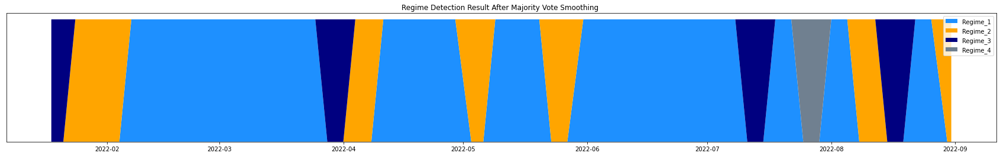

In [96]:
def get_test_data(year, num_of_regimes = 4, final_df = final_df):
    training = final_df[(final_df.index >= datetime(year-13, 1, 1)) & (final_df.index < datetime(year, 1, 1))]
    test = final_df[(final_df.index >= datetime(year, 1, 1)) & (final_df.index < datetime(year, 12, 31))]
    model = mix.GaussianMixture(n_components = num_of_regimes, random_state = 42)
    model.fit(training)
    test_regime = pd.DataFrame(model.predict(test), columns = ['regime'], index = test.index)
    return test_regime

test_regime = get_test_data(2022, 4, final_df)
majority_vote_res = majority_vote_weekly(2015, test_regime)
idx_lst =  majority_vote_res.groupby('regime to hold')['regime to hold'].count().sort_values(ascending = False).index

for i in range(4):
  majority_vote_res['Regime_'+str(i+1)] = majority_vote_res.apply(lambda row: label_regime (row, i+1, idx_lst), axis = 1)
majority_vote_res = majority_vote_res[['Regime_1','Regime_2','Regime_3','Regime_4']]
majority_vote_res

color_lst = ['dodgerblue','orange','navy','slategray','green','tan','purple','olive','pink','grey']
fig, ax = plt.subplots(figsize=(30,4))
ax.stackplot(majority_vote_res.index, majority_vote_res.T, colors = color_lst[:4],labels=majority_vote_res.columns)
ax.axes.get_yaxis().set_visible(False)
plt.title("Regime Detection Result After Majority Vote Smoothing ")
plt.legend()
plt.show()